In [1]:
import pandas as pd
import seaborn as sns
import matplotlib.pyplot as plt
import matplotlib as mpl
import numpy as np
from macrohet import visualise
from tqdm.auto import tqdm
import os
import warnings
warnings.simplefilter(action='ignore', category=FutureWarning)

# Conversion factor
meters_per_pixel = 1.4949402023919043E-07  # Micrometers per pixel
micrometers_per_pixel = meters_per_pixel*1E6 # Micrometers per pixel

In [289]:
df = pd.read_pickle('/mnt/SYNO/macrohet_syno/results/dfs/sc_df.pkl')


In [290]:
df

,ID,Time (hours),Mtb Area (µm),dMtb Area (µm),Mphi Area (µm),dMphi Area (µm),Infection Status,Initial Infection Status,Final Infection Status,x,...,Edge Status,Uptake,dMtb Area between frames (µm),Mtb Area Processed (µm),Time Model (hours),Mtb Area Model (µm),mtb_origin,Doubling Amounts,Doubling Times,r2
138,1.3.2.ND0002,0.0,0.000000,0.000000,4649.351562,2080.574775,NaN,False,False,107.845200,...,False,False,NaN,NaN,NaN,NaN,None,None,None,1.0
139,1.3.2.ND0002,0.5,0.000000,0.000000,4973.001953,2080.574775,NaN,False,False,113.264671,...,False,False,0.000000,NaN,NaN,NaN,None,None,None,1.0
140,1.3.2.ND0002,1.0,0.000000,0.000000,4687.857910,2080.574775,NaN,False,False,116.562256,...,False,False,0.000000,NaN,NaN,NaN,None,None,None,1.0
141,1.3.2.ND0002,1.5,0.000000,0.000000,4209.064453,2080.574775,NaN,False,False,111.890106,...,False,False,0.000000,NaN,NaN,NaN,None,None,None,1.0
142,1.3.2.ND0002,2.0,0.000000,0.000000,4061.855225,2080.574775,False,False,False,114.113556,...,False,False,0.000000,NaN,0.0,0.0,None,None,None,1.0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
1312257,998.5.5.ND0003,48.0,0.000000,-0.111742,813.037051,-539.871799,NaN,False,False,868.403076,...,False,False,0.000000,0.0,NaN,NaN,None,None,None,0.78
1312258,998.5.5.ND0003,48.5,0.000000,-0.111742,745.745831,-539.871799,NaN,False,False,868.194641,...,False,False,0.000000,0.0,NaN,NaN,None,None,None,0.78
1312259,998.5.5.ND0003,49.0,0.000000,-0.111742,668.219016,-539.871799,NaN,False,False,872.108582,...,False,False,0.000000,0.0,NaN,NaN,None,None,None,0.78
1312260,998.5.5.ND0003,49.5,0.000000,-0.111742,662.609552,-539.871799,NaN,False,False,871.521606,...,False,False,0.000000,0.0,NaN,NaN,None,None,None,0.78


In [291]:
# Prepare the subset DataFrame, filtering for WT strain or CTRL with RD1
subset_df = df[((df['Strain'] == 'WT') | ((df['Strain'] == 'RD1') & (df['Compound'] == 'CTRL'))) 
             & (df['r2'] >= 0.8) 
             & (df['Edge Status'] == False) 
             & (df['mtb_origin'] == 'Growth')  # are we really doing this right now? or after figure 3? 
              ].drop_duplicates(subset=['ID'])

# Continue with the usual process of exploding and filtering Doubling Times
subset_df = subset_df.explode('Doubling Times')
subset_df['Doubling Times'] = pd.to_numeric(subset_df['Doubling Times'], errors='coerce')
subset_df = subset_df[subset_df['Doubling Times'].notna()]
subset_df = subset_df[subset_df['Doubling Times'] > 0]
print(f'N={len(subset_df)}')

N=672


In [277]:
subset_df['mtb_origin'].unique()

array([None], dtype=object)

In [281]:
IDs = subset_df.ID.values

In [282]:
# Assuming `IDs` is your list of IDs and `df` is your DataFrame
df.loc[df['ID'].isin(IDs), 'mtb_origin'] = 'Growth'


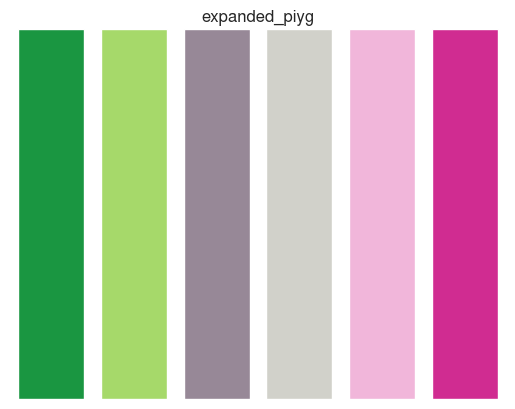

['#1a9641', '#a6d96a', '#978897', '#d1d1ca', '#f1b6da', '#d02c91']


In [210]:
# set display params
sns.set(style = 'white')
# Set the default font to Helvetica
mpl.rcParams['font.family'] = 'Nimbus Sans'
# import matplotlib as mpl
# mpl.rcdefaults()
# Get the color palette of the PiYG color map
expanded_piyg = visualise.color_palette('expanded_piyg').colors
sns.set_palette(expanded_piyg)
# Display the colors in the PiYG color map
visualise.show_colors('expanded_piyg')
print(expanded_piyg)

# Input figure size in millimeters
width_mm = 280  # for example, 180 mm
height_mm = 100  # for example, 80 mm

# Convert millimeters to inches (1 inch = 25.4 mm)
width_in = width_mm / 25.4
height_in = height_mm / 25.4

In [4]:
output_dir = '/mnt/SYNO/macrohet_syno/results/growth_rate/temp'#/mnt/DATA/macrohet/results/preliminary_sc_measures/cumulative_sc_plots/thresholded_480/'#'/Users/dayn/data/macrohet_mac/temp_results/'#
os.makedirs(output_dir, exist_ok = True)

# strip plot

In [70]:
# Prepare the subset DataFrame as before
subset_df = df[(df['r2'] >= 0.8) 
             & (df['Edge Status'] == False) 
             & (df['Strain'] != 'UNI') 
             & (df['Compound'] == 'CTRL')
             & (df['mtb_origin'] != 'Junk')
               ].drop_duplicates(subset=['ID'])
subset_df = subset_df.explode('Doubling Times')
subset_df['Doubling Times'] = pd.to_numeric(subset_df['Doubling Times'], errors='coerce')
subset_df = subset_df[subset_df['Doubling Times'].notna()]
subset_df = subset_df[subset_df['Doubling Times'] > 0]
print(f'N={len(subset_df)}')

N=1061


N=612


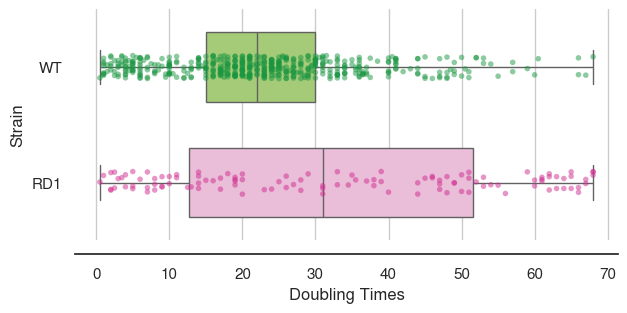

In [299]:
# Prepare the subset DataFrame as before
subset_df = df[(df['r2'] >= 0.8) 
             & (df['Edge Status'] == False) 
             & (df['Strain'] != 'UNI') 
             & (df['Compound'] == 'CTRL')
             & (df['mtb_origin'].isna()) # are we really doing this right now? or after figure 3? 
               ].drop_duplicates(subset=['ID'])
subset_df = subset_df.explode('Doubling Times')
subset_df['Doubling Times'] = pd.to_numeric(subset_df['Doubling Times'], errors='coerce')
subset_df = subset_df[subset_df['Doubling Times'].notna()]
subset_df = subset_df[subset_df['Doubling Times'] > 0]
print(f'N={len(subset_df)}')
# Initialize the figure (without logarithmic scale as doubling times are likely linear)
f, ax = plt.subplots(figsize=(7, 3))

# Create the boxplot for the doubling times by strain
sns.boxplot(
    data=subset_df, x="Doubling Times", y="Strain", hue="Strain", 
    whis=[0, 100], width=.6, palette=[expanded_piyg[1], expanded_piyg[-2]]
)

# Add a stripplot to show each observation
sns.stripplot(
    data=subset_df, x="Doubling Times", y="Strain", size=4, hue="Strain", palette=[expanded_piyg[0], expanded_piyg[-1]],
    alpha = 0.5
)

# Tweak the visual presentation
ax.xaxis.grid(True)
# ax.set(ylabel="")  # Remove y-axis label for a cleaner look
sns.despine(offset = 10, left=True)

# Save the figure
# plt.savefig(os.path.join(output_dir, 'boxplot_stripplot_doubling_times.pdf'), dpi=314)
plt.show()

### with percentages

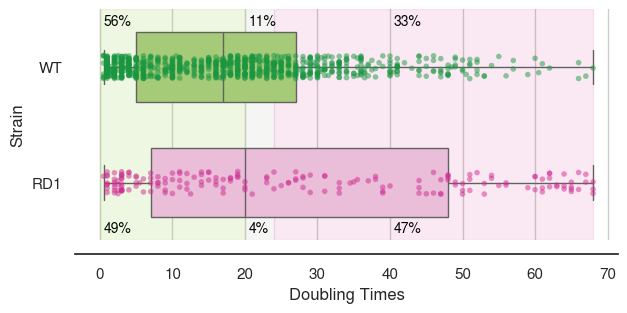

In [31]:
# Step 1: Bin the Doubling Times into categories
bins = [0, 20, 24, float('inf')]  # Define the bins: <20, 20-24, >24
labels = ['Fast', 'Medium', 'Slow']  # Labels for each bin
subset_df['Growth Category'] = pd.cut(subset_df['Doubling Times'], bins=bins, labels=labels, right=False)
# Step 2: Plot the boxplot and stripplot (same as before)
f, ax = plt.subplots(figsize=(7, 3))

sns.boxplot(
    data=subset_df, x="Doubling Times", y="Strain", hue="Strain", 
    whis=[0, 100], width=.6, palette=[expanded_piyg[1], expanded_piyg[-2]]
)

sns.stripplot(
    data=subset_df, x="Doubling Times", y="Strain", size=4, hue="Strain", 
    palette=[expanded_piyg[0], expanded_piyg[-1]], alpha=0.5
)

# Step 3: Add shaded regions for each category
# Shading for "Fast" (<20 hours)
ax.axvspan(0, 20, color=expanded_piyg[1], alpha=0.2, label='Fast (<20h)')
# Shading for "Medium" (20-24 hours)
ax.axvspan(20, 24, color=expanded_piyg[3], alpha=0.2, label='Normal (20-24h)')
# Shading for "Slow" (>24 hours)
ax.axvspan(24, max(subset_df['Doubling Times']), color=expanded_piyg[5], alpha=0.1, label='Slow (>24h)')

# Step 4: Calculate and add count and percentage labels for each strain in each growth category
total_counts = subset_df.groupby(['Strain', 'Growth Category']).size()  # Count occurrences per strain and category
strain_totals = subset_df['Strain'].value_counts()  # Total counts per strain

for category in labels:
    for strain in subset_df['Strain'].unique():
        # Get the count for the current strain and category
        count = total_counts.get((strain, category), 0)
        # Calculate the percentage for this strain in this category
        percentage = (count / strain_totals[strain]) * 100
        # Add the count and percentage label on the plot
        ax.text(
            0.5 + labels.index(category)*20 , (-0.4 if strain == 'WT' else 1.4), # Adjust position based on strain
            f"{percentage:.0f}%", 
            color="black", fontsize=10, va='center', ha='left'
        )

# Final tweaks
ax.xaxis.grid(True)
sns.despine(offset=10, left=True)

# Save the figure
# plt.savefig(os.path.join(output_dir, 'boxplot_stripplot_doubling_times_with_bins.pdf'), dpi=314)
plt.show()


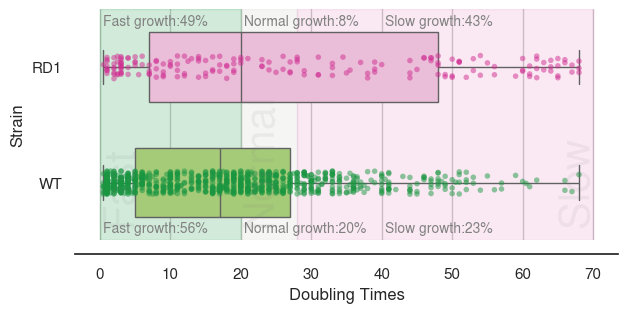

In [71]:
# Step 1: Bin the Doubling Times into categories
bins = [0, 20, 28, float('inf')]  # Define the bins: <20, 20-24, >24
labels = ['Fast', 'Normal', 'Slow']  # Labels for each bin
subset_df['Growth Category'] = pd.cut(subset_df['Doubling Times'], bins=bins, labels=labels, right=False)

# Step 2: Plot the boxplot and stripplot (same as before)
f, ax = plt.subplots(figsize=(7, 3))

sns.boxplot(
    data=subset_df, x="Doubling Times", y="Strain", hue="Strain", 
    whis=[0, 100], width=.6, palette=[expanded_piyg[1], expanded_piyg[-2]]
)

sns.stripplot(
    data=subset_df, x="Doubling Times", y="Strain", size=4, hue="Strain", 
    palette=[expanded_piyg[0], expanded_piyg[-1]], alpha=0.5
)

# Step 3: Add shaded regions for each category
# Shading for "Fast" (<20 hours)
ax.axvspan(0, 20, color=expanded_piyg[0], alpha=0.2, label='Fast (<20h)')
# Shading for "Medium" (20-24 hours)
ax.axvspan(20, 28, color=expanded_piyg[3], alpha=0.2, label='Normal (20-28h)')
# Shading for "Slow" (>24 hours)
ax.axvspan(28, 70, color=expanded_piyg[-1], alpha=0.1, label='Slow (>24h)')

# # Step 6: Add dashed lines to demarcate the zones
# ax.axvline(20, color='darkgray', linestyle='--', linewidth=1)  # Line between Fast and Normal
# ax.axvline(24, color='darkgray', linestyle='--', linewidth=1)  # Line between Normal and Slow

# Step 4: Calculate and add count and percentage labels for each strain in each growth category
total_counts = subset_df.groupby(['Strain', 'Growth Category']).size()  # Count occurrences per strain and category
strain_totals = subset_df['Strain'].value_counts()  # Total counts per strain

for category in labels:
    for strain in subset_df['Strain'].unique():
        # Get the count for the current strain and category
        count = total_counts.get((strain, category), 0)
        # Calculate the percentage for this strain in this category
        percentage = (count / strain_totals[strain]) * 100
        # Add the count and percentage label on the plot
        ax.text(
            0.5 + labels.index(category)*20 , (-0.4 if strain == 'WT' else 1.4), # Adjust position based on strain
            f"{category} growth:{percentage:.0f}%", 
            color="gray", fontsize=10, va='center', ha='left'
        )

# Step 5: Adjust y-limits to bring boxplots closer together
ax.set_ylim(-0.5, 1.5)  # Compresses the space between the two strains


# Step 6: Add vertical text labels within each category region
ax.text(0, -0.3, 'Fast', fontsize=30, color='gray', alpha=0.1, ha='left', va='baseline', rotation=90)
ax.text(20, -0.3, 'Normal', fontsize=30, color='gray', alpha=0.1, ha='left', va='baseline', rotation=90)
ax.text(70.5, -0.3, 'Slow', fontsize=30, color='gray', alpha=0.1, ha='right', va='baseline', rotation=90)


# Final tweaks
ax.xaxis.grid(True)
sns.despine(offset=10, left=True)

# Save the figure
# plt.savefig(os.path.join(output_dir, 'boxplot_stripplot_doubling_times_with_bins.pdf'), dpi=314)
plt.show()


### filtered with percentages

In [32]:
# Prepare the subset DataFrame as before
subset_df = df[(df['r2'] >= 0.8) 
             & (df['Edge Status'] == False) 
             & (df['Strain'] != 'UNI') 
             & (df['Compound'] == 'CTRL')
             & (df['mtb_origin'].isna()) # are we really doing this right now? or after figure 3? 
               ].drop_duplicates(subset=['ID'])
subset_df = subset_df.explode('Doubling Times')
subset_df['Doubling Times'] = pd.to_numeric(subset_df['Doubling Times'], errors='coerce')
subset_df = subset_df[subset_df['Doubling Times'].notna()]
subset_df = subset_df[subset_df['Doubling Times'] > 0]
print(f'N={len(subset_df)}')

N=456


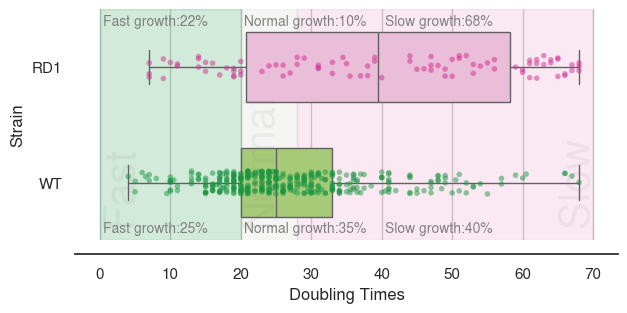

In [69]:
# Step 1: Bin the Doubling Times into categories
bins = [0, 20, 28, float('inf')]  # Define the bins: <20, 20-24, >24
labels = ['Fast', 'Normal', 'Slow']  # Labels for each bin
subset_df['Growth Category'] = pd.cut(subset_df['Doubling Times'], bins=bins, labels=labels, right=False)

# Step 2: Plot the boxplot and stripplot (same as before)
f, ax = plt.subplots(figsize=(7, 3))

sns.boxplot(
    data=subset_df, x="Doubling Times", y="Strain", hue="Strain", 
    whis=[0, 100], width=.6, palette=[expanded_piyg[1], expanded_piyg[-2]]
)

sns.stripplot(
    data=subset_df, x="Doubling Times", y="Strain", size=4, hue="Strain", 
    palette=[expanded_piyg[0], expanded_piyg[-1]], alpha=0.5
)

# Step 3: Add shaded regions for each category
# Shading for "Fast" (<20 hours)
ax.axvspan(0, 20, color=expanded_piyg[0], alpha=0.2, label='Fast (<20h)')
# Shading for "Medium" (20-24 hours)
ax.axvspan(20, 28, color=expanded_piyg[3], alpha=0.2, label='Normal (20-28h)')
# Shading for "Slow" (>24 hours)
ax.axvspan(28, 70, color=expanded_piyg[-1], alpha=0.1, label='Slow (>24h)')

# # Step 6: Add dashed lines to demarcate the zones
# ax.axvline(20, color='darkgray', linestyle='--', linewidth=1)  # Line between Fast and Normal
# ax.axvline(24, color='darkgray', linestyle='--', linewidth=1)  # Line between Normal and Slow

# Step 4: Calculate and add count and percentage labels for each strain in each growth category
total_counts = subset_df.groupby(['Strain', 'Growth Category']).size()  # Count occurrences per strain and category
strain_totals = subset_df['Strain'].value_counts()  # Total counts per strain

for category in labels:
    for strain in subset_df['Strain'].unique():
        # Get the count for the current strain and category
        count = total_counts.get((strain, category), 0)
        # Calculate the percentage for this strain in this category
        percentage = (count / strain_totals[strain]) * 100
        # Add the count and percentage label on the plot
        ax.text(
            0.5 + labels.index(category)*20 , (-0.4 if strain == 'WT' else 1.4), # Adjust position based on strain
            f"{category} growth:{percentage:.0f}%", 
            color="gray", fontsize=10, va='center', ha='left'
        )

# Step 5: Adjust y-limits to bring boxplots closer together
ax.set_ylim(-0.5, 1.5)  # Compresses the space between the two strains


# Step 6: Add vertical text labels within each category region
ax.text(0, -0.3, 'Fast', fontsize=30, color='gray', alpha=0.1, ha='left', va='baseline', rotation=90)
ax.text(20, -0.3, 'Normal', fontsize=30, color='gray', alpha=0.1, ha='left', va='baseline', rotation=90)
ax.text(70.5, -0.3, 'Slow', fontsize=30, color='gray', alpha=0.1, ha='right', va='baseline', rotation=90)


# Final tweaks
ax.xaxis.grid(True)
sns.despine(offset=10, left=True)

# Save the figure
# plt.savefig(os.path.join(output_dir, 'boxplot_stripplot_doubling_times_with_bins.pdf'), dpi=314)
plt.show()


### Now with antibiotic conditions

In [292]:
# Prepare the subset DataFrame, filtering for WT strain or CTRL with RD1
subset_df = df[((df['Strain'] == 'WT') | ((df['Strain'] == 'RD1') & (df['Compound'] == 'CTRL'))) 
             & (df['r2'] >= 0.8) 
             & (df['Edge Status'] == False) 
             & (df['mtb_origin'] == 'Growth')  # are we really doing this right now? or after figure 3? 
              ].drop_duplicates(subset=['ID'])

# Continue with the usual process of exploding and filtering Doubling Times
subset_df = subset_df.explode('Doubling Times')
subset_df['Doubling Times'] = pd.to_numeric(subset_df['Doubling Times'], errors='coerce')
subset_df = subset_df[subset_df['Doubling Times'].notna()]
subset_df = subset_df[subset_df['Doubling Times'] > 0]
print(f'N={len(subset_df)}')

N=672


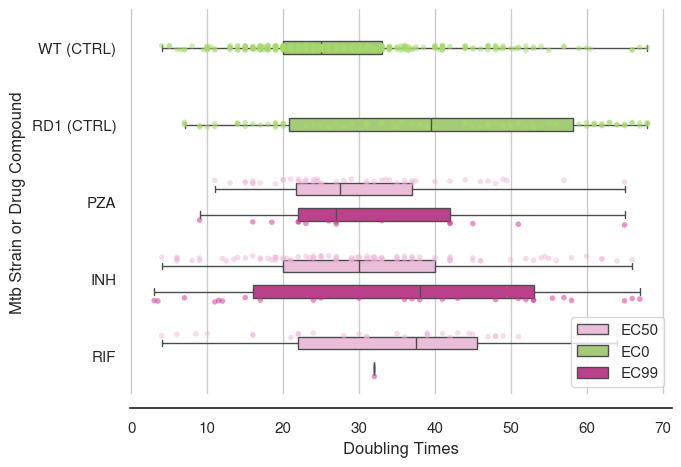

In [294]:
# Modify the DataFrame to place both WT and RD1 under the CTRL compound row
subset_df['Mtb Strain or Drug Compound'] = subset_df.apply(
    lambda row: f"{row['Strain']} (CTRL)" if row['Compound'] == 'CTRL' else row['Compound'], axis=1
)

# Define the desired order with WT and RD1 at the top
strain_order = ['WT (CTRL)', 'RD1 (CTRL)', 'PZA', 'INH', 'RIF']

# Initialize the figure
f, ax = plt.subplots(figsize=(7, 5))

# Define hue_order for consistency
hue_order = ['EC50', 'EC0', 'EC99']

# Create the boxplot with specified y-axis order
sns.boxplot(
    data=subset_df, x="Doubling Times", y="Mtb Strain or Drug Compound", hue="Concentration", 
    whis=[0, 100], width=.5, palette= [expanded_piyg[4],expanded_piyg[1], expanded_piyg[5]], 
    hue_order=hue_order, order=strain_order
)

# Add the stripplot with the same y-axis order
sns.stripplot(
    data=subset_df, x="Doubling Times", y="Mtb Strain or Drug Compound", hue="Concentration", size=4, 
    palette=[expanded_piyg[4],expanded_piyg[1], expanded_piyg[5]], 
    hue_order=hue_order, dodge=True, alpha=0.5, order=strain_order
)

# Remove the double legend
handles, labels = ax.get_legend_handles_labels()
ax.legend(handles[0:3], labels[0:3])

# Tweak visual presentation
ax.xaxis.grid(True)
sns.despine(offset=10, left=True)

# Show the plot
plt.show()

In [265]:
subset_df[(subset_df['Compound'] == 'RIF') & (subset_df['Concentration'] == 'EC99')]['Strain']

1097661     WT
1231803    RD1
1231803    RD1
1231803    RD1
Name: Strain, dtype: object

N=633


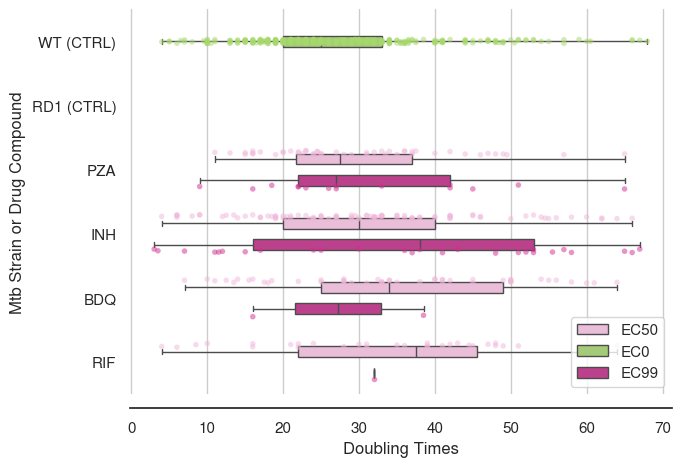

In [260]:
# Prepare the subset DataFrame as before
subset_df = df[(df['r2'] >= 0.8) 
             & (df['Edge Status'] == False) 
             & (df['Strain'] == 'WT') 
             # & (df['Compound'] == 'CTRL')
             & (df['mtb_origin'].isna()) # are we really doing this right now? or after figure 3? 
               ].drop_duplicates(subset=['ID'])
# Exclude CTRL rows without EC50 or EC99 values from causing alignment issues
# subset_df = subset_df[(subset_df['Compound'] != 'CTRL') | (subset_df['Concentration'] == 'EC0')]
subset_df = subset_df.explode('Doubling Times')
subset_df['Doubling Times'] = pd.to_numeric(subset_df['Doubling Times'], errors='coerce')
subset_df = subset_df[subset_df['Doubling Times'].notna()]
subset_df = subset_df[subset_df['Doubling Times'] > 0]
print(f'N={len(subset_df)}')


# Modify the DataFrame to place both WT and RD1 under the CTRL compound row
subset_df['Mtb Strain or Drug Compound'] = subset_df.apply(
    lambda row: f"{row['Strain']} (CTRL)" if row['Compound'] == 'CTRL' else row['Compound'], axis=1
)

# Define the desired order with WT and RD1 at the top
strain_order = ['WT (CTRL)', 'RD1 (CTRL)', 'PZA', 'INH', 'BDQ', 'RIF']

# Initialize the figure
f, ax = plt.subplots(figsize=(7, 5))

# Define hue_order for consistency
hue_order = ['EC50', 'EC0', 'EC99']

# Create the boxplot with specified y-axis order
sns.boxplot(
    data=subset_df, x="Doubling Times", y="Mtb Strain or Drug Compound", hue="Concentration", 
    whis=[0, 100], width=.5, palette= [expanded_piyg[4],expanded_piyg[1], expanded_piyg[5]], 
    hue_order=hue_order, order=strain_order
)

# Add the stripplot with the same y-axis order
sns.stripplot(
    data=subset_df, x="Doubling Times", y="Mtb Strain or Drug Compound", hue="Concentration", size=4, 
    palette=[expanded_piyg[4],expanded_piyg[1], expanded_piyg[5]], 
    hue_order=hue_order, dodge=True, alpha=0.5, order=strain_order
)

# Remove the double legend
handles, labels = ax.get_legend_handles_labels()
ax.legend(handles[0:3], labels[0:3])

# Tweak visual presentation
ax.xaxis.grid(True)
sns.despine(offset=10, left=True)

# Show the plot
plt.show()

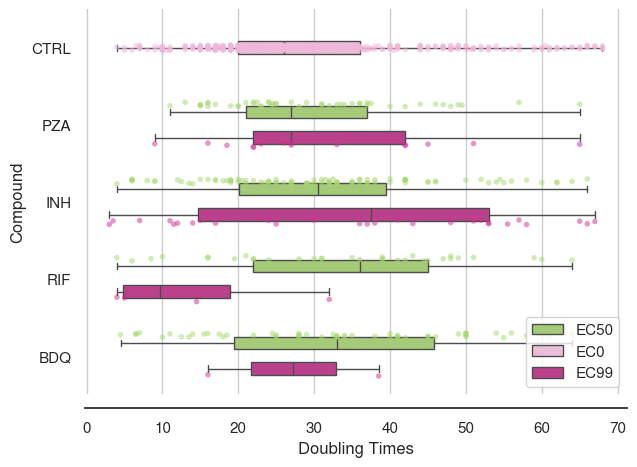

In [256]:


# Initialize the figure
f, ax = plt.subplots(figsize=(7, 5))

# Define hue_order for consistency
hue_order = ['EC50', 'EC0', 'EC99']

# Create the boxplot
sns.boxplot(
    data=subset_df, x="Doubling Times", y="Compound", hue="Concentration", 
    whis=[0, 100], width=.5, palette=[expanded_piyg[1], expanded_piyg[4], expanded_piyg[5]], hue_order=hue_order
)

# Add the stripplot
sns.stripplot(
    data=subset_df, x="Doubling Times", y="Compound", hue="Concentration", size=4, 
    palette=[expanded_piyg[1], expanded_piyg[4], expanded_piyg[5]], hue_order=hue_order, dodge=True, alpha=0.5
)

# Remove the double legend
handles, labels = ax.get_legend_handles_labels()
ax.legend(handles[0:3], labels[0:3])

# Tweak visual presentation
ax.xaxis.grid(True)
sns.despine(offset=10, left=True)

# Show the plot
plt.show()


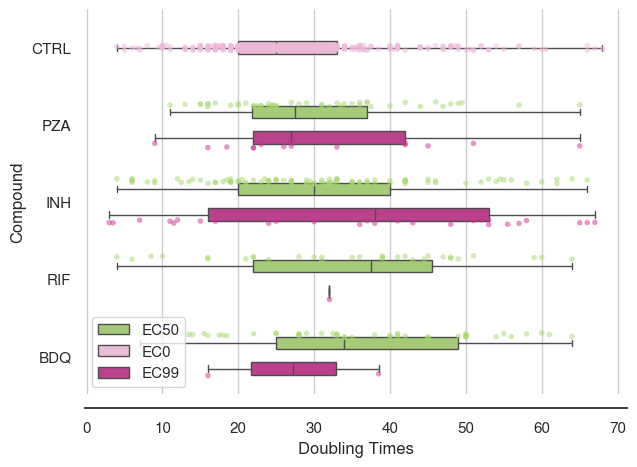

In [258]:


# Initialize the figure
f, ax = plt.subplots(figsize=(7, 5))

# Define hue_order for consistency
hue_order = ['EC50', 'EC0', 'EC99']

# Create the boxplot
sns.boxplot(
    data=subset_df, x="Doubling Times", y="Compound", hue="Concentration", 
    whis=[0, 100], width=.5, palette=[expanded_piyg[1], expanded_piyg[4], expanded_piyg[5]], hue_order=hue_order
)

# Add the stripplot
sns.stripplot(
    data=subset_df, x="Doubling Times", y="Compound", hue="Concentration", size=4, 
    palette=[expanded_piyg[1], expanded_piyg[4], expanded_piyg[5]], hue_order=hue_order, dodge=True, alpha=0.5
)

# Remove the double legend
handles, labels = ax.get_legend_handles_labels()
ax.legend(handles[0:3], labels[0:3])

# Tweak visual presentation
ax.xaxis.grid(True)
sns.despine(offset=10, left=True)

# Show the plot
plt.show()


/tmp/ipykernel_3699928/28558568.py:102: UserWarning: This figure includes Axes that are not compatible with tight_layout, so results might be incorrect.
  plt.tight_layout()


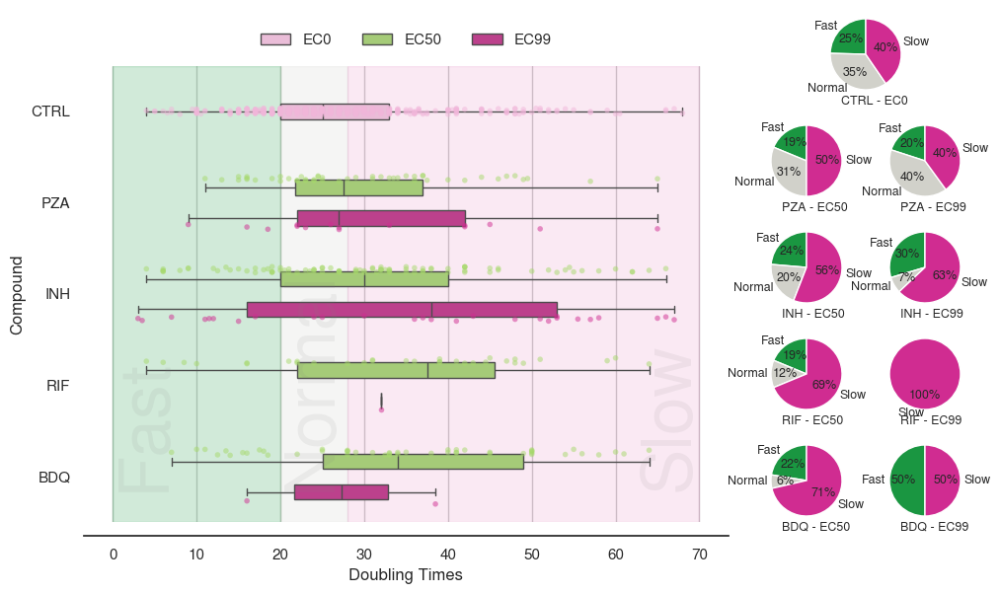

In [154]:
import matplotlib.gridspec as gridspec

# Step 1: Bin the Doubling Times into categories
bins = [0, 20, 28, float('inf')]  # Define the bins: <20, 20-28, >28
labels = ['Fast', 'Normal', 'Slow']  # Labels for each bin
subset_df['Growth Category'] = pd.cut(subset_df['Doubling Times'], bins=bins, labels=labels, right=False)

# Step 2: Initialize the figure with GridSpec to accommodate pie charts
fig = plt.figure(figsize=(10, 6))  # Adjusted size for the main plot and pie charts
gs = gridspec.GridSpec(1, 2, width_ratios=[3, 1])  # Grid with main plot and pie chart section

# Main Plot (left side)
ax = plt.subplot(gs[0])

# Define hue_order for consistency
hue_order = ['EC50', 'EC0', 'EC99']

# Step 3: Create the boxplot and stripplot
sns.boxplot(
    data=subset_df, x="Doubling Times", y="Compound", hue="Concentration", 
    whis=[0, 100], width=.5, palette=[expanded_piyg[1], expanded_piyg[4], expanded_piyg[5]], hue_order=hue_order, ax=ax
)

sns.stripplot(
    data=subset_df, x="Doubling Times", y="Compound", hue="Concentration", size=4, 
    palette=[expanded_piyg[1], expanded_piyg[4], expanded_piyg[5]], hue_order=hue_order, dodge=True, alpha=0.5, ax=ax
)

# Step 4: Add shaded regions for each category
ax.axvspan(0, 20, color=expanded_piyg[0], alpha=0.2, label='Fast (<20h)')
ax.axvspan(20, 28, color=expanded_piyg[3], alpha=0.2, label='Normal (20-28h)')
ax.axvspan(28, 70, color=expanded_piyg[-1], alpha=0.1, label='Slow (>28h)')

# Remove extra legend
handles, labels = ax.get_legend_handles_labels()

# Swap the first and second elements in the handles and labels
handles = [handles[1], handles[0], handles[2]]
labels = [labels[1], labels[0], labels[2]]

# Add the legend directly above the box plot
ax.legend(handles, labels, loc='upper center', bbox_to_anchor=(0.5, 1.1), ncol=3, frameon=False)


# Step 5: Pie Charts (right side)
compound_order = subset_df['Compound'].unique()
concentration_order = ['EC50', 'EC0', 'EC99']
growth_labels = ['Fast', 'Normal', 'Slow']  # Growth category labels
colors = [expanded_piyg[0], expanded_piyg[3], expanded_piyg[-1]]  # Colors for Fast, Normal, Slow growth

# Get total counts for each compound, concentration, and growth category
grouped_counts = subset_df.groupby(['Compound', 'Concentration', 'Growth Category']).size()

pi_x_start_pos = 0.75  # Starting x-position for pie charts
pi_y_start_pos = 0.85   # Starting y-position for pie charts

# Iterate over each compound and concentration combination
for i, compound in enumerate(compound_order):
    for j, concentration in enumerate(concentration_order):
        # Get the counts for Fast, Normal, and Slow growth for this compound and concentration
        fast_count = grouped_counts.get((compound, concentration, 'Fast'), 0)
        normal_count = grouped_counts.get((compound, concentration, 'Normal'), 0)
        slow_count = grouped_counts.get((compound, concentration, 'Slow'), 0)

        # Only plot the pie chart if there are data points for the compound-concentration combination
        if fast_count + normal_count + slow_count > 0:
            counts = [fast_count, normal_count, slow_count]
            
            # Filter out zero counts and corresponding labels and colors
            filtered_counts = [count for count in counts if count > 0]
            filtered_labels = [growth_labels[idx] for idx, count in enumerate(counts) if count > 0]
            filtered_colors = [colors[idx] for idx, count in enumerate(counts) if count > 0]
            
            # Adjust x-position for side-by-side pie charts
            if concentration == 'EC0':
                    x_pos = pi_x_start_pos  + 0.06
            elif concentration == 'EC50':
                x_pos = pi_x_start_pos
            elif concentration == 'EC99':
                x_pos = pi_x_start_pos + 0.12  # Offset EC99 to the right of EC50
            
            # Create pie chart on the right side of the corresponding compound
            ax_pie = fig.add_axes([x_pos, pi_y_start_pos - (i * 0.18), 0.15, 0.15], aspect=1)  # Position for each pie chart
            ax_pie.pie(filtered_counts, colors=filtered_colors, labels=filtered_labels, autopct='%1.0f%%', startangle=90, textprops={'fontsize': 9})
            
            # Add a label below each pie chart for the compound and concentration
            ax_label = fig.add_axes([x_pos, pi_y_start_pos - 0.02 - (i * 0.18), 0.1, 0.03])  # Smaller box for the label
            ax_label.text(0.5, 0.5, f'{compound} - {concentration}', horizontalalignment='left', verticalalignment='center', fontsize=9)
            ax_label.set_axis_off()  # Hide axis for the label


# Step 6: Add vertical text labels within each category region
ax.text(0, 4, 'Fast', fontsize=50, color='gray', alpha=0.1, ha='left', va='baseline', rotation=90)
ax.text(20, 4, 'Normal', fontsize=50, color='gray', alpha=0.1, ha='left', va='baseline', rotation=90)
ax.text(70.5, 4, 'Slow', fontsize=50, color='gray', alpha=0.1, ha='right', va='baseline', rotation=90)

# Final tweaks for grid and appearance
ax.xaxis.grid(True)
sns.despine(offset=10, left=True)

# Show the plot
plt.tight_layout()
plt.show()


/tmp/ipykernel_3699928/1635081682.py:44: UserWarning: Setting the 'color' property will override the edgecolor or facecolor properties.
  ec0_patch = mpatches.Patch(color=boxplot_palette[1], label='EC0', edgecolor='none')
/tmp/ipykernel_3699928/1635081682.py:45: UserWarning: Setting the 'color' property will override the edgecolor or facecolor properties.
  ec50_patch = mpatches.Patch(color=boxplot_palette[0], label='EC50', edgecolor='none')
/tmp/ipykernel_3699928/1635081682.py:46: UserWarning: Setting the 'color' property will override the edgecolor or facecolor properties.
  ec99_patch = mpatches.Patch(color=boxplot_palette[2], label='EC99', edgecolor='none')
/tmp/ipykernel_3699928/1635081682.py:130: UserWarning: This figure includes Axes that are not compatible with tight_layout, so results might be incorrect.
  plt.tight_layout()


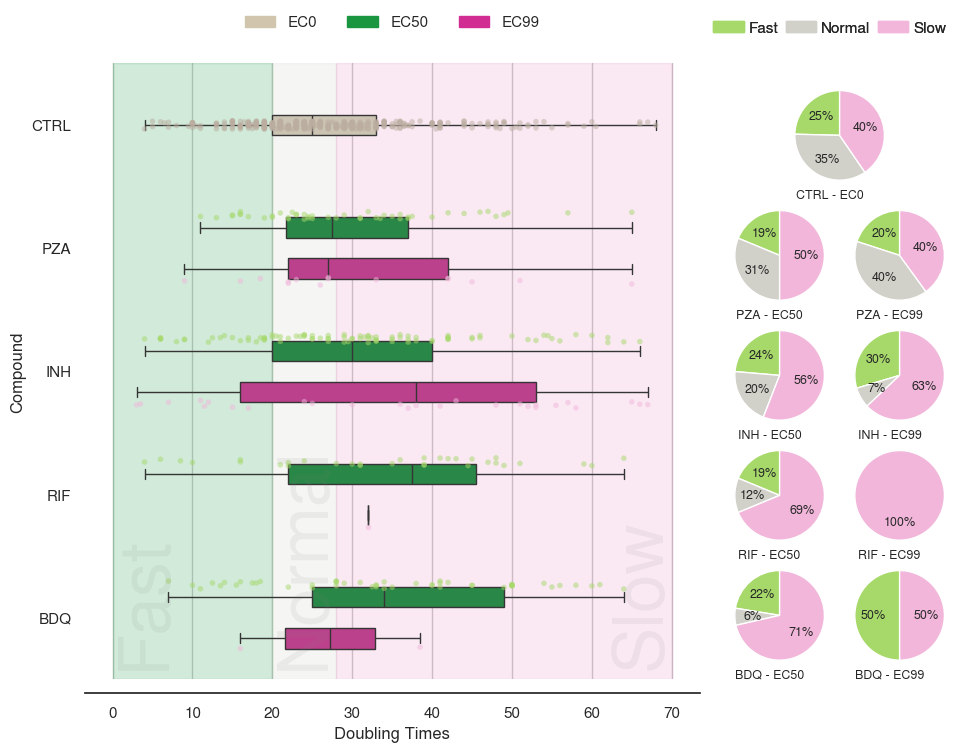

In [208]:
import matplotlib.gridspec as gridspec

# Step 1: Bin the Doubling Times into categories
bins = [0, 20, 28, float('inf')]  # Define the bins: <20, 20-28, >28
labels = ['Fast', 'Normal', 'Slow']  # Labels for each bin
subset_df['Growth Category'] = pd.cut(subset_df['Doubling Times'], bins=bins, labels=labels, right=False)

# Step 2: Initialize the figure with GridSpec to accommodate pie charts
fig = plt.figure(figsize=(10, 8))  # Adjusted size for the main plot and pie charts
gs = gridspec.GridSpec(1, 2, width_ratios=[5, 1], wspace=0.1)  # Grid with main plot and pie chart section

# Main Plot (left side)
ax = plt.subplot(gs[0])

# Define hue_order for consistency
hue_order = ['EC50', 'EC0', 'EC99']

boxplot_palette = ['#1A9641', '#D1C6AD', '#D02C91']
# Step 3: Create the boxplot and stripplot
sns.boxplot(
    data=subset_df, x="Doubling Times", y="Compound", hue="Concentration", 
    whis=[0, 100], width=.5, palette=boxplot_palette,
    hue_order=hue_order, ax=ax
)
stripplot_palette = [expanded_piyg[1], '#bbada0', expanded_piyg[-2]]
sns.stripplot(
    data=subset_df, x="Doubling Times", y="Compound", hue="Concentration", size=4, 
    palette=stripplot_palette, hue_order=hue_order, dodge=True, alpha=0.5, ax=ax
)

# Step 4: Add shaded regions for each category
ax.axvspan(0, 20, color=expanded_piyg[0], alpha=0.2, label='Fast (<20h)')
ax.axvspan(20, 28, color=expanded_piyg[3], alpha=0.2, label='Normal (20-28h)')
ax.axvspan(28, 70, color=expanded_piyg[-1], alpha=0.1, label='Slow (>28h)')

# Remove extra legend
handles, labels = ax.get_legend_handles_labels()

# Swap the first and second elements in the handles and labels
handles = [handles[1], handles[0], handles[2]]
labels = [labels[1], labels[0], labels[2]]

# Create custom legend patches without borders for the boxplot
ec0_patch = mpatches.Patch(color=boxplot_palette[1], label='EC0', edgecolor='none')
ec50_patch = mpatches.Patch(color=boxplot_palette[0], label='EC50', edgecolor='none')
ec99_patch = mpatches.Patch(color=boxplot_palette[2], label='EC99', edgecolor='none')

# Add the custom legend directly above the box plot
ax.legend(handles=[ec0_patch, ec50_patch, ec99_patch], loc='upper center', bbox_to_anchor=(0.5, 1.1), ncol=3, frameon=False)

# Pie chart legend (same as before)
fig.legend(
    handles=legend_colors, 
    loc='upper center', 
    bbox_to_anchor=(0.87, 0.95), 
    ncol=3, 
    frameon=False,  # No boxes around the legend
    handletextpad=0.3, 
    columnspacing=0.5, 
    labelspacing=0.2
)
# Step 5: Pie Charts (right side)
compound_order = subset_df['Compound'].unique()
concentration_order = ['EC50', 'EC0', 'EC99']
growth_labels = ['Fast', 'Normal', 'Slow']  # Growth category labels
colors = [expanded_piyg[1], expanded_piyg[3], expanded_piyg[-2]]  # Colors for Fast, Normal, Slow growth

# Get total counts for each compound, concentration, and growth category
grouped_counts = subset_df.groupby(['Compound', 'Concentration', 'Growth Category']).size()

pi_x_start_pos = 0.75  # Starting x-position for pie charts
pi_y_start_pos = 0.72 # Starting y-position for pie charts

# Iterate over each compound and concentration combination
for i, compound in enumerate(compound_order):
    for j, concentration in enumerate(concentration_order):
        # Get the counts for Fast, Normal, and Slow growth for this compound and concentration
        fast_count = grouped_counts.get((compound, concentration, 'Fast'), 0)
        normal_count = grouped_counts.get((compound, concentration, 'Normal'), 0)
        slow_count = grouped_counts.get((compound, concentration, 'Slow'), 0)

        # Only plot the pie chart if there are data points for the compound-concentration combination
        if fast_count + normal_count + slow_count > 0:
            counts = [fast_count, normal_count, slow_count]
            
            # Filter out zero counts and corresponding labels and colors
            filtered_counts = [count for count in counts if count > 0]
            filtered_colors = [colors[idx] for idx, count in enumerate(counts) if count > 0]
            
            # Adjust x-position for side-by-side pie charts
            if concentration == 'EC0':
                x_pos = pi_x_start_pos + 0.06
            elif concentration == 'EC50':
                x_pos = pi_x_start_pos
            elif concentration == 'EC99':
                x_pos = pi_x_start_pos + 0.12  # Offset EC99 to the right of EC50
            
            # Create pie chart on the right side of the corresponding compound
            ax_pie = fig.add_axes([x_pos, pi_y_start_pos - (i * 0.15), 0.14, 0.14], aspect=1)  # Position for each pie chart
            ax_pie.pie(filtered_counts, colors=filtered_colors, labels=None, autopct='%1.0f%%', startangle=90, textprops={'fontsize': 9})
            
            # Add a label below each pie chart for the compound and concentration
            ax_label = fig.add_axes([x_pos, pi_y_start_pos - 0.02 - (i * 0.15), 0.12, 0.03])  # Smaller box for the label
            ax_label.text(0.5, 0.5, f'{compound} - {concentration}', horizontalalignment='center', verticalalignment='center', fontsize=9)
            ax_label.set_axis_off()  # Hide axis for the label

# Step 6: Add the key above the pie charts
legend_labels = ['Fast', 'Normal', 'Slow']
legend_colors = [mpatches.Patch(color=colors[i], label=legend_labels[i]) for i in range(len(legend_labels))]
fig.legend(
    handles=legend_colors, 
    loc='upper center', 
    bbox_to_anchor=(0.87, 0.95), 
    ncol=3, 
    frameon=False, 
    handletextpad=0.3,  # Adjust spacing between the handle and the label
    columnspacing=0.5,  # Adjust spacing between the columns
    labelspacing=0.2    # Adjust spacing between the labels vertically (if multiline)
)
# Step 6: Add vertical text labels within each category region
ax.text(0, 4.3, 'Fast', fontsize=50, color='gray', alpha=0.1, ha='left', va='baseline', rotation=90)
ax.text(20, 4.3, 'Normal', fontsize=50, color='gray', alpha=0.1, ha='left', va='baseline', rotation=90)
ax.text(70.5, 4.3, 'Slow', fontsize=50, color='gray', alpha=0.1, ha='right', va='baseline', rotation=90)

# Final tweaks for grid and appearance
ax.xaxis.grid(True)
sns.despine(offset=10, left=True)

# Show the plot
plt.tight_layout()
plt.show()


In [137]:
filtered_colors

['#a6d96a', '#f1b6da']

N=142


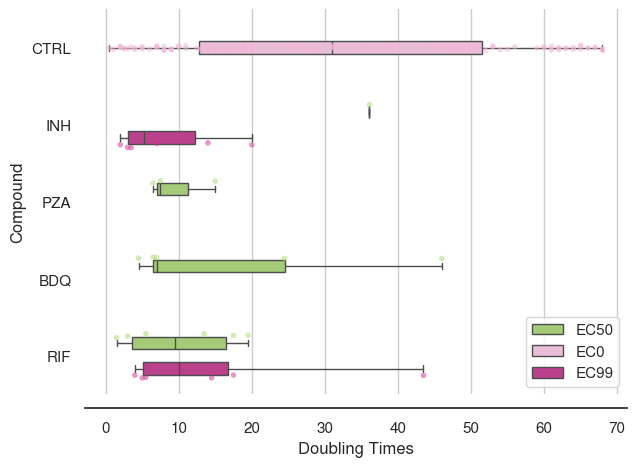

In [310]:
# Prepare the subset DataFrame as before
subset_df = df[(df['r2'] >= 0.8) 
             & (df['Edge Status'] == False) 
             & (df['Strain'] == 'RD1') 
             # & (df['Compound'] == 'CTRL')
             & (df['mtb_origin'].isna()) # are we really doing this right now? or after figure 3? 
               ].drop_duplicates(subset=['ID'])
# Exclude CTRL rows without EC50 or EC99 values from causing alignment issues
# subset_df = subset_df[(subset_df['Compound'] != 'CTRL') | (subset_df['Concentration'] == 'EC0')]
subset_df = subset_df.explode('Doubling Times')
subset_df['Doubling Times'] = pd.to_numeric(subset_df['Doubling Times'], errors='coerce')
subset_df = subset_df[subset_df['Doubling Times'].notna()]
subset_df = subset_df[subset_df['Doubling Times'] > 0]
print(f'N={len(subset_df)}')

# Initialize the figure
f, ax = plt.subplots(figsize=(7, 5))

# Define hue_order for consistency
hue_order = ['EC50', 'EC0', 'EC99']

# Create the boxplot
sns.boxplot(
    data=subset_df, x="Doubling Times", y="Compound", hue="Concentration", 
    whis=[0, 100], width=.5, palette=[expanded_piyg[1], expanded_piyg[4], expanded_piyg[5]], hue_order=hue_order
)

# Add the stripplot
sns.stripplot(
    data=subset_df, x="Doubling Times", y="Compound", hue="Concentration", size=4, 
    palette=[expanded_piyg[1], expanded_piyg[4], expanded_piyg[5]], hue_order=hue_order, dodge=True, alpha=0.5
)

# Remove the double legend
handles, labels = ax.get_legend_handles_labels()
ax.legend(handles[0:3], labels[0:3])

# Tweak visual presentation
ax.xaxis.grid(True)
sns.despine(offset=10, left=True)

# Show the plot
plt.show()


# Which of these doubling times are from uptake? 

### temp configuring new colormap

In [222]:
importlib.reload(colours)

<module 'macrohet.colours' from '/home/dayn/analysis/macrohet/macrohet/colours.py'>

In [226]:
vaporwave = colours.vaporwave

In [227]:
# Define color mapping for compounds using vaporwave palette
compound_color_map = {
    'PZA': {'EC50': vaporwave[1], 'EC99': vaporwave[0]},  # Light for EC50, Dark for EC99
    'RIF': {'EC50': vaporwave[3], 'EC99': vaporwave[2]},  # Light for EC50, Dark for EC99
    'INH': {'EC50': vaporwave[5], 'EC99': vaporwave[4]},  # Light for EC50, Dark for EC99
    'CTRL': {'wt': vaporwave[6], 'rd1': vaporwave[7]}     # Darker for wt, Lighter for rd1
}


In [224]:
# Prepare the subset DataFrame as before
subset_df = df[(df['r2'] >= 0.8) 
             & (df['Edge Status'] == False) 
             & (df['Strain'] != 'UNI') 
             # & (df['Compound'] == 'CTRL')
             & (df['mtb_origin'].isna()) # are we really doing this right now? or after figure 3? 
               ].drop_duplicates(subset=['ID'])
subset_df = subset_df.explode('Doubling Times')
subset_df['Doubling Times'] = pd.to_numeric(subset_df['Doubling Times'], errors='coerce')
subset_df = subset_df[subset_df['Doubling Times'].notna()]
subset_df = subset_df[subset_df['Doubling Times'] > 0]
print(f'N={len(subset_df)}')

N=735


/tmp/ipykernel_3699928/538223554.py:35: UserWarning: 
The palette list has fewer values (1) than needed (2) and will cycle, which may produce an uninterpretable plot.
  sns.boxplot(
/tmp/ipykernel_3699928/538223554.py:35: UserWarning: 
The palette list has fewer values (1) than needed (2) and will cycle, which may produce an uninterpretable plot.
  sns.boxplot(
/tmp/ipykernel_3699928/538223554.py:35: UserWarning: 
The palette list has fewer values (1) than needed (2) and will cycle, which may produce an uninterpretable plot.
  sns.boxplot(
/tmp/ipykernel_3699928/538223554.py:35: UserWarning: 
The palette list has fewer values (1) than needed (2) and will cycle, which may produce an uninterpretable plot.
  sns.boxplot(
/tmp/ipykernel_3699928/538223554.py:35: UserWarning: 
The palette list has fewer values (1) than needed (2) and will cycle, which may produce an uninterpretable plot.
  sns.boxplot(


KeyError: 'BDQ'

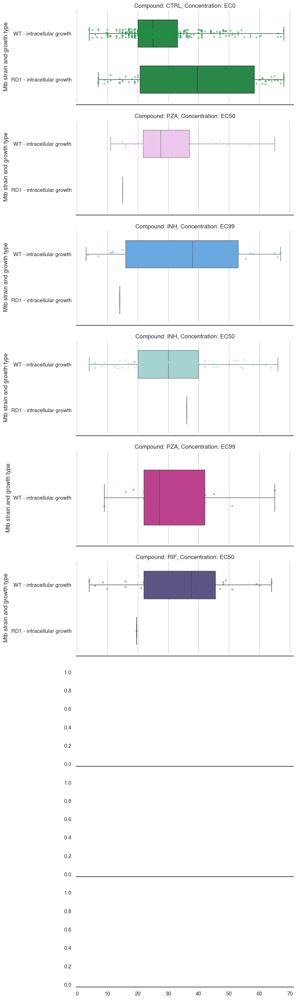

In [228]:
import matplotlib.pyplot as plt
import seaborn as sns

# Assuming you already have `subset_df` with relevant columns

# Create a new column that combines 'Strain' and whether 'mtb_origin' is missing
subset_df['Strain_origin'] = subset_df.apply(
    lambda row: f"{row['Strain']} - {'intracellular growth' if pd.isna(row['mtb_origin']) else 'extracellular origin'}", axis=1)

# Get unique combinations of compounds and concentrations
unique_combinations = subset_df[['Compound', 'Concentration']].drop_duplicates()

# Initialize figure size (adjust depending on number of subplots)
n_rows = len(unique_combinations)
fig, axes = plt.subplots(n_rows, 1, figsize=(8, 4 * n_rows), sharex=True)

# If there's only one combination, turn the single axis into a list for consistent iteration
if n_rows == 1:
    axes = [axes]

# Loop through each unique combination of compound and concentration
for i, (compound, concentration) in enumerate(unique_combinations.values):
    ax = axes[i]

    # Filter data for the current compound and concentration
    subset = subset_df[(subset_df['Compound'] == compound) & (subset_df['Concentration'] == concentration)]
    
    # Determine the color for the boxplot based on compound and concentration
    if compound != 'CTRL':
        color = compound_color_map[compound]['EC50'] if concentration == 'EC50' else compound_color_map[compound]['EC99']
    else:
        color = compound_color_map[compound]['wt'] if subset['Strain'].iloc[0] == 'wt' else compound_color_map[compound]['rd1']

    # Create the boxplot for the doubling times by 'Strain_origin'
    sns.boxplot(
        data=subset, x="Doubling Times", y="Strain_origin", 
        whis=[0, 100], width=.6, palette=[color], ax=ax
    )

    # Add a stripplot to show each observation
    sns.stripplot(
        data=subset, x="Doubling Times", y="Strain_origin", 
        size=4, color=color, alpha=0.5, ax=ax
    )

    # Set the title for each subplot based on compound and concentration
    ax.set_title(f"Compound: {compound}, Concentration: {concentration}")
    ax.xaxis.grid(True)
    sns.despine(offset=5, left=True)
    ax.set_ylabel('Mtb strain and growth type')

# Set a common xlabel for the entire figure
plt.xlabel("Doubling Times")
plt.tight_layout()

# Save the figure
# plt.savefig(os.path.join(output_dir, 'compound_concentration_doubling_times_split_origin_vaporwave.pdf'), bbox_inches='tight', dpi=314)

plt.show()


# Pie charts

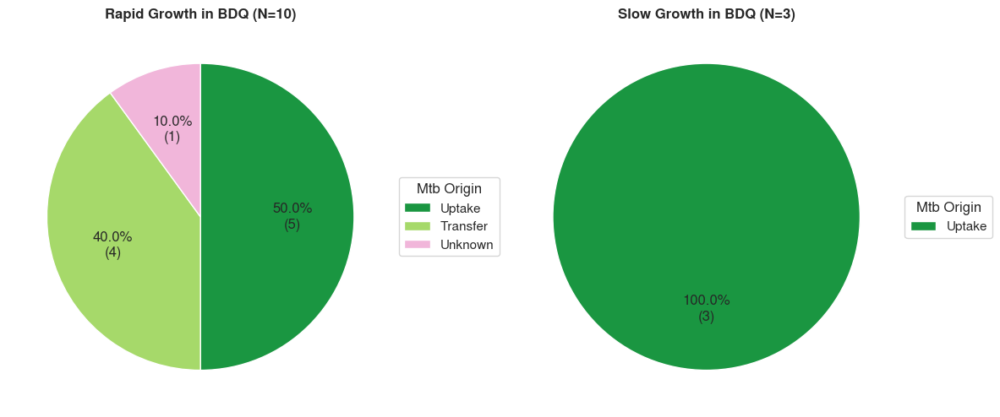

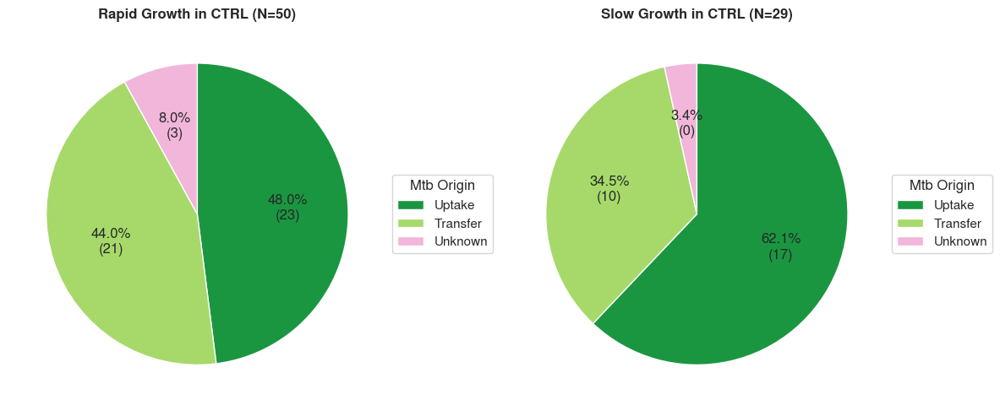

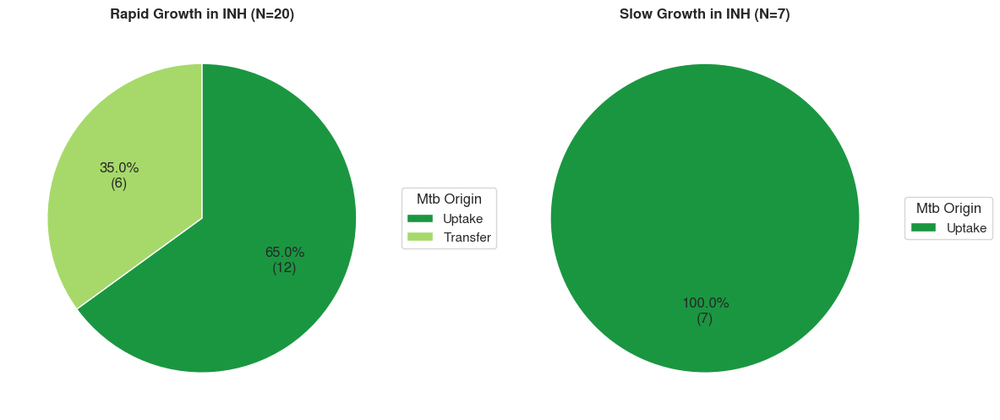

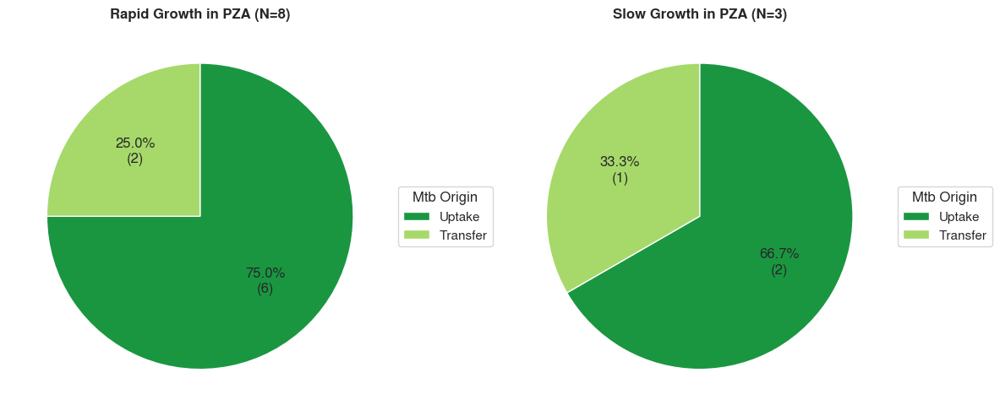

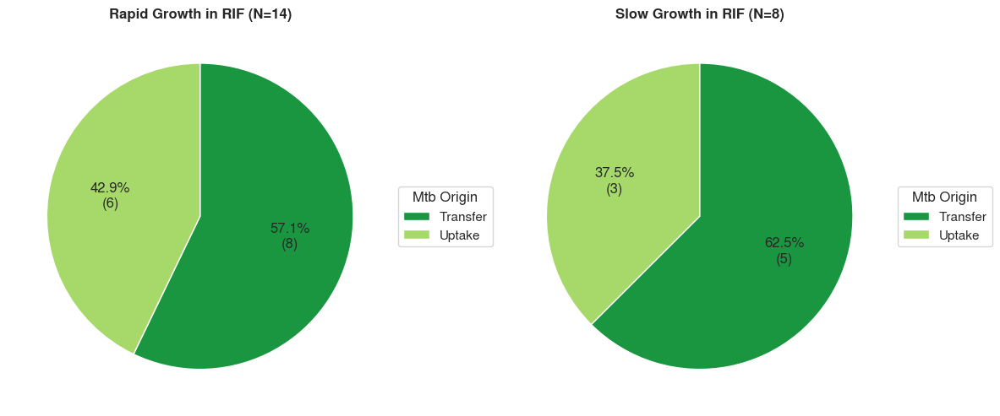

In [177]:
# Function to add counts to pie chart
def func(pct, allvalues):
    absolute = int(pct / 100. * np.sum(allvalues))
    return f"{pct:.1f}%\n({absolute:d})"

# Colors from expanded_piyg
colors = ['#1a9641', '#a6d96a', '#f1b6da', '#d02c91']

# Group by 'Compound' and 'Concentration'
grouped = df.drop_duplicates('ID').groupby(['Compound'])

# Iterate over each group
for compound, group in grouped:
    # Filter out 'Junk'
    filtered_group = group[(group['mtb_origin'] != 'Junk') & ~(group['mtb_origin'].isna()) & (group['Strain'] == 'RD1')]
    filtered_group = filtered_group.explode('Doubling Times')
    # if compound == 'CTRL':
    #     break
    # Separate into rapid growth and other growth
    rapid_growth = filtered_group[filtered_group['Doubling Times'] <= 18].drop_duplicates('ID')
    other_growth = filtered_group[filtered_group['Doubling Times'] > 18].drop_duplicates('ID')

    # Count the occurrences of each unique value in the 'mtb_origin' column for both groups
    rapid_growth_counts = rapid_growth['mtb_origin'].value_counts()
    other_growth_counts = other_growth['mtb_origin'].value_counts()


    # Create a figure with two subplots
    fig, axes = plt.subplots(1, 2, figsize=(12, 6))

    # Plot the rapid growth pie chart
    wedges_rapid, texts_rapid, autotexts_rapid = axes[0].pie(
        rapid_growth_counts,
        autopct=lambda pct: func(pct, rapid_growth_counts),
        startangle=90,
        counterclock=False,
        colors=colors
    )
    axes[0].set_title(f'Rapid Growth in {compound} (N={rapid_growth_counts.sum()})', fontweight='bold')
    axes[0].set_ylabel('')  # Hide the y-label

    # Plot the other growth pie chart
    wedges_other, texts_other, autotexts_other = axes[1].pie(
        other_growth_counts,
        autopct=lambda pct: func(pct, other_growth_counts),
        startangle=90,
        counterclock=False,
        colors=colors
    )
    axes[1].set_title(f'Slow Growth in {compound} (N={other_growth_counts.sum()})', fontweight='bold')
    axes[1].set_ylabel('')  # Hide the y-label

    # Add legends for both subplots
    labels = rapid_growth_counts.index.tolist()
    axes[0].legend(wedges_rapid, labels, title="Mtb Origin", loc="center left", bbox_to_anchor=(1, 0, 0.5, 1))
    axes[1].legend(wedges_other, labels, title="Mtb Origin", loc="center left", bbox_to_anchor=(1, 0, 0.5, 1))

    # Adjust layout
    plt.tight_layout()

    # Display the pie charts
    plt.show()

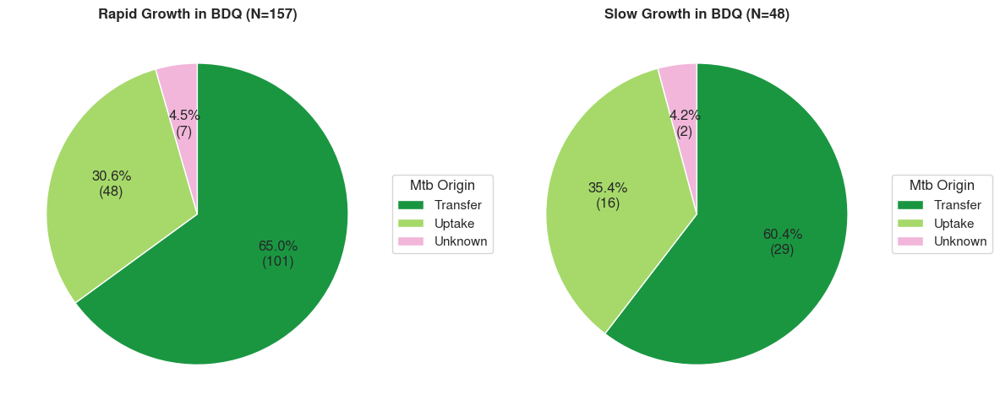

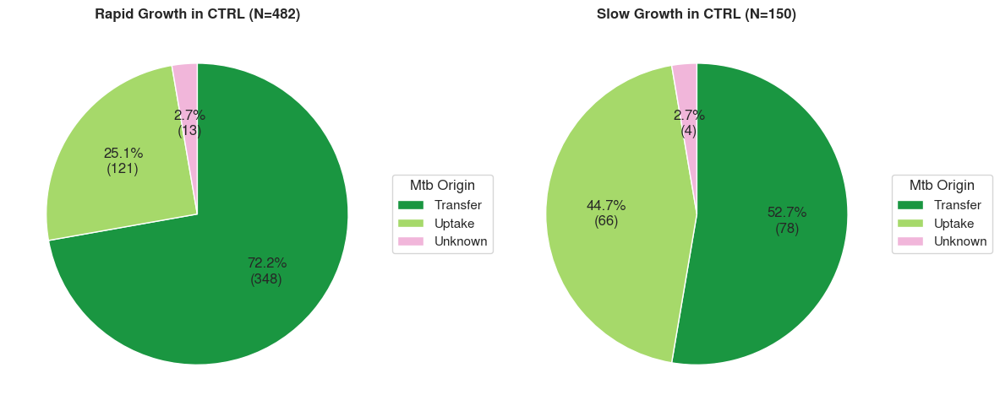

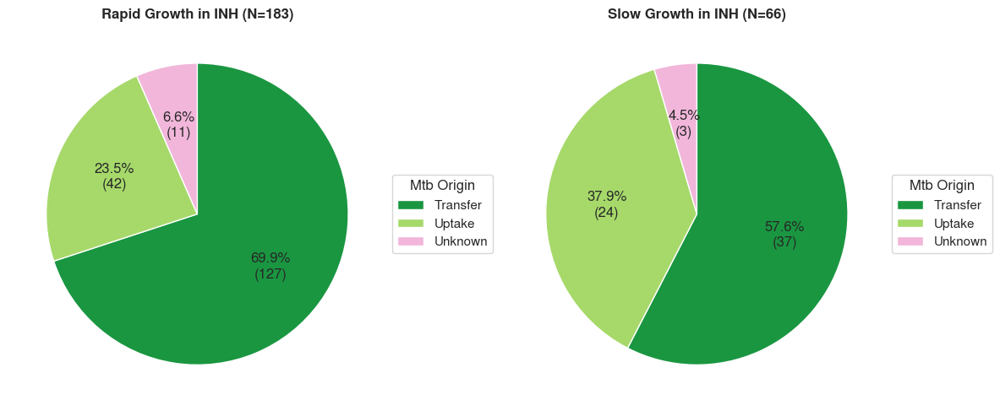

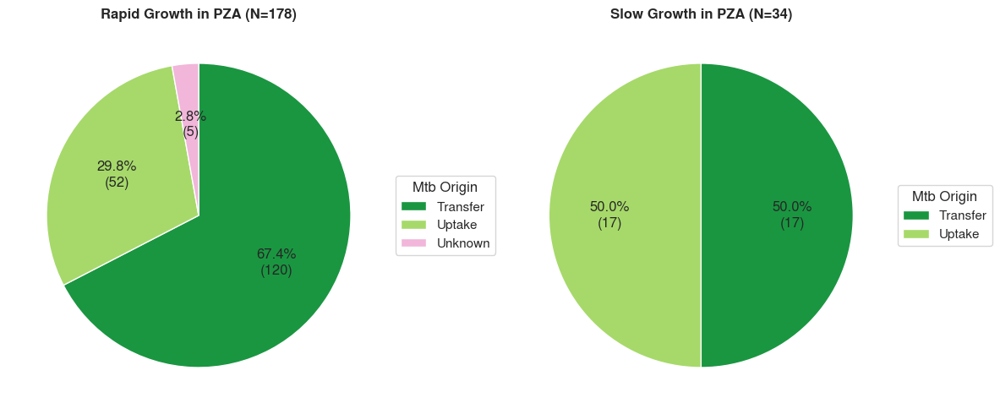

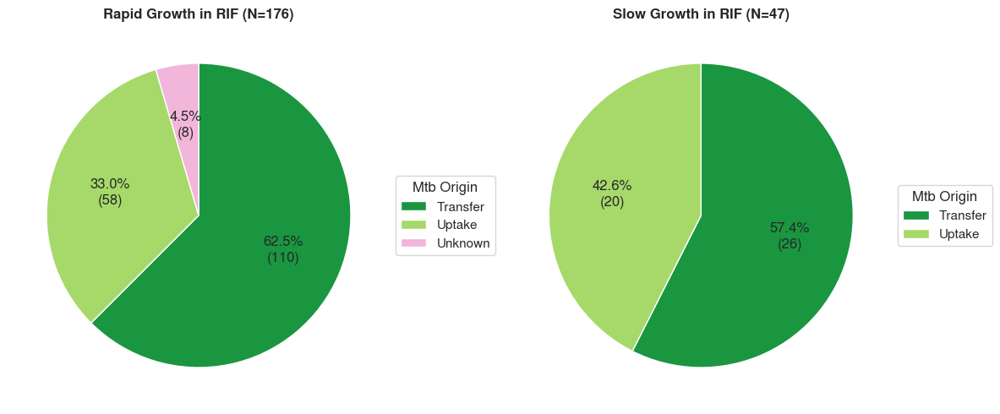

In [178]:
# Function to add counts to pie chart
def func(pct, allvalues):
    absolute = int(pct / 100. * np.sum(allvalues))
    return f"{pct:.1f}%\n({absolute:d})"

threshold_hr = 15

# Colors from expanded_piyg
colors = ['#1a9641', '#a6d96a', '#f1b6da', '#d02c91']

# Group by 'Compound' and 'Concentration'
grouped = df.drop_duplicates('ID').groupby(['Compound'])

# Iterate over each group
for compound, group in grouped:
    # Filter out 'Junk'
    filtered_group = group[(group['mtb_origin'] != 'Junk') & ~(group['mtb_origin'].isna()) & (group['Strain'] != 'RD1')]
    filtered_group = filtered_group.explode('Doubling Times')

    # Separate into rapid growth and other growth
    rapid_growth = filtered_group[filtered_group['Doubling Times'] <= threshold_hr]
    other_growth = filtered_group[filtered_group['Doubling Times'] > threshold_hr]

    # Count the occurrences of each unique value in the 'mtb_origin' column for both groups
    rapid_growth_counts = rapid_growth['mtb_origin'].value_counts()
    other_growth_counts = other_growth['mtb_origin'].value_counts()


    # Create a figure with two subplots
    fig, axes = plt.subplots(1, 2, figsize=(12, 6))

    # Plot the rapid growth pie chart
    wedges_rapid, texts_rapid, autotexts_rapid = axes[0].pie(
        rapid_growth_counts,
        autopct=lambda pct: func(pct, rapid_growth_counts),
        startangle=90,
        counterclock=False,
        colors=colors
    )
    axes[0].set_title(f'Rapid Growth in {compound} (N={rapid_growth_counts.sum()})', fontweight='bold')
    axes[0].set_ylabel('')  # Hide the y-label

    # Plot the other growth pie chart
    wedges_other, texts_other, autotexts_other = axes[1].pie(
        other_growth_counts,
        autopct=lambda pct: func(pct, other_growth_counts),
        startangle=90,
        counterclock=False,
        colors=colors
    )
    axes[1].set_title(f'Slow Growth in {compound} (N={other_growth_counts.sum()})', fontweight='bold')
    axes[1].set_ylabel('')  # Hide the y-label

    # Add legends for both subplots
    labels = rapid_growth_counts.index.tolist()
    axes[0].legend(wedges_rapid, labels, title="Mtb Origin", loc="center left", bbox_to_anchor=(1, 0, 0.5, 1))
    axes[1].legend(wedges_other, labels, title="Mtb Origin", loc="center left", bbox_to_anchor=(1, 0, 0.5, 1))

    # Adjust layout
    plt.tight_layout()

    # Display the pie charts
    plt.show()

# Checking lowest doubling times

N=1028


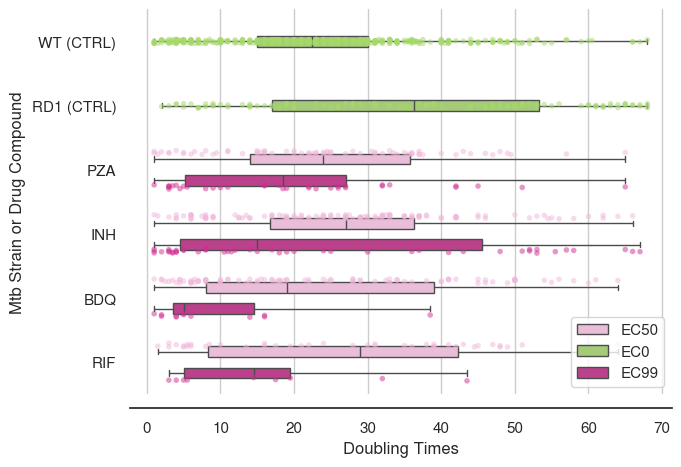

In [5]:
# Prepare the subset DataFrame as before
subset_df = df[(df['r2'] >= 0.8) 
             & (df['Edge Status'] == False) 
             & (df['Strain'] != 'UNI') 
             # & (df['Compound'] == 'CTRL')
             & (df['mtb_origin'].isna()) # are we really doing this right now? or after figure 3? 
               ].drop_duplicates(subset=['ID'])
subset_df = subset_df.explode('Doubling Times')
subset_df['Doubling Times'] = pd.to_numeric(subset_df['Doubling Times'], errors='coerce')
subset_df = subset_df[subset_df['Doubling Times'].notna()]
subset_df = subset_df[subset_df['Doubling Times'] > 0]
print(f'N={len(subset_df)}')

# Modify the DataFrame to place both WT and RD1 under the CTRL compound row
subset_df['Mtb Strain or Drug Compound'] = subset_df.apply(
    lambda row: f"{row['Strain']} (CTRL)" if row['Compound'] == 'CTRL' else row['Compound'], axis=1
)

# Define the desired order with WT and RD1 at the top
strain_order = ['WT (CTRL)', 'RD1 (CTRL)', 'PZA', 'INH', 'BDQ', 'RIF']

# Initialize the figure
f, ax = plt.subplots(figsize=(7, 5))

# Define hue_order for consistency
hue_order = ['EC50', 'EC0', 'EC99']

# Create the boxplot with specified y-axis order
sns.boxplot(
    data=subset_df, x="Doubling Times", y="Mtb Strain or Drug Compound", hue="Concentration", 
    whis=[0, 100], width=.5, palette= [expanded_piyg[4],expanded_piyg[1], expanded_piyg[5]], 
    hue_order=hue_order, order=strain_order
)

# Add the stripplot with the same y-axis order
sns.stripplot(
    data=subset_df, x="Doubling Times", y="Mtb Strain or Drug Compound", hue="Concentration", size=4, 
    palette=[expanded_piyg[4],expanded_piyg[1], expanded_piyg[5]], 
    hue_order=hue_order, dodge=True, alpha=0.5, order=strain_order
)

# Remove the double legend
handles, labels = ax.get_legend_handles_labels()
ax.legend(handles[0:3], labels[0:3])

# Tweak visual presentation
ax.xaxis.grid(True)
sns.despine(offset=10, left=True)

# Show the plot
plt.show()

In [ ]:
print()

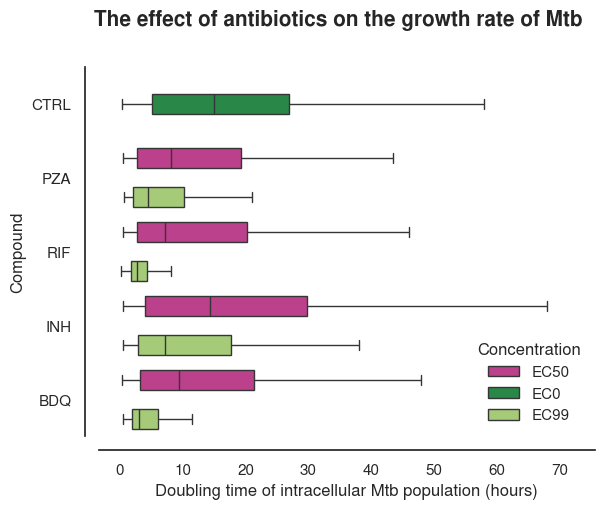

In [13]:
subset_df = df[(df['r2']>0.7) & 
               (df['r2']<1) & 
               (df['dt']>0) & 
               (df['Edge Status']==False) &
                (df['mtb_origin']>0) & 
               (df['Strain/Compound'] != 'RD1')].drop_duplicates(subset=['ID'])

g = sns.boxplot(x="dt", y="Compound",
            hue="Concentration", 
            palette=[expanded_piyg[-1], expanded_piyg[0], expanded_piyg[1]],
            data=subset_df, 
            hue_order=hue_order, fliersize = 0
            # scale = 'linear'
              )  
sns.despine(offset = 10)
plt.xlabel("Doubling time of intracellular Mtb population (hours)")
plt.gcf().suptitle('The effect of antibiotics on the growth rate of Mtb', 
                   fontsize=15, fontweight='bold', 
                  y = 1.0)
sns.despine(offset=10)
plt.legend(loc = 'lower right', frameon = False, title = 'Concentration')
# plt.xlim(0, 40)
# plt.savefig(os.path.join(output_dir, 'ATB_effect_dt_gt0_violin.png'), bbox_inches='tight', dpi=314)


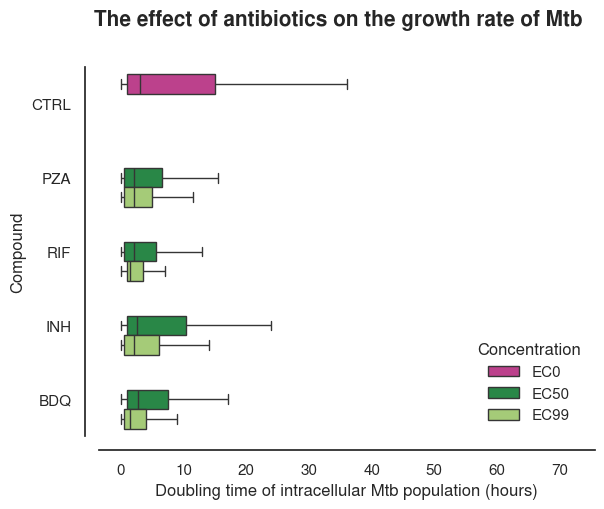

In [37]:

# Filter the DataFrame
subset_df = df[(df['r2'] > 0.7) & 
               (df['r2'] < 1) & 
               (df['dt'] > 0) & 
               (df['Strain/Compound'] != 'RD1')].drop_duplicates(subset=['ID'])

# Ensure 'doubling_times' and 'Compound' columns do not contain lists
subset_df = subset_df.explode('doubling_times')
subset_df = subset_df.explode('Compound')

# Define the palette and hue order
palette = [expanded_piyg[-1], expanded_piyg[0], expanded_piyg[1]]
hue_order = sorted(subset_df['Concentration'].unique())

# Create the seaborn boxplot
g = sns.boxplot(x="doubling_times", y="Compound",
                hue="Concentration", 
                palette=palette,
                data=subset_df, 
                hue_order=hue_order, fliersize=0
               )

sns.despine(offset=10)
plt.xlabel("Doubling time of intracellular Mtb population (hours)")
plt.gcf().suptitle('The effect of antibiotics on the growth rate of Mtb', 
                   fontsize=15, fontweight='bold', 
                   y=1.0)
sns.despine(offset=10)
plt.legend(loc='lower right', frameon=False, title='Concentration')

# Optional: Save the plot
# plt.savefig(os.path.join(output_dir, 'ATB_effect_dt_gt0_violin.png'), bbox_inches='tight', dpi=314)

plt.show()

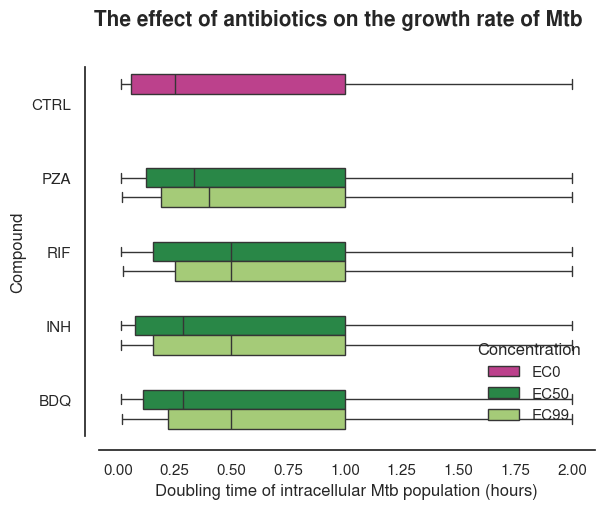

In [39]:

# Filter the DataFrame
subset_df = df[(df['r2'] > 0.7) & 
               (df['r2'] < 1) & 
               (df['dt'] > 0) & 
               (df['Strain/Compound'] != 'RD1')].drop_duplicates(subset=['ID'])

# Ensure 'doubling_times' and 'Compound' columns do not contain lists
subset_df = subset_df.explode('doubling_times')
subset_df = subset_df.explode('Compound')
# ensure that no zeros ar ein this doubling times
subset_df = subset_df[subset_df['doubling_times'] > 0]
# Define the palette and hue order
palette = [expanded_piyg[-1], expanded_piyg[0], expanded_piyg[1]]
hue_order = sorted(subset_df['Concentration'].unique())

subset_df['reciprocal_doubling_times'] = 1/subset_df['doubling_times']
# Create the seaborn boxplot
g = sns.boxplot(x="reciprocal_doubling_times", y="Compound",
                hue="Concentration", 
                palette=palette,
                data=subset_df, 
                hue_order=hue_order, fliersize=0
               )

sns.despine(offset=10)
plt.xlabel("Doubling time of intracellular Mtb population (hours)")
plt.gcf().suptitle('The effect of antibiotics on the growth rate of Mtb', 
                   fontsize=15, fontweight='bold', 
                   y=1.0)
sns.despine(offset=10)
plt.legend(loc='lower right', frameon=False, title='Concentration')

# Optional: Save the plot
# plt.savefig(os.path.join(output_dir, 'ATB_effect_dt_gt0_violin.png'), bbox_inches='tight', dpi=314)

plt.show()

Compound: PZA, Concentration: EC50, U-statistic: 719342, p-value: 5.390e-21
Compound: PZA, Concentration: EC99, U-statistic: 458878, p-value: 5.283e-37
Compound: RIF, Concentration: EC50, U-statistic: 763590, p-value: 1.378e-25
Compound: RIF, Concentration: EC99, U-statistic: 322892, p-value: 1.157e-41
Compound: INH, Concentration: EC50, U-statistic: 1112758, p-value: 2.017e-06
Compound: INH, Concentration: EC99, U-statistic: 757413, p-value: 6.963e-18
Compound: BDQ, Concentration: EC50, U-statistic: 940675, p-value: 3.453e-10
Compound: BDQ, Concentration: EC99, U-statistic: 270874, p-value: 1.406e-24


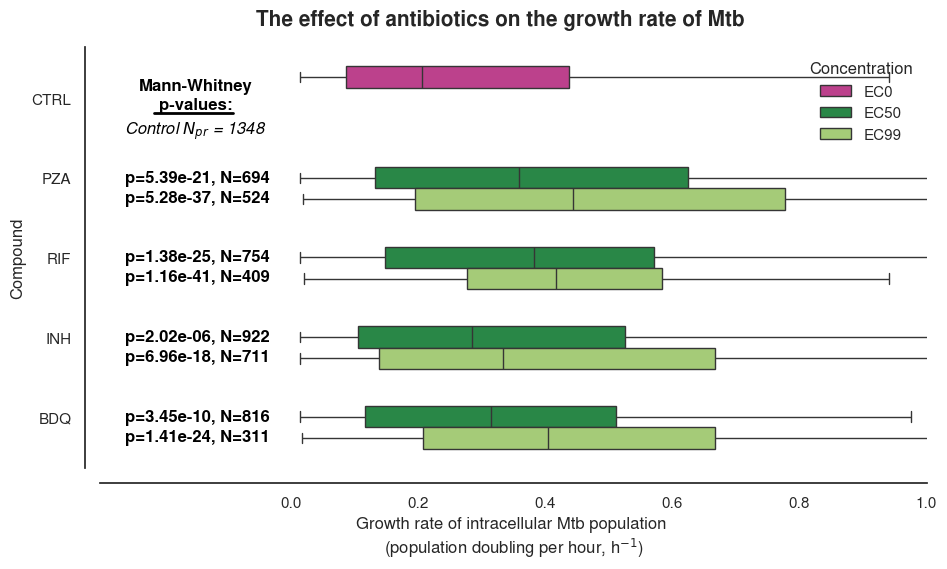

In [36]:
# Filter the DataFrame
subset_df = df[(df['r2'] > 0.7) & 
               (df['r2'] < 1) & 
               (df['dt'] > 0) & 
               (df['Strain/Compound'] != 'RD1')].drop_duplicates(subset=['ID'])

# Ensure 'doubling_times' and 'Compound' columns do not contain lists
subset_df = subset_df.explode('doubling_times')
subset_df = subset_df.explode('Compound')

# Ensure 'dt' is numeric and drop rows with NaNs in 'dt'
subset_df['doubling_times'] = pd.to_numeric(subset_df['dt'], errors='coerce')
subset_df = subset_df.dropna(subset=['doubling_times'])

# Create a new column for the reciprocal of dt
subset_df['reciprocal_doubling_times'] = 1 / subset_df['doubling_times']

# Perform the Mann-Whitney U test for each compound and concentration against the control
control_data = subset_df[subset_df['Compound'] == 'CTRL']['reciprocal_doubling_times']

# List to store p-values
p_values = []

for compound in subset_df['Compound'].unique():
    if compound != 'CTRL':
        for concentration in subset_df['Concentration'].unique():
            compound_data = subset_df[(subset_df['Compound'] == compound) & (subset_df['Concentration'] == concentration)]['reciprocal_doubling_times']
            if not compound_data.empty:
                stat, p_value = mannwhitneyu(control_data, compound_data)
                p_values.append((compound, concentration, stat, p_value))
                print(f"Compound: {compound}, Concentration: {concentration}, U-statistic: {int(stat)}, p-value: {p_value:.3e}")


# Calculate sample sizes
sample_sizes = subset_df.groupby(['Compound', 'Concentration']).size().reset_index(name='N')
plt.figure(figsize=(16/1.5, 8.18898/1.5))

# Plot the data using the reciprocal of dt
g = sns.boxplot(x="reciprocal_doubling_times", y="Compound",
                hue="Concentration", 
                palette=[expanded_piyg[-1], expanded_piyg[0], expanded_piyg[1]],
                data=subset_df, 
                hue_order=hue_order, fliersize=0)  

sns.despine(offset=10)
plt.xlabel("Growth rate of intracellular Mtb population \n(population doubling per hour, h$^{-1}$)")
plt.gcf().suptitle('The effect of antibiotics on the growth rate of Mtb', 
                   fontsize=15, fontweight='bold', 
                   y=0.95)
sns.despine(offset=11)
plt.legend(loc='upper right', frameon=False, title='Concentration')


xlim_min = -0.3
xlim_max = 1
plt.xlim(xlim_min, xlim_max)

# Annotate p-values on the plot
for i, (compound, concentration, stat, p_value) in enumerate(p_values):   
    positions = subset_df[(subset_df['Compound'] == compound) & (subset_df['Concentration'] == concentration)]
    if not positions.empty:
        x = xlim_min # positions['dt'].quantile(0.75) + 1.5 * (positions['dt'].quantile(0.75) - positions['dt'].quantile(0.25))  # position of the end of the whisker
        y = list(subset_df['Compound'].unique()).index(compound)
        y_offset = hue_order.index(concentration) * 0.25 - 0.25  # Adjust this multiplier to better space annotations
        if p_value < 0.1:
            p_text = f'{p_value:.2e}'# Italicize p-values below 0.1
            plt.annotate(f'p={p_text}, N={len(positions)}', xy=(x+0.04, y + y_offset), xycoords='data',
                             horizontalalignment='left', verticalalignment='center',
                             fontsize=12, color='black', fontweight = 'bold')
        else:
            p_text = f'{p_value:.2e}'
            plt.annotate(f'p={p_text}, N={len(positions)}', xy=(x+0.04, y + y_offset), xycoords='data',
                         horizontalalignment='left', verticalalignment='center',
                         fontsize=12, color='black', style = 'italic')

# # Annotate sample sizes next to each category
# compound_order = subset_df['Compound'].unique()
# for idx, compound in enumerate(compound_order):
#     n_count = sample_sizes[sample_sizes['Compound'] == compound]['N'].sum()
#     plt.annotate(f'N={n_count}', xy=(xlim_max - (xlim_max*0.1), idx), xycoords='data',
#                  horizontalalignment='left', verticalalignment='center',
#                  fontsize=9, color='black')
    
# print the p value column title
plt.annotate(f'Mann-Whitney\np-values:', xy=(xlim_min/2, 0.13),
                         fontsize=12, color='black', fontweight = 'bold', horizontalalignment = 'center')
plt.plot([xlim_min+0.085, xlim_min+0.21], [0.18, 0.18], color='black', lw=2)  # Draw a line under the title

plt.annotate(f'Control $N_{{pr}}$ = {len(control_data) // 2}', xy=(xlim_min / 2, 0.45),
                         fontsize=12, color='black', fontweight = 'regular', horizontalalignment = 'center', style = 'italic')

plt.xticks(np.arange(0, xlim_max+0.1, 0.2))  # Display x-axis labels from 0 to 70 with a step of 10

plt.savefig(os.path.join(output_dir, 'ATB_effect_1_over_DOUBLINGTIMES_gt0_boxplot_stats_scaledN_strech.png'), bbox_inches='tight', dpi=314)

# Display the plot
plt.show()

## RD1

Compound: PZA, Concentration: EC50, U-statistic: 43533, p-value: 1.619e-05
Compound: PZA, Concentration: EC99, U-statistic: 20572, p-value: 3.539e-12
Compound: RIF, Concentration: EC50, U-statistic: 39274, p-value: 8.280e-05
Compound: RIF, Concentration: EC99, U-statistic: 7834, p-value: 7.256e-20
Compound: INH, Concentration: EC50, U-statistic: 76571, p-value: 8.741e-01
Compound: INH, Concentration: EC99, U-statistic: 40760, p-value: 2.478e-05
Compound: BDQ, Concentration: EC50, U-statistic: 57126, p-value: 4.836e-04
Compound: BDQ, Concentration: EC99, U-statistic: 8021, p-value: 1.582e-14


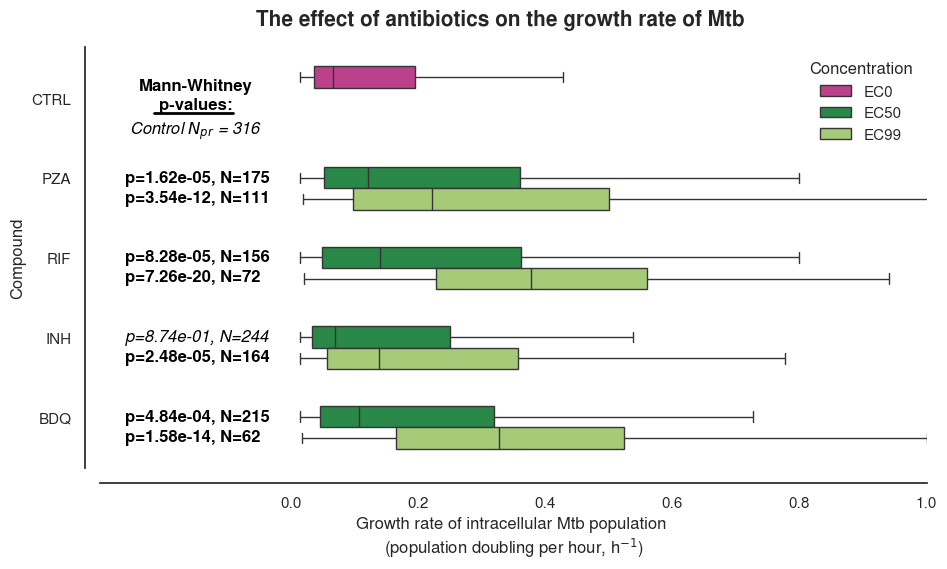

Compound: PZA, Concentration: EC50, U-statistic: 6259, p-value: 1.052e-10
Compound: PZA, Concentration: EC99, U-statistic: 4927, p-value: 6.650e-09
Compound: RIF, Concentration: EC50, U-statistic: 7963, p-value: 8.774e-07
Compound: RIF, Concentration: EC99, U-statistic: 1597, p-value: 1.997e-02
Compound: INH, Concentration: EC50, U-statistic: 6505, p-value: 1.604e-07
Compound: INH, Concentration: EC99, U-statistic: 467, p-value: 1.385e-01
Compound: BDQ, Concentration: EC50, U-statistic: 4192, p-value: 1.083e-05
Compound: BDQ, Concentration: EC99, U-statistic: 244, p-value: 9.168e-03


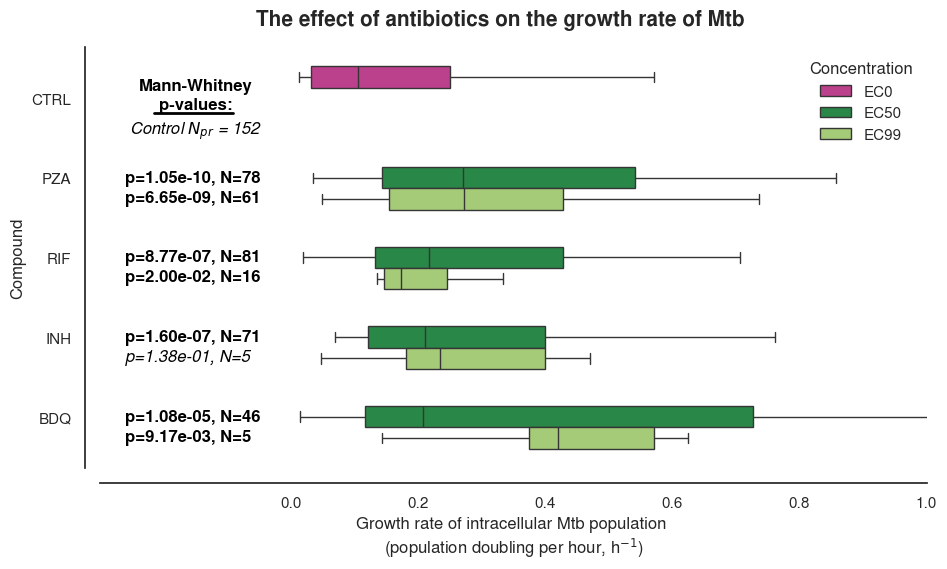

In [40]:

# Subset your data and remove duplicates based on Unique_ID
subset_df = df[(df['r2'] > 0.7) & (df['r2'] < 1) & (df['dt'] > 0) & (df['Strain/Compound'] != 'RD1')].drop_duplicates(subset=['ID'])

# Ensure 'dt' is numeric and drop rows with NaNs in 'dt'
subset_df['dt'] = pd.to_numeric(subset_df['dt'], errors='coerce')
subset_df = subset_df.dropna(subset=['dt'])

# Create a new column for the reciprocal of dt
subset_df['reciprocal_dt'] = 1 / subset_df['dt']

# Perform the Mann-Whitney U test for each compound and concentration against the control
control_data = subset_df[subset_df['Compound'] == 'CTRL']['reciprocal_dt']

# List to store p-values
p_values = []

for compound in subset_df['Compound'].unique():
    if compound != 'CTRL':
        for concentration in subset_df['Concentration'].unique():
            compound_data = subset_df[(subset_df['Compound'] == compound) & (subset_df['Concentration'] == concentration)]['reciprocal_dt']
            if not compound_data.empty:
                stat, p_value = mannwhitneyu(control_data, compound_data)
                p_values.append((compound, concentration, stat, p_value))
                print(f"Compound: {compound}, Concentration: {concentration}, U-statistic: {int(stat)}, p-value: {p_value:.3e}")


# Calculate sample sizes
sample_sizes = subset_df.groupby(['Compound', 'Concentration']).size().reset_index(name='N')
plt.figure(figsize=(16/1.5, 8.18898/1.5))

# Plot the data using the reciprocal of dt
g = sns.boxplot(x="reciprocal_dt", y="Compound",
                hue="Concentration", 
                palette=[expanded_piyg[-1], expanded_piyg[0], expanded_piyg[1]],
                data=subset_df, 
                hue_order=hue_order, fliersize=0)  

sns.despine(offset=10)
plt.xlabel("Growth rate of intracellular Mtb population \n(population doubling per hour, h$^{-1}$)")
plt.gcf().suptitle('The effect of antibiotics on the growth rate of Mtb', 
                   fontsize=15, fontweight='bold', 
                   y=0.95)
sns.despine(offset=11)
plt.legend(loc='upper right', frameon=False, title='Concentration')


xlim_min = -0.3
xlim_max = 1
plt.xlim(xlim_min, xlim_max)

# Annotate p-values on the plot
for i, (compound, concentration, stat, p_value) in enumerate(p_values):   
    positions = subset_df[(subset_df['Compound'] == compound) & (subset_df['Concentration'] == concentration)]
    if not positions.empty:
        x = xlim_min # positions['dt'].quantile(0.75) + 1.5 * (positions['dt'].quantile(0.75) - positions['dt'].quantile(0.25))  # position of the end of the whisker
        y = list(subset_df['Compound'].unique()).index(compound)
        y_offset = hue_order.index(concentration) * 0.25 - 0.25  # Adjust this multiplier to better space annotations
        if p_value < 0.1:
            p_text = f'{p_value:.2e}'# Italicize p-values below 0.1
            plt.annotate(f'p={p_text}, N={len(positions)}', xy=(x+0.04, y + y_offset), xycoords='data',
                             horizontalalignment='left', verticalalignment='center',
                             fontsize=12, color='black', fontweight = 'bold')
        else:
            p_text = f'{p_value:.2e}'
            plt.annotate(f'p={p_text}, N={len(positions)}', xy=(x+0.04, y + y_offset), xycoords='data',
                         horizontalalignment='left', verticalalignment='center',
                         fontsize=12, color='black', style = 'italic')

# # Annotate sample sizes next to each category
# compound_order = subset_df['Compound'].unique()
# for idx, compound in enumerate(compound_order):
#     n_count = sample_sizes[sample_sizes['Compound'] == compound]['N'].sum()
#     plt.annotate(f'N={n_count}', xy=(xlim_max - (xlim_max*0.1), idx), xycoords='data',
#                  horizontalalignment='left', verticalalignment='center',
#                  fontsize=9, color='black')
    
# print the p value column title
plt.annotate(f'Mann-Whitney\np-values:', xy=(xlim_min/2, 0.13),
                         fontsize=12, color='black', fontweight = 'bold', horizontalalignment = 'center')
plt.plot([xlim_min+0.085, xlim_min+0.21], [0.18, 0.18], color='black', lw=2)  # Draw a line under the title

plt.annotate(f'Control $N_{{pr}}$ = {len(control_data) // 2}', xy=(xlim_min / 2, 0.45),
                         fontsize=12, color='black', fontweight = 'regular', horizontalalignment = 'center', style = 'italic')

plt.xticks(np.arange(0, xlim_max+0.1, 0.2))  # Display x-axis labels from 0 to 70 with a step of 10

plt.savefig(os.path.join(output_dir, 'ATB_effect_1_over_dt_gt0_boxplot_stats_scaledN_strech.pdf'), bbox_inches='tight', dpi=314)

# Display the plot
plt.show()

# Assuming expanded_piyg and hue_order are defined elsewhere in your code
# expanded_piyg = ...
# hue_order = ...

# Subset your data and remove duplicates based on Unique_ID
subset_df = df[(df['r2'] > 0.7) & (df['r2'] < 1) & (df['dt'] > 0) & (df['Strain/Compound'] == 'RD1')].drop_duplicates(subset=['ID'])

# Ensure 'dt' is numeric and drop rows with NaNs in 'dt'
subset_df['dt'] = pd.to_numeric(subset_df['dt'], errors='coerce')
subset_df = subset_df.dropna(subset=['dt'])

# Create a new column for the reciprocal of dt
subset_df['reciprocal_dt'] = 1 / subset_df['dt']

# Perform the Mann-Whitney U test for each compound and concentration against the control
control_data = subset_df[subset_df['Compound'] == 'CTRL']['reciprocal_dt']

# List to store p-values
p_values = []

for compound in subset_df['Compound'].unique():
    if compound != 'CTRL':
        for concentration in subset_df['Concentration'].unique():
            compound_data = subset_df[(subset_df['Compound'] == compound) & (subset_df['Concentration'] == concentration)]['reciprocal_dt']
            if not compound_data.empty:
                stat, p_value = mannwhitneyu(control_data, compound_data)
                p_values.append((compound, concentration, stat, p_value))
                print(f"Compound: {compound}, Concentration: {concentration}, U-statistic: {int(stat)}, p-value: {p_value:.3e}")


# Calculate sample sizes
sample_sizes = subset_df.groupby(['Compound', 'Concentration']).size().reset_index(name='N')
plt.figure(figsize=(16/1.5, 8.18898/1.5))

# Plot the data using the reciprocal of dt
g = sns.boxplot(x="reciprocal_dt", y="Compound",
                hue="Concentration", 
                palette=[expanded_piyg[-1], expanded_piyg[0], expanded_piyg[1]],
                data=subset_df, 
                hue_order=hue_order, fliersize=0)  

sns.despine(offset=10)
plt.xlabel("Growth rate of intracellular Mtb population \n(population doubling per hour, h$^{-1}$)")
plt.gcf().suptitle('The effect of antibiotics on the growth rate of Mtb', 
                   fontsize=15, fontweight='bold', 
                   y=0.95)
sns.despine(offset=11)
plt.legend(loc='upper right', frameon=False, title='Concentration')


xlim_min = -0.3
xlim_max = 1
plt.xlim(xlim_min, xlim_max)

# Annotate p-values on the plot
for i, (compound, concentration, stat, p_value) in enumerate(p_values):   
    positions = subset_df[(subset_df['Compound'] == compound) & (subset_df['Concentration'] == concentration)]
    if not positions.empty:
        x = xlim_min # positions['dt'].quantile(0.75) + 1.5 * (positions['dt'].quantile(0.75) - positions['dt'].quantile(0.25))  # position of the end of the whisker
        y = list(subset_df['Compound'].unique()).index(compound)
        y_offset = hue_order.index(concentration) * 0.25 - 0.25  # Adjust this multiplier to better space annotations
        if p_value < 0.1:
            p_text = f'{p_value:.2e}'# Italicize p-values below 0.1
            plt.annotate(f'p={p_text}, N={len(positions)}', xy=(x+0.04, y + y_offset), xycoords='data',
                             horizontalalignment='left', verticalalignment='center',
                             fontsize=12, color='black', fontweight = 'bold')
        else:
            p_text = f'{p_value:.2e}'
            plt.annotate(f'p={p_text}, N={len(positions)}', xy=(x+0.04, y + y_offset), xycoords='data',
                         horizontalalignment='left', verticalalignment='center',
                         fontsize=12, color='black', style = 'italic')

# # Annotate sample sizes next to each category
# compound_order = subset_df['Compound'].unique()
# for idx, compound in enumerate(compound_order):
#     n_count = sample_sizes[sample_sizes['Compound'] == compound]['N'].sum()
#     plt.annotate(f'N={n_count}', xy=(xlim_max - (xlim_max*0.1), idx), xycoords='data',
#                  horizontalalignment='left', verticalalignment='center',
#                  fontsize=9, color='black')
    
# print the p value column title
plt.annotate(f'Mann-Whitney\np-values:', xy=(xlim_min/2, 0.13),
                         fontsize=12, color='black', fontweight = 'bold', horizontalalignment = 'center')
plt.plot([xlim_min+0.085, xlim_min+0.21], [0.18, 0.18], color='black', lw=2)  # Draw a line under the title

plt.annotate(f'Control $N_{{pr}}$ = {len(control_data) // 2}', xy=(xlim_min / 2, 0.45),
                         fontsize=12, color='black', fontweight = 'regular', horizontalalignment = 'center', style = 'italic')

plt.xticks(np.arange(0, xlim_max+0.1, 0.2))  # Display x-axis labels from 0 to 70 with a step of 10

plt.savefig(os.path.join(output_dir, 'ATB_effect_RD1_1_over_dt_gt0_boxplot_stats_scaledN_strech.pdf'), bbox_inches='tight', dpi=314)

# Display the plot
plt.show()


Compound: PZA, Concentration: EC50, U-statistic: 42965, p-value: 6.190e-06
Compound: PZA, Concentration: EC99, U-statistic: 20664, p-value: 4.834e-12
Compound: RIF, Concentration: EC50, U-statistic: 38647, p-value: 2.887e-05
Compound: RIF, Concentration: EC99, U-statistic: 7903, p-value: 1.073e-19
Compound: INH, Concentration: EC50, U-statistic: 76635, p-value: 8.891e-01
Compound: INH, Concentration: EC99, U-statistic: 40715, p-value: 2.296e-05
Compound: BDQ, Concentration: EC50, U-statistic: 56633, p-value: 2.635e-04
Compound: BDQ, Concentration: EC99, U-statistic: 7717, p-value: 3.216e-15


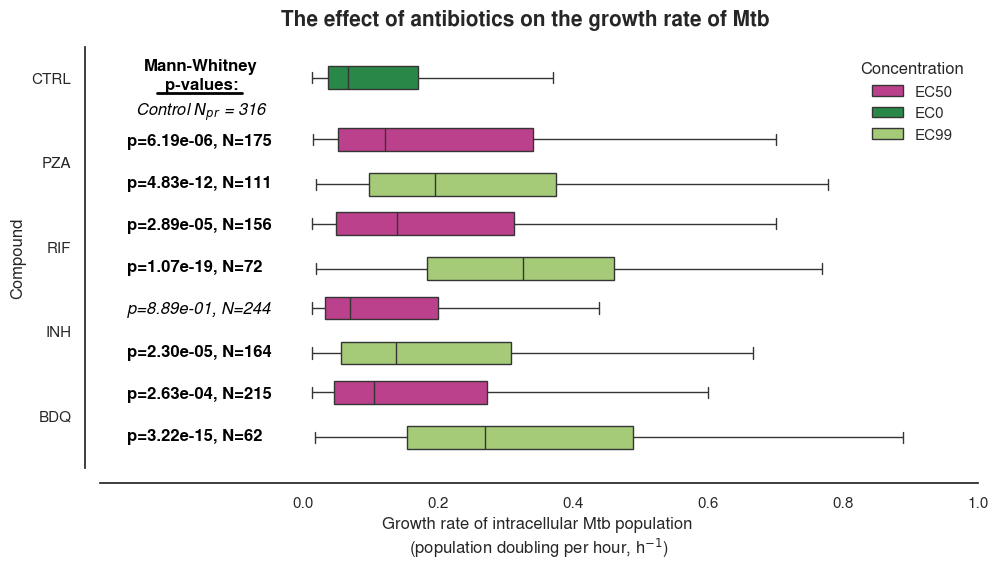

In [27]:
import seaborn as sns
import matplotlib.pyplot as plt
import pandas as pd
from scipy.stats import mannwhitneyu
import numpy as np
import os

# Assuming expanded_piyg and hue_order are defined elsewhere in your code
# expanded_piyg = ...
# hue_order = ...

# Subset your data and remove duplicates based on Unique_ID
subset_df = df[(df['r2'] > 0.7) & (df['r2'] < 1) & (df['dt'] > 0) & (df['Strain/Compound'] != 'RD1')].drop_duplicates(subset=['ID'])

# Ensure 'dt' is numeric and drop rows with NaNs in 'dt'
subset_df['dt'] = pd.to_numeric(subset_df['dt'], errors='coerce')
subset_df = subset_df.dropna(subset=['dt'])

# Create a new column for the reciprocal of dt
subset_df['reciprocal_dt'] = 1 / subset_df['dt']

# Perform the Mann-Whitney U test for each compound and concentration against the control
control_data = subset_df[subset_df['Compound'] == 'CTRL']['reciprocal_dt']

# List to store p-values
p_values = []

for compound in subset_df['Compound'].unique():
    if compound != 'CTRL':
        for concentration in subset_df['Concentration'].unique():
            compound_data = subset_df[(subset_df['Compound'] == compound) & (subset_df['Concentration'] == concentration)]['reciprocal_dt']
            if not compound_data.empty:
                stat, p_value = mannwhitneyu(control_data, compound_data)
                p_values.append((compound, concentration, stat, p_value))
                print(f"Compound: {compound}, Concentration: {concentration}, U-statistic: {int(stat)}, p-value: {p_value:.3e}")


# Calculate sample sizes
sample_sizes = subset_df.groupby(['Compound', 'Concentration']).size().reset_index(name='N')
plt.figure(figsize=(16/1.5, 8.18898/1.5))

# Plot the data using the reciprocal of dt
g = sns.boxplot(x="reciprocal_dt", y="Compound",
                hue="Concentration", 
                palette=[expanded_piyg[-1], expanded_piyg[0], expanded_piyg[1]],
                data=subset_df, 
                hue_order=hue_order, fliersize=0)  

sns.despine(offset=10)
plt.xlabel("Growth rate of intracellular Mtb population \n(population doubling per hour, h$^{-1}$)")
plt.gcf().suptitle('The effect of antibiotics on the growth rate of Mtb', 
                   fontsize=15, fontweight='bold', 
                   y=0.95)
sns.despine(offset=11)
plt.legend(loc='upper right', frameon=False, title='Concentration')


xlim_min = -0.3
xlim_max = 1
plt.xlim(xlim_min, xlim_max)

# Annotate p-values on the plot
for i, (compound, concentration, stat, p_value) in enumerate(p_values):   
    positions = subset_df[(subset_df['Compound'] == compound) & (subset_df['Concentration'] == concentration)]
    if not positions.empty:
        x = xlim_min # positions['dt'].quantile(0.75) + 1.5 * (positions['dt'].quantile(0.75) - positions['dt'].quantile(0.25))  # position of the end of the whisker
        y = list(subset_df['Compound'].unique()).index(compound)
        y_offset = hue_order.index(concentration) * 0.25 - 0.25  # Adjust this multiplier to better space annotations
        if p_value < 0.1:
            p_text = f'{p_value:.2e}'# Italicize p-values below 0.1
            plt.annotate(f'p={p_text}, N={len(positions)}', xy=(x+0.04, y + y_offset), xycoords='data',
                             horizontalalignment='left', verticalalignment='center',
                             fontsize=12, color='black', fontweight = 'bold')
        else:
            p_text = f'{p_value:.2e}'
            plt.annotate(f'p={p_text}, N={len(positions)}', xy=(x+0.04, y + y_offset), xycoords='data',
                         horizontalalignment='left', verticalalignment='center',
                         fontsize=12, color='black', style = 'italic')

# # Annotate sample sizes next to each category
# compound_order = subset_df['Compound'].unique()
# for idx, compound in enumerate(compound_order):
#     n_count = sample_sizes[sample_sizes['Compound'] == compound]['N'].sum()
#     plt.annotate(f'N={n_count}', xy=(xlim_max - (xlim_max*0.1), idx), xycoords='data',
#                  horizontalalignment='left', verticalalignment='center',
#                  fontsize=9, color='black')
    
# print the p value column title
plt.annotate(f'Mann-Whitney\np-values:', xy=(xlim_min/2, 0.13),
                         fontsize=12, color='black', fontweight = 'bold', horizontalalignment = 'center')
plt.plot([xlim_min+0.085, xlim_min+0.21], [0.18, 0.18], color='black', lw=2)  # Draw a line under the title

plt.annotate(f'Control $N_{{pr}}$ = {len(control_data) // 2}', xy=(xlim_min / 2, 0.45),
                         fontsize=12, color='black', fontweight = 'regular', horizontalalignment = 'center', style = 'italic')

plt.xticks(np.arange(0, xlim_max+0.1, 0.2))  # Display x-axis labels from 0 to 70 with a step of 10

plt.savefig(os.path.join(output_dir, 'ATB_effect_1_over_dt_gt0_boxplot_stats_scaledN_strech.png'), bbox_inches='tight', dpi=314)

# Display the plot
plt.show()


## just ec99/50

Compound: PZA, Concentration: EC50, U-statistic: 67634, p-value: 6.190e-06
Compound: RIF, Concentration: EC50, U-statistic: 59944, p-value: 2.887e-05
Compound: INH, Concentration: EC50, U-statistic: 77572, p-value: 8.891e-01
Compound: BDQ, Concentration: EC50, U-statistic: 79247, p-value: 2.635e-04


/tmp/ipykernel_2892626/440250423.py:38: UserWarning: The palette list has more values (3) than needed (2), which may not be intended.
  g = sns.boxplot(x="dt", y="Compound",


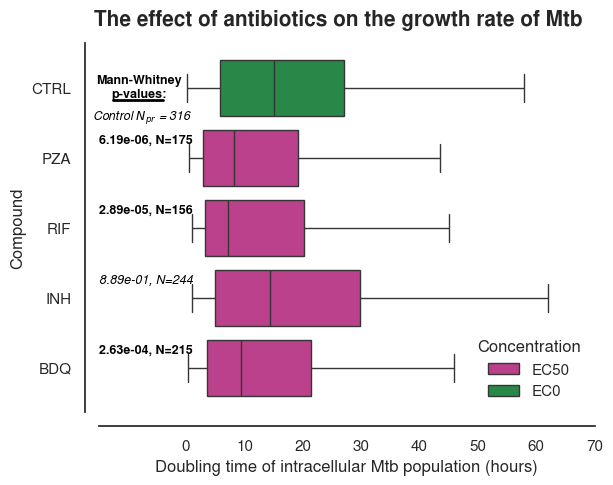

In [667]:
import seaborn as sns
import matplotlib.pyplot as plt
import pandas as pd
from scipy.stats import mannwhitneyu
import numpy as np
import os



# Assuming expanded_piyg and hue_order are defined elsewhere in your code
# expanded_piyg = ...
# hue_order = ...

# Subset your data and remove duplicates based on Unique_ID
subset_df = df[(df['r2'] > 0.7) & (df['r2'] < 1) & (df['dt'] > 0) & (df['Strain/Compound'] != 'RD1') & (df['Concentration'] != 'EC99')].drop_duplicates(subset=['ID'])

# Ensure 'dt' is numeric and drop rows with NaNs in 'dt'
subset_df['dt'] = pd.to_numeric(subset_df['dt'], errors='coerce')
subset_df = subset_df.dropna(subset=['dt'])


# Perform the Mann-Whitney U test for each compound and concentration against the control
control_data = subset_df[subset_df['Compound'] == 'CTRL']['dt']

# List to store p-values
p_values = []

for compound in subset_df['Compound'].unique():
    if compound != 'CTRL':
        for concentration in subset_df['Concentration'].unique():
            compound_data = subset_df[(subset_df['Compound'] == compound) & (subset_df['Concentration'] == concentration)]['dt']
            if not compound_data.empty:
                stat, p_value = mannwhitneyu(control_data, compound_data)
                p_values.append((compound, concentration, stat, p_value))
                print(f"Compound: {compound}, Concentration: {concentration}, U-statistic: {int(stat)}, p-value: {p_value:.3e}")

# Plot the data using the reciprocal of dt
g = sns.boxplot(x="dt", y="Compound",
                hue="Concentration", 
                palette=[expanded_piyg[-1], expanded_piyg[0], expanded_piyg[1]],
                data=subset_df, 
                hue_order=[con for con in hue_order if con != 'EC99'],  # Ensure EC99 is excluded from hue_order
                fliersize=0)  

plt.xlabel("Doubling time of intracellular Mtb population (hours)")
plt.gcf().suptitle('The effect of antibiotics on the growth rate of Mtb', 
                   fontsize=15, fontweight='bold', 
                   y=0.95)
sns.despine(offset=10)
plt.legend(loc='lower right', frameon=False, title='Concentration')
xlim_min = -15
plt.xlim(xlim_min, 70)

# Annotate p-values on the plot
for i, (compound, concentration, stat, p_value) in enumerate(p_values):   
    positions = subset_df[(subset_df['Compound'] == compound) & (subset_df['Concentration'] == concentration)]
    if not positions.empty:
        x = xlim_min # positions['dt'].quantile(0.75) + 1.5 * (positions['dt'].quantile(0.75) - positions['dt'].quantile(0.25))  # position of the end of the whisker
        y = list(subset_df['Compound'].unique()).index(compound)
        y_offset = hue_order.index(concentration) * 0.25 - 0.25  # Adjust this multiplier to better space annotations
        if p_value < 0.1:
            p_text = f'{p_value:.2e}'# Italicize p-values below 0.1
            plt.annotate(f'{p_text}, N={len(positions)}', xy=(x+0.02, y + y_offset), xycoords='data',
                             horizontalalignment='left', verticalalignment='center',
                             fontsize=9, color='black', fontweight = 'bold')
        else:
            p_text = f'{p_value:.2e}'
            plt.annotate(f'{p_text}, N={len(positions)}', xy=(x+0.02, y + y_offset), xycoords='data',
                         horizontalalignment='left', verticalalignment='center',
                         fontsize=9, color='black', style = 'italic')
# print the p value column title
plt.annotate(f'Mann-Whitney\np-values:', xy=(xlim_min+7, 0.13),
                         fontsize=9, color='black', fontweight = 'bold', horizontalalignment = 'center')
plt.plot([xlim_min+2.5, xlim_min+11], [0.18, 0.18], color='black', lw=2)  # Draw a line under the title

plt.annotate(f'Control $N_{{pr}}$ = {len(control_data) // 2}', xy=(xlim_min / 2, 0.45),
                         fontsize=9, color='black', fontweight = 'regular', horizontalalignment = 'center', style = 'italic')

plt.xticks(np.arange(0, 71, 10))  # Display x-axis labels from 0 to 70 with a step of 10
plt.savefig(os.path.join(output_dir, 'ATB_effect_dt_gt0_boxplot_EC50_stats_withN.png'), bbox_inches='tight', dpi=314)

# Display the plot
plt.show()

Compound: PZA, Concentration: EC99, U-statistic: 49488, p-value: 4.834e-12
Compound: RIF, Concentration: EC99, U-statistic: 37600, p-value: 1.073e-19
Compound: INH, Concentration: EC99, U-statistic: 62933, p-value: 2.296e-05
Compound: BDQ, Concentration: EC99, U-statistic: 31466, p-value: 3.216e-15


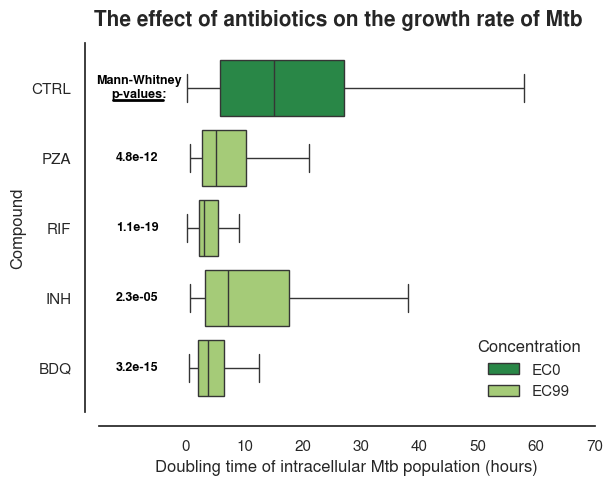

In [605]:
import seaborn as sns
import matplotlib.pyplot as plt
import pandas as pd
from scipy.stats import mannwhitneyu
import numpy as np
import os



# Assuming expanded_piyg and hue_order are defined elsewhere in your code
# expanded_piyg = ...
# hue_order = ...

# Subset your data and remove duplicates based on Unique_ID
subset_df = df[(df['r2'] > 0.7) & (df['r2'] < 1) & (df['dt'] > 0) & (df['Strain/Compound'] != 'RD1') & (df['Concentration'] != 'EC50')].drop_duplicates(subset=['ID'])

# Ensure 'dt' is numeric and drop rows with NaNs in 'dt'
subset_df['dt'] = pd.to_numeric(subset_df['dt'], errors='coerce')
subset_df = subset_df.dropna(subset=['dt'])


# Perform the Mann-Whitney U test for each compound and concentration against the control
control_data = subset_df[subset_df['Compound'] == 'CTRL']['dt']

# List to store p-values
p_values = []

for compound in subset_df['Compound'].unique():
    if compound != 'CTRL':
        for concentration in subset_df['Concentration'].unique():
            compound_data = subset_df[(subset_df['Compound'] == compound) & (subset_df['Concentration'] == concentration)]['dt']
            if not compound_data.empty:
                stat, p_value = mannwhitneyu(control_data, compound_data)
                p_values.append((compound, concentration, stat, p_value))
                print(f"Compound: {compound}, Concentration: {concentration}, U-statistic: {int(stat)}, p-value: {p_value:.3e}")

# Plot the data using the reciprocal of dt
g = sns.boxplot(x="dt", y="Compound",
                hue="Concentration", 
                palette=[expanded_piyg[0], expanded_piyg[1]],#, expanded_piyg[1]],
                data=subset_df, 
                hue_order=[con for con in hue_order if con != 'EC50'],  # Ensure EC99 is excluded from hue_order
                fliersize=0)  

plt.xlabel("Doubling time of intracellular Mtb population (hours)")
plt.gcf().suptitle('The effect of antibiotics on the growth rate of Mtb', 
                   fontsize=15, fontweight='bold', 
                   y=0.95)
sns.despine(offset=10)
plt.legend(loc='lower right', frameon=False, title='Concentration')
xlim_min = -15
plt.xlim(xlim_min, 70)

# Annotate p-values on the plot
for i, (compound, concentration, stat, p_value) in enumerate(p_values):   
    positions = subset_df[(subset_df['Compound'] == compound) & (subset_df['Concentration'] == concentration)]
    if not positions.empty:
        x = xlim_min # positions['dt'].quantile(0.75) + 1.5 * (positions['dt'].quantile(0.75) - positions['dt'].quantile(0.25))  # position of the end of the whisker
        y = list(subset_df['Compound'].unique()).index(compound)
        y_offset = hue_order.index(concentration) * 0.25 - 0.25  # Adjust this multiplier to better space annotations
        if p_value < 0.1:
            p_text = f'{p_value:.2e}'# Italicize p-values below 0.1
            plt.annotate(f'{p_text}, N={len(positions)}', xy=(x+0.02, y + y_offset), xycoords='data',
                             horizontalalignment='left', verticalalignment='center',
                             fontsize=9, color='black', fontweight = 'bold')
        else:
            p_text = f'{p_value:.2e}'
            plt.annotate(f'{p_text}, N={len(positions)}', xy=(x+0.02, y + y_offset), xycoords='data',
                         horizontalalignment='left', verticalalignment='center',
                         fontsize=9, color='black', style = 'italic')
plt.annotate(f'Control $N_{{pr}}$ = {len(control_data) // 2}', xy=(xlim_min / 2, 0.45),
                         fontsize=9, color='black', fontweight = 'regular', horizontalalignment = 'center', style = 'italic')

# print the p value column title
plt.annotate(f'Mann-Whitney\np-values:', xy=(xlim_min+7, 0.13),
                         fontsize=9, color='black', fontweight = 'bold', horizontalalignment = 'center')
plt.plot([xlim_min+2.5, xlim_min+11], [0.18, 0.18], color='black', lw=2)  # Draw a line under the title

plt.xticks(np.arange(0, 71, 10))  # Display x-axis labels from 0 to 70 with a step of 10
plt.savefig(os.path.join(output_dir, 'ATB_effect_dt_gt0_boxplot_EC99_stats.png'), bbox_inches='tight', dpi=314)

# Display the plot
plt.show()

Compound: PZA, Concentration: EC50, U-statistic: 42965, p-value: 6.190e-06
Compound: RIF, Concentration: EC50, U-statistic: 38647, p-value: 2.887e-05
Compound: INH, Concentration: EC50, U-statistic: 76635, p-value: 8.891e-01
Compound: BDQ, Concentration: EC50, U-statistic: 56633, p-value: 2.635e-04


/tmp/ipykernel_2892626/3946831387.py:38: UserWarning: The palette list has more values (3) than needed (2), which may not be intended.
  g = sns.boxplot(x="reciprocal_dt", y="Compound",


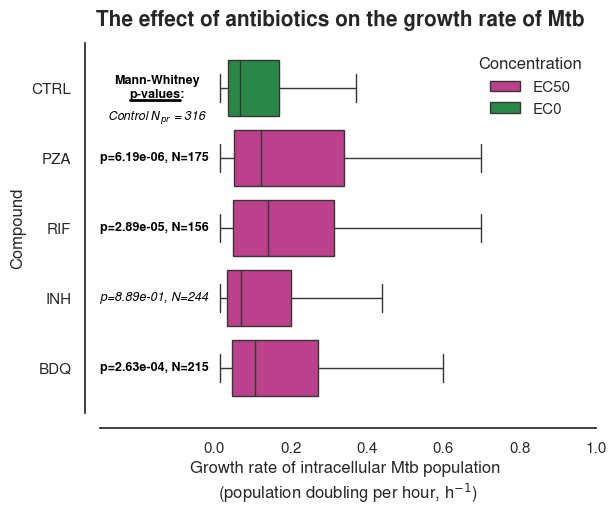

In [689]:
import seaborn as sns
import matplotlib.pyplot as plt
import pandas as pd
from scipy.stats import mannwhitneyu
import numpy as np
import os

# Assuming expanded_piyg and hue_order are defined elsewhere in your code
# expanded_piyg = ...
# hue_order = ...

# Subset your data and remove duplicates based on Unique_ID
subset_df = df[(df['r2'] > 0.7) & (df['r2'] < 1) & (df['dt'] > 0) & (df['Strain/Compound'] != 'RD1') & (df['Concentration'] != 'EC99')].drop_duplicates(subset=['ID'])

# Ensure 'dt' is numeric and drop rows with NaNs in 'dt'
subset_df['dt'] = pd.to_numeric(subset_df['dt'], errors='coerce')
subset_df = subset_df.dropna(subset=['dt'])

# Create a new column for the reciprocal of dt
subset_df['reciprocal_dt'] = 1 / subset_df['dt']

# Perform the Mann-Whitney U test for each compound and concentration against the control
control_data = subset_df[subset_df['Compound'] == 'CTRL']['reciprocal_dt']

# List to store p-values
p_values = []

for compound in subset_df['Compound'].unique():
    if compound != 'CTRL':
        for concentration in subset_df['Concentration'].unique():
            compound_data = subset_df[(subset_df['Compound'] == compound) & (subset_df['Concentration'] == concentration)]['reciprocal_dt']
            if not compound_data.empty:
                stat, p_value = mannwhitneyu(control_data, compound_data)
                p_values.append((compound, concentration, stat, p_value))
                print(f"Compound: {compound}, Concentration: {concentration}, U-statistic: {int(stat)}, p-value: {p_value:.3e}")

# Plot the data using the reciprocal of dt
g = sns.boxplot(x="reciprocal_dt", y="Compound",
                hue="Concentration", 
                palette=[expanded_piyg[-1], expanded_piyg[0], expanded_piyg[1]],
                data=subset_df, 
                hue_order=[con for con in hue_order if con != 'EC99'], fliersize=0)  

sns.despine(offset=10)
plt.xlabel("Growth rate of intracellular Mtb population \n(population doubling per hour, h$^{-1}$)")
plt.gcf().suptitle('The effect of antibiotics on the growth rate of Mtb', 
                   fontsize=15, fontweight='bold', 
                   y=0.95)
sns.despine(offset=11)
plt.legend(loc='upper right', frameon=False, title='Concentration')


xlim_min = -0.3
plt.xlim(xlim_min, 1)

# Annotate p-values on the plot
for i, (compound, concentration, stat, p_value) in enumerate(p_values):   
    positions = subset_df[(subset_df['Compound'] == compound) & (subset_df['Concentration'] == concentration)]
    if not positions.empty:
        x = xlim_min # positions['dt'].quantile(0.75) + 1.5 * (positions['dt'].quantile(0.75) - positions['dt'].quantile(0.25))  # position of the end of the whisker
        y = list(subset_df['Compound'].unique()).index(compound)
        y_offset = hue_order.index(concentration) * 0.25 - 0.25  # Adjust this multiplier to better space annotations
        if p_value < 0.1:
            p_text = f'{p_value:.2e}'# Italicize p-values below 0.1
            plt.annotate(f'p={p_text}, N={len(positions)}', xy=(x+0.0, y ), xycoords='data',
                             horizontalalignment='left', verticalalignment='center',
                             fontsize=9, color='black', fontweight = 'bold')
        else:
            p_text = f'{p_value:.2e}'
            plt.annotate(f'p={p_text}, N={len(positions)}', xy=(x+0.0, y), xycoords='data',
                         horizontalalignment='left', verticalalignment='center',
                         fontsize=9, color='black', style = 'italic')
# print the p value column title
plt.annotate(f'Mann-Whitney\np-values:', xy=(xlim_min/2, 0.13),
                         fontsize=9, color='black', fontweight = 'bold', horizontalalignment = 'center')
# plt.plot([xlim_min+0.015, xlim_min+0.14], [0.18, 0.18], color='black', lw=2)  # Draw a line under the title
plt.annotate(f'Control $N_{{pr}}$ = {len(control_data) // 2}', xy=(xlim_min / 2, 0.45),
                         fontsize=9, color='black', fontweight = 'regular', horizontalalignment = 'center', style = 'italic')

plt.xticks(np.arange(0, 1.1, 0.2))  # Display x-axis labels from 0 to 70 with a step of 10
plt.plot([-0.22, -0.09], [0.18, 0.18], color='black', lw=2)  # Draw a line under the title

plt.savefig(os.path.join(output_dir, 'ATB_effect_1_over_dt_gt0_boxplot_EC50_stats_withN.png'), bbox_inches='tight', dpi=314)

# Display the plot
plt.show()


Compound: PZA, Concentration: EC99, U-statistic: 20664, p-value: 4.834e-12
Compound: RIF, Concentration: EC99, U-statistic: 7903, p-value: 1.073e-19
Compound: INH, Concentration: EC99, U-statistic: 40715, p-value: 2.296e-05
Compound: BDQ, Concentration: EC99, U-statistic: 7717, p-value: 3.216e-15


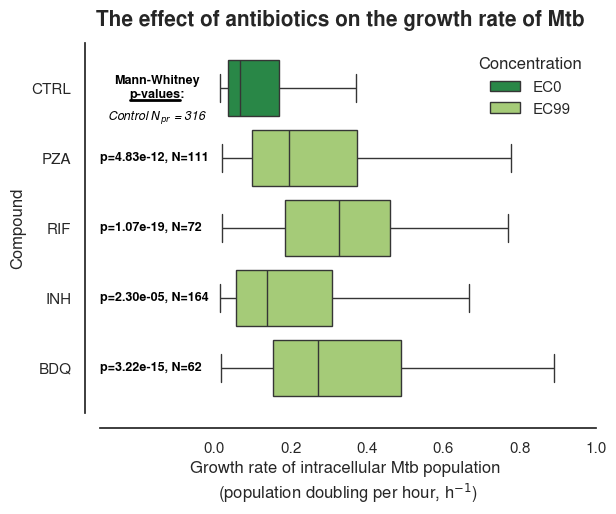

In [690]:
import seaborn as sns
import matplotlib.pyplot as plt
import pandas as pd
from scipy.stats import mannwhitneyu
import numpy as np
import os

# Assuming expanded_piyg and hue_order are defined elsewhere in your code
# expanded_piyg = ...
# hue_order = ...

# Subset your data and remove duplicates based on Unique_ID
subset_df = df[(df['r2'] > 0.7) & (df['r2'] < 1) & (df['dt'] > 0) & (df['Strain/Compound'] != 'RD1') & (df['Concentration'] != 'EC50')].drop_duplicates(subset=['ID'])

# Ensure 'dt' is numeric and drop rows with NaNs in 'dt'
subset_df['dt'] = pd.to_numeric(subset_df['dt'], errors='coerce')
subset_df = subset_df.dropna(subset=['dt'])

# Create a new column for the reciprocal of dt
subset_df['reciprocal_dt'] = 1 / subset_df['dt']

# Perform the Mann-Whitney U test for each compound and concentration against the control
control_data = subset_df[subset_df['Compound'] == 'CTRL']['reciprocal_dt']

# List to store p-values
p_values = []

for compound in subset_df['Compound'].unique():
    if compound != 'CTRL':
        for concentration in subset_df['Concentration'].unique():
            compound_data = subset_df[(subset_df['Compound'] == compound) & (subset_df['Concentration'] == concentration)]['reciprocal_dt']
            if not compound_data.empty:
                stat, p_value = mannwhitneyu(control_data, compound_data)
                p_values.append((compound, concentration, stat, p_value))
                print(f"Compound: {compound}, Concentration: {concentration}, U-statistic: {int(stat)}, p-value: {p_value:.3e}")

# Plot the data using the reciprocal of dt
g = sns.boxplot(x="reciprocal_dt", y="Compound",
                hue="Concentration", 
                palette=[expanded_piyg[0], expanded_piyg[1]],# expanded_piyg[1]],
                data=subset_df, 
                hue_order=[con for con in hue_order if con != 'EC50'], fliersize=0)  

sns.despine(offset=10)
plt.xlabel("Growth rate of intracellular Mtb population \n(population doubling per hour, h$^{-1}$)")
plt.gcf().suptitle('The effect of antibiotics on the growth rate of Mtb', 
                   fontsize=15, fontweight='bold', 
                   y=0.95)
sns.despine(offset=11)
plt.legend(loc='upper right', frameon=False, title='Concentration')


xlim_min = -0.3
plt.xlim(xlim_min, 1)

# Annotate p-values on the plot
for i, (compound, concentration, stat, p_value) in enumerate(p_values):   
    positions = subset_df[(subset_df['Compound'] == compound) & (subset_df['Concentration'] == concentration)]
    if not positions.empty:
        x = xlim_min # positions['dt'].quantile(0.75) + 1.5 * (positions['dt'].quantile(0.75) - positions['dt'].quantile(0.25))  # position of the end of the whisker
        y = list(subset_df['Compound'].unique()).index(compound)
        y_offset = hue_order.index(concentration) * 0.25 - 0.25  # Adjust this multiplier to better space annotations
        if p_value < 0.1:
            p_text = f'{p_value:.2e}'# Italicize p-values below 0.1
            plt.annotate(f'p={p_text}, N={len(positions)}', xy=(x+0.0, y ), xycoords='data',
                             horizontalalignment='left', verticalalignment='center',
                             fontsize=9, color='black', fontweight = 'bold')
        else:
            p_text = f'{p_value:.2e}'
            plt.annotate(f'p={p_text}, N={len(positions)}', xy=(x+0.0, y), xycoords='data',
                         horizontalalignment='left', verticalalignment='center',
                         fontsize=9, color='black', style = 'italic')
# print the p value column title
plt.annotate(f'Mann-Whitney\np-values:', xy=(xlim_min/2, 0.13),
                         fontsize=9, color='black', fontweight = 'bold', horizontalalignment = 'center')
# plt.plot([xlim_min+0.015, xlim_min+0.14], [0.18, 0.18], color='black', lw=2)  # Draw a line under the title
plt.annotate(f'Control $N_{{pr}}$ = {len(control_data) // 2}', xy=(xlim_min / 2, 0.45),
                         fontsize=9, color='black', fontweight = 'regular', horizontalalignment = 'center', style = 'italic')

plt.xticks(np.arange(0, 1.1, 0.2))  # Display x-axis labels from 0 to 70 with a step of 10
plt.plot([-0.22, -0.09], [0.18, 0.18], color='black', lw=2)  # Draw a line under the title


plt.savefig(os.path.join(output_dir, 'ATB_effect_1_over_dt_gt0_boxplot_EC99_stats.png'), bbox_inches='tight', dpi=314)

# Display the plot
plt.show()


# Quantifying the proportion of fast growers, slow growers etc

In [44]:
grouped_counts

dt_category                    < 18 hours \n Rapid Growth  \
Strain Compound Concentration                               
WT     CTRL     EC0                                   345   
       PZA      EC50                                  125   
                EC99                                   94   
       RIF      EC50                                  112   
                EC99                                   70   
       INH      EC50                                  144   
                EC99                                  124   
       BDQ      EC50                                  152   
                EC99                                   60   
RD1    CTRL     EC0                                   195   
       PZA      EC50                                   72   
                EC99                                   59   
       RIF      EC50                                   74   
                EC99                                   16   
       INH      EC50                                   71   
                EC99                                    4   
       BDQ      EC50                                   42   
                EC99                                    5   

dt_category                    18-30 hours \n Intermediate Growth  \
Strain Compound Concentration                                       
WT     CTRL     EC0                                           165   
       PZA      EC50                                           30   
                EC99                                            8   
       RIF      EC50                                           18   
                EC99                                            1   
       INH      EC50                                           39   
                EC99                                           11   
       BDQ      EC50                                           31   
                EC99                                            1   
RD1    CTRL     EC0                                            29   
       PZA      EC50                                            6   
                EC99                                            2   
       RIF      EC50                                            0   
                EC99                                            0   
       INH      EC50                                            0   
                EC99                                            1   
       BDQ      EC50                                            2   
                EC99                                            0   

dt_category                    > 30 hours \n Slow Growth  
Strain Compound Concentration                             
WT     CTRL     EC0                                  122  
       PZA      EC50                                  20  
                EC99                                   9  
       RIF      EC50                                  26  
                EC99                                   1  
       INH      EC50                                  61  
                EC99                                  29  
       BDQ      EC50                                  32  
                EC99                                   1  
RD1    CTRL     EC0                                   81  
       PZA      EC50                                   0  
                EC99                                   0  
       RIF      EC50                                   7  
                EC99                                   0  
       INH      EC50                                   0  
                EC99                                   0  
       BDQ      EC50                                   2  
                EC99                                   0

<Figure size 1200x800 with 0 Axes>

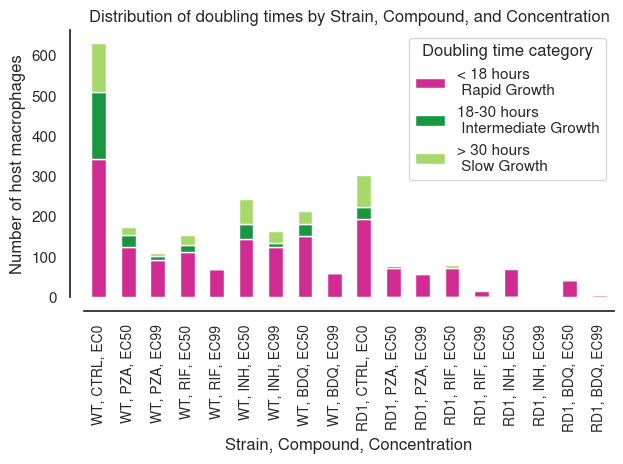

In [60]:
# Step 1: Categorize 'dt' into bins
bin1 = 0
bin2 = 18
bin3 = 30
subset_df['dt_category'] = pd.cut(subset_df['dt'], bins=[bin1, bin2, bin3, float('inf')], 
                                  labels=[f'< {bin2} hours \n Rapid Growth', f'{bin2}-{bin3} hours \n Intermediate Growth', f'> {bin3} hours \n Slow Growth'])

# Step 2: Group by 'Strain', 'Compound', and 'Concentration' and count dt categories
grouped_counts = subset_df.groupby(['Strain', 'Compound', 'Concentration', 'dt_category']).size().unstack(fill_value=0)

# Step 4: Sort the index according to the desired order
strain_order = ['WT', 'RD1']  # Custom strain order
compound_order = ['CTRL', 'PZA', 'RIF', 'INH', 'BDQ']  # Custom compound order
concentration_order = ['EC0', 'EC50', 'EC99']  # Custom concentration order

# Sort the index by strain, compound, and concentration
grouped_counts = grouped_counts.reindex(pd.MultiIndex.from_product([strain_order, compound_order, concentration_order], names=['Strain', 'Compound', 'Concentration']), fill_value=0)
grouped_counts =  grouped_counts[(grouped_counts != 0).any(axis=1)]

# Step 3: Plot the counts for each group
plt.figure(figsize=(12, 8))
ax = grouped_counts.plot(kind='bar', stacked=True, color=[expanded_piyg[-1], expanded_piyg[0], expanded_piyg[1]])

plt.xlabel("Strain, Compound, Concentration")
plt.ylabel("Number of host macrophages")
plt.title("Distribution of doubling times by Strain, Compound, and Concentration")

plt.legend(title="Doubling time category")
sns.despine(offset=10)

# Remove automatic xticks
ax.set_xticks([])

# Set manual xticks
xtick_labels = [f'{strain}, {compound}, {concentration}' for strain, compound, concentration in grouped_counts.index]
ax.set_xticks(range(len(xtick_labels)))
ax.set_xticklabels(xtick_labels, rotation=90, ha='center', fontsize=10)

plt.tight_layout()

plt.savefig(os.path.join(output_dir, 'proportion_dt.pdf'), bbox_inches='tight', dpi=314)
plt.show()


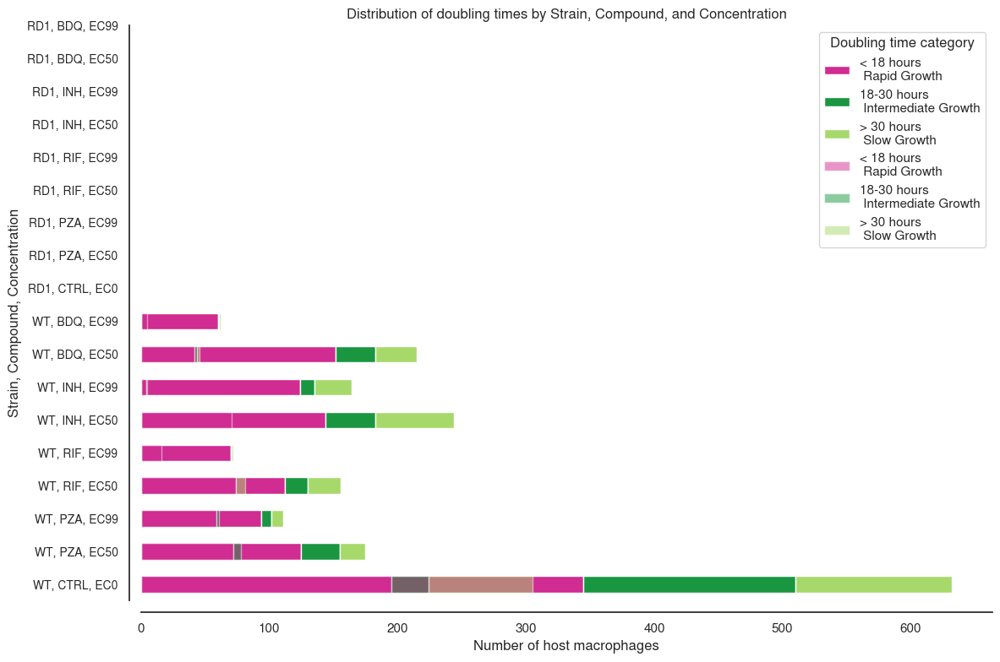

In [47]:
# Step 1: Categorize 'dt' into bins
subset_df['dt_category'] = pd.cut(subset_df['dt'], bins=[0, 18, 30, float('inf')], 
                                  labels=['< 18 hours \n Rapid Growth', '18-30 hours \n Intermediate Growth', '> 30 hours \n Slow Growth'])

# Step 2: Group by 'Strain', 'Compound', and 'Concentration' and count dt categories
grouped_counts = subset_df.groupby(['Strain', 'Compound', 'Concentration', 'dt_category']).size().unstack(fill_value=0)

# Step 4: Sort the index according to the desired order
strain_order = ['WT', 'RD1']  # Custom strain order
compound_order = ['CTRL', 'PZA', 'RIF', 'INH', 'BDQ']  # Custom compound order
concentration_order = ['EC0', 'EC50', 'EC99']  # Custom concentration order

# Sort the index by strain, compound, and concentration
grouped_counts = grouped_counts.reindex(pd.MultiIndex.from_product([strain_order, compound_order, concentration_order], names=['Strain', 'Compound', 'Concentration']), fill_value=0)
grouped_counts = grouped_counts[(grouped_counts != 0).any(axis=1)]

# Step 3: Plot WT and RD1 separately
plt.figure(figsize=(12, 8))

# Plot WT bars with full opacity
grouped_counts.loc['WT'].plot(kind='barh', stacked=True, color=[expanded_piyg[-1], expanded_piyg[0], expanded_piyg[1]], ax=plt.gca(), alpha=1, label="WT")

# Plot RD1 bars with reduced opacity
grouped_counts.loc['RD1'].plot(kind='barh', stacked=True, color=[expanded_piyg[-1], expanded_piyg[0], expanded_piyg[1]], ax=plt.gca(), alpha=0.5, label="RD1")

# Add labels and titles
plt.xlabel("Number of host macrophages")
plt.ylabel("Strain, Compound, Concentration")
plt.title("Distribution of doubling times by Strain, Compound, and Concentration")
plt.legend(title="Doubling time category")
sns.despine(offset=10)

# Remove automatic yticks
plt.gca().set_yticks([])

# Set manual y-ticks for better readability
ytick_labels = [f'{strain}, {compound}, {concentration}' for strain, compound, concentration in grouped_counts.index]
plt.gca().set_yticks(range(len(ytick_labels)))
plt.gca().set_yticklabels(ytick_labels, fontsize=10)

plt.tight_layout()

# Save the figure
plt.savefig(os.path.join(output_dir, 'updated_plot_with_rd1_alpha_rotation.png'), bbox_inches='tight', dpi=300)

plt.show()


## exploring other options 

Compound: PZA, Concentration: EC50, U-statistic: 58584, p-value: 2.199e-01
Compound: PZA, Concentration: EC99, U-statistic: 39980, p-value: 1.656e-02
Compound: RIF, Concentration: EC50, U-statistic: 59118, p-value: 8.105e-05
Compound: RIF, Concentration: EC99, U-statistic: 31756, p-value: 1.775e-08
Compound: INH, Concentration: EC50, U-statistic: 79221, p-value: 5.217e-01
Compound: INH, Concentration: EC99, U-statistic: 60747, p-value: 5.130e-04
Compound: BDQ, Concentration: EC50, U-statistic: 69961, p-value: 5.068e-01
Compound: BDQ, Concentration: EC99, U-statistic: 26665, p-value: 1.627e-06


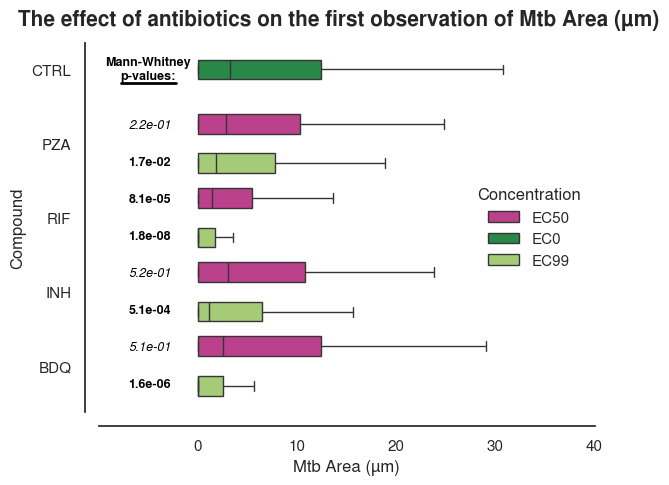

In [565]:
import seaborn as sns
import matplotlib.pyplot as plt
import pandas as pd
from scipy.stats import mannwhitneyu
import numpy as np
import os

var = 'Mtb Area (µm)'
when = 'first'

# Subset your data and remove duplicates based on Unique_ID
subset_df = df[(df['r2'] > 0.7) & (df['r2'] < 1) & (df['dt'] > 0) & (df['Strain/Compound'] != 'RD1')].drop_duplicates(subset=['ID'], keep = when)

# Ensure 'dt' is numeric and drop rows with NaNs in 'dt'
subset_df[var] = pd.to_numeric(subset_df[var], errors='coerce')
subset_df = subset_df.dropna(subset=[var])


# Perform the Mann-Whitney U test for each compound and concentration against the control
control_data = subset_df[subset_df['Compound'] == 'CTRL'][var]

# List to store p-values
p_values = []

for compound in subset_df['Compound'].unique():
    if compound != 'CTRL':
        for concentration in subset_df['Concentration'].unique():
            compound_data = subset_df[(subset_df['Compound'] == compound) & (subset_df['Concentration'] == concentration)][var]
            if not compound_data.empty:
                stat, p_value = mannwhitneyu(control_data, compound_data)
                p_values.append((compound, concentration, stat, p_value))
                print(f"Compound: {compound}, Concentration: {concentration}, U-statistic: {int(stat)}, p-value: {p_value:.3e}")

# Plot the data using the reciprocal of dt
g = sns.boxplot(x=var, y="Compound",
                hue="Concentration", 
                palette=[expanded_piyg[-1], expanded_piyg[0], expanded_piyg[1]],
                data=subset_df, 
                hue_order=hue_order, fliersize=0)  

# plt.xlabel("Doubling time of intracellular Mtb population (hours)")
plt.gcf().suptitle(f'The effect of antibiotics on the {when} observation of {var}', 
                   fontsize=15, fontweight='bold', 
                   y=0.95)
sns.despine(offset=10)
plt.legend(loc='center right', frameon=False, title='Concentration')
xlim_min = -10
xlim_max = 40
plt.xlim(xlim_min, xlim_max)

# Annotate p-values on the plot
for i, (compound, concentration, stat, p_value) in enumerate(p_values):   
    positions = subset_df[(subset_df['Compound'] == compound) & (subset_df['Concentration'] == concentration)]
    if not positions.empty:
        x = xlim_min # positions['dt'].quantile(0.75) + 1.5 * (positions['dt'].quantile(0.75) - positions['dt'].quantile(0.25))  # position of the end of the whisker
        y = list(subset_df['Compound'].unique()).index(compound)
        y_offset = hue_order.index(concentration) * 0.25 - 0.25  # Adjust this multiplier to better space annotations
        if p_value < 0.1:
            p_text = f'{p_value:.1e}'# Italicize p-values below 0.1
            plt.annotate(f'{p_text}', xy=(x+3, y + y_offset), xycoords='data',
                             horizontalalignment='left', verticalalignment='center',
                             fontsize=9, color='black', fontweight = 'bold')
        else:
            p_text = f'{p_value:.1e}'
            plt.annotate(f'{p_text}', xy=(x+3, y + y_offset), xycoords='data',
                         horizontalalignment='left', verticalalignment='center',
                         fontsize=9, color='black', style = 'italic')
# print the p value column title
plt.annotate(f'Mann-Whitney\np-values:', xy=(xlim_min/2, 0.13),
                         fontsize=9, color='black', fontweight = 'bold', horizontalalignment = 'center')
plt.plot([xlim_min+abs(xlim_min/4.5), -abs(xlim_min/4.5)], [0.18, 0.18], color='black', lw=2)  # Draw a line under the title
plt.xticks(np.arange(0, xlim_max+1, 10))  # Display x-axis labels from 0 to 70 with a step of 10

plt.savefig(os.path.join(output_dir, f'ATB_effect_{var}_{when}_boxplot_stats.png'), bbox_inches='tight', dpi=314)

# Display the plot
plt.show()

Compound: PZA, Concentration: EC50, U-statistic: 56105, p-value: 7.681e-01
Compound: PZA, Concentration: EC99, U-statistic: 37386, p-value: 2.681e-01
Compound: RIF, Concentration: EC50, U-statistic: 48982, p-value: 9.020e-01
Compound: RIF, Concentration: EC99, U-statistic: 24939, p-value: 1.811e-01
Compound: INH, Concentration: EC50, U-statistic: 83677, p-value: 5.025e-02
Compound: INH, Concentration: EC99, U-statistic: 57682, p-value: 2.558e-02
Compound: BDQ, Concentration: EC50, U-statistic: 70738, p-value: 3.666e-01
Compound: BDQ, Concentration: EC99, U-statistic: 23202, p-value: 1.657e-02


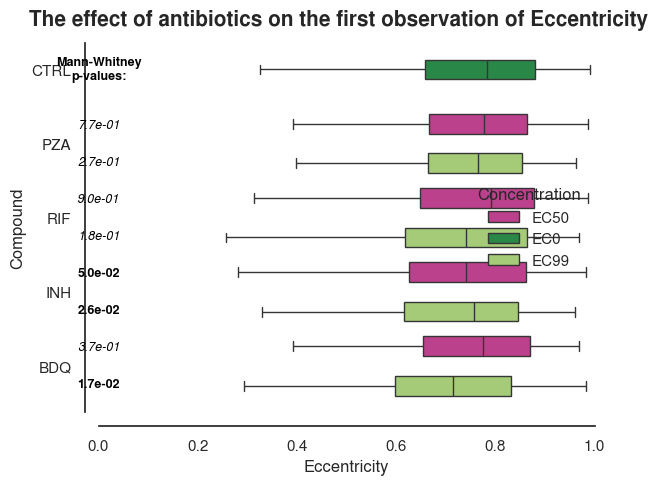

In [718]:
import seaborn as sns
import matplotlib.pyplot as plt
import pandas as pd
from scipy.stats import mannwhitneyu
import numpy as np
import os

var = 'Eccentricity'
when = 'first'

# Subset your data and remove duplicates based on Unique_ID
subset_df = df[(df['r2'] > 0.7) & (df['r2'] < 1) & (df['dt'] > 0) & (df['Strain/Compound'] != 'RD1')].drop_duplicates(subset=['ID'], keep = when)

# Ensure 'dt' is numeric and drop rows with NaNs in 'dt'
subset_df[var] = pd.to_numeric(subset_df[var], errors='coerce')
subset_df = subset_df.dropna(subset=[var])


# Perform the Mann-Whitney U test for each compound and concentration against the control
control_data = subset_df[subset_df['Compound'] == 'CTRL'][var]

# List to store p-values
p_values = []

for compound in subset_df['Compound'].unique():
    if compound != 'CTRL':
        for concentration in subset_df['Concentration'].unique():
            compound_data = subset_df[(subset_df['Compound'] == compound) & (subset_df['Concentration'] == concentration)][var]
            if not compound_data.empty:
                stat, p_value = mannwhitneyu(control_data, compound_data)
                p_values.append((compound, concentration, stat, p_value))
                print(f"Compound: {compound}, Concentration: {concentration}, U-statistic: {int(stat)}, p-value: {p_value:.3e}")

# Plot the data using the reciprocal of dt
g = sns.boxplot(x=var, y="Compound",
                hue="Concentration", 
                palette=[expanded_piyg[-1], expanded_piyg[0], expanded_piyg[1]],
                data=subset_df, 
                hue_order=hue_order, fliersize=0)  

# plt.xlabel("Doubling time of intracellular Mtb population (hours)")
plt.gcf().suptitle(f'The effect of antibiotics on the {when} observation of {var}', 
                   fontsize=15, fontweight='bold', 
                   y=0.95)
sns.despine(offset=10)
plt.legend(loc='center right', frameon=False, title='Concentration')
xlim_min = -0
xlim_max = 1
plt.xlim(xlim_min, xlim_max)

# Annotate p-values on the plot
for i, (compound, concentration, stat, p_value) in enumerate(p_values):   
    positions = subset_df[(subset_df['Compound'] == compound) & (subset_df['Concentration'] == concentration)]
    if not positions.empty:
        x = xlim_min # positions['dt'].quantile(0.75) + 1.5 * (positions['dt'].quantile(0.75) - positions['dt'].quantile(0.25))  # position of the end of the whisker
        y = list(subset_df['Compound'].unique()).index(compound)
        y_offset = hue_order.index(concentration) * 0.25 - 0.25  # Adjust this multiplier to better space annotations
        if p_value < 0.1:
            p_text = f'{p_value:.1e}'# Italicize p-values below 0.1
            plt.annotate(f'{p_text}', xy=(x+abs(xlim_min/2), y + y_offset), xycoords='data',
                             horizontalalignment='center', verticalalignment='center',
                             fontsize=9, color='black', fontweight = 'bold')
        else:
            p_text = f'{p_value:.1e}'
            plt.annotate(f'{p_text}', xy=(x+abs(xlim_min/2), y + y_offset), xycoords='data',
                         horizontalalignment='center', verticalalignment='center',
                         fontsize=9, color='black', style = 'italic')
# print the p value column title
plt.annotate(f'Mann-Whitney\np-values:', xy=(xlim_min/2, 0.13),
                         fontsize=9, color='black', fontweight = 'bold', horizontalalignment = 'center')
plt.plot([xlim_min+abs(xlim_min/4.5), -abs(xlim_min/4.5)], [0.18, 0.18], color='black', lw=2)  # Draw a line under the title
plt.xticks(np.arange(0, xlim_max+0.1, 0.2))  # Display x-axis labels from 0 to 70 with a step of 10

plt.savefig(os.path.join(output_dir, f'ATB_effect_{var}_{when}_boxplot_stats.png'), bbox_inches='tight', dpi=314)

# Display the plot
plt.show()

In [566]:
df.keys()

Index(['Time (hours)', 'Mtb Area (µm)', 'dMtb Area (µm)', 'Mphi Area (µm)',
       'dMphi Area (µm)', 'Infection Status', 'Initial Infection Status',
       'Final Infection Status', 'x', 'y', 'GFP', 'RFP', 'Eccentricity', 'MSD',
       'Technical Replicate', 'Biological Replicate', 'Strain', 'Compound',
       'Concentration', 'Cell ID', 'Acquisition ID', 'Experiment ID',
       'Unique ID', 'ID', 'dt', 'dts', 'r2', 'T_d', 'dt_dmtb', 'dmtb', 'dts_0',
       'dts_1', 'dts_2', 'dts_3', 'dts_4', 'dmtb_0', 'dmtb_1', 'dmtb_2',
       'dmtb_3', 'dmtb_4', 'dt_0', 'dt_1', 'dt_2', 'dt_3', 'dt_4', 'dt_5',
       'dt_6', 'dmtb_5', 'dmtb_6', 'dt_7', 'dmtb_7', 'dt_8', 'dmtb_8', 'dt_9',
       'dmtb_9', 'dt_10', 'dt_11', 'dmtb_10', 'dmtb_11', 'Strain/Compound',
       'reciprocal_dt', 'Doubling time (hours)', 'Growth rate (1/h)',
       'Displacement (µm)'],
      dtype='object')

Compound: PZA, Concentration: EC50, U-statistic: 135382, p-value: 3.949e-01
Compound: PZA, Concentration: EC99, U-statistic: 128593, p-value: 3.915e-01
Compound: RIF, Concentration: EC50, U-statistic: 129943, p-value: 9.251e-01
Compound: RIF, Concentration: EC99, U-statistic: 96358, p-value: 3.989e-01
Compound: INH, Concentration: EC50, U-statistic: 167191, p-value: 1.948e-03
Compound: INH, Concentration: EC99, U-statistic: 122046, p-value: 3.156e-02
Compound: BDQ, Concentration: EC50, U-statistic: 182871, p-value: 5.063e-10
Compound: BDQ, Concentration: EC99, U-statistic: 78013, p-value: 2.723e-02


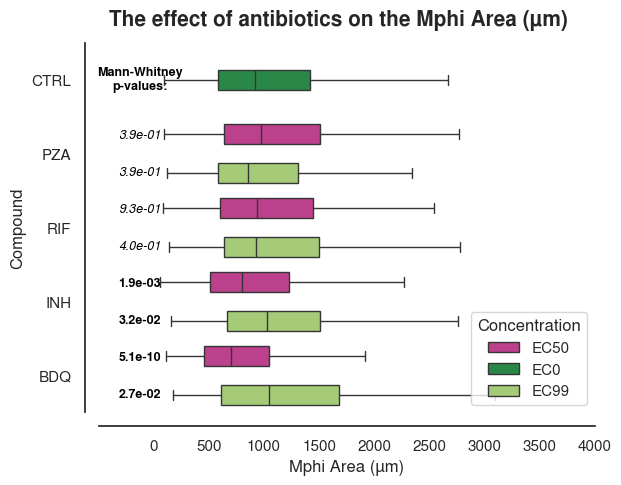

In [707]:
var = 'Mphi Area (µm)'
when = 'last'

# Subset your data and remove duplicates based on Unique_ID
subset_df = df[(df['r2'] > 0.7) & (df['r2'] < 1) & (df['Strain/Compound'] != 'RD1')].drop_duplicates(subset=['ID'], keep = when)

# Ensure 'dt' is numeric and drop rows with NaNs in 'dt'
subset_df[var] = pd.to_numeric(subset_df[var], errors='coerce')
subset_df = subset_df.dropna(subset=[var])


# Perform the Mann-Whitney U test for each compound and concentration against the control
control_data = subset_df[subset_df['Compound'] == 'CTRL'][var]

# List to store p-values
p_values = []

for compound in subset_df['Compound'].unique():
    if compound != 'CTRL':
        for concentration in subset_df['Concentration'].unique():
            compound_data = subset_df[(subset_df['Compound'] == compound) & (subset_df['Concentration'] == concentration)][var]
            if not compound_data.empty:
                stat, p_value = mannwhitneyu(control_data, compound_data)
                p_values.append((compound, concentration, stat, p_value))
                print(f"Compound: {compound}, Concentration: {concentration}, U-statistic: {int(stat)}, p-value: {p_value:.3e}")

# Plot the data using the reciprocal of dt
g = sns.boxplot(x=var, y="Compound",
                hue="Concentration", 
                palette=[expanded_piyg[-1], expanded_piyg[0], expanded_piyg[1]],
                data=subset_df, 
                hue_order=hue_order, fliersize=0)  

# plt.xlabel("Doubling time of intracellular Mtb population (hours)")
plt.gcf().suptitle(f'The effect of antibiotics on the {var}', 
                   fontsize=15, fontweight='bold', 
                   y=0.95)
sns.despine(offset=10)
plt.legend(loc='lower right', frameon=True, title='Concentration')
xlim_min = -500
xlim_max = 4000
plt.xlim(xlim_min, xlim_max)

# Annotate p-values on the plot
for i, (compound, concentration, stat, p_value) in enumerate(p_values):   
    positions = subset_df[(subset_df['Compound'] == compound) & (subset_df['Concentration'] == concentration)]
    if not positions.empty:
        x = xlim_min # positions['dt'].quantile(0.75) + 1.5 * (positions['dt'].quantile(0.75) - positions['dt'].quantile(0.25))  # position of the end of the whisker
        y = list(subset_df['Compound'].unique()).index(compound)
        y_offset = hue_order.index(concentration) * 0.25 - 0.25  # Adjust this multiplier to better space annotations
        if p_value < 0.1:
            p_text = f'{p_value:.1e}'# Italicize p-values below 0.1
            plt.annotate(f'{p_text}', xy=(xlim_min/4, y + y_offset), xycoords='data',
                             horizontalalignment='center', verticalalignment='center',
                             fontsize=9, color='black', fontweight = 'bold')
        else:
            p_text = f'{p_value:.1e}'
            plt.annotate(f'{p_text}', xy=(xlim_min/4, y + y_offset), xycoords='data',
                         horizontalalignment='center', verticalalignment='center',
                         fontsize=9, color='black', style = 'italic')
# print the p value column title
plt.annotate(f'Mann-Whitney\np-values:', xy=(xlim_min/4, 0.13),
                         fontsize=9, color='black', fontweight = 'bold', horizontalalignment = 'center')
# plt.plot([-12, 4], [0.18, 0.18], color='black', lw=2)  # Draw a line under the title
plt.xticks(np.arange(-0, xlim_max+1, 500))  # Display x-axis labels from 0 to 70 with a step of 10

plt.savefig(os.path.join(output_dir, f'ATB_effect_{var}_{when}_boxplot_stats.png'), bbox_inches='tight', dpi=314)

# Display the plot
plt.show()

Compound: PZA, Concentration: EC50, U-statistic: 180353, p-value: 1.297e-14
Compound: PZA, Concentration: EC99, U-statistic: 184210, p-value: 1.637e-34
Compound: RIF, Concentration: EC50, U-statistic: 171895, p-value: 1.583e-16
Compound: RIF, Concentration: EC99, U-statistic: 161847, p-value: 1.026e-47
Compound: INH, Concentration: EC50, U-statistic: 185054, p-value: 2.212e-10
Compound: INH, Concentration: EC99, U-statistic: 182807, p-value: 1.278e-22
Compound: BDQ, Concentration: EC50, U-statistic: 183633, p-value: 2.063e-10
Compound: BDQ, Concentration: EC99, U-statistic: 142031, p-value: 1.971e-45


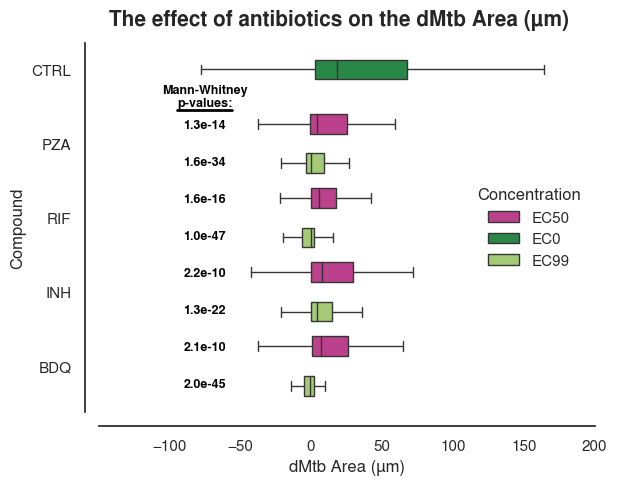

In [590]:

var = 'dMtb Area (µm)'
when = 'last'

# Subset your data and remove duplicates based on Unique_ID
subset_df = df[(df['r2'] > 0.7) & (df['r2'] < 1) & (df['Strain/Compound'] != 'RD1')].drop_duplicates(subset=['ID'], keep = when)

# Ensure 'dt' is numeric and drop rows with NaNs in 'dt'
subset_df[var] = pd.to_numeric(subset_df[var], errors='coerce')
subset_df = subset_df.dropna(subset=[var])


# Perform the Mann-Whitney U test for each compound and concentration against the control
control_data = subset_df[subset_df['Compound'] == 'CTRL'][var]

# List to store p-values
p_values = []

for compound in subset_df['Compound'].unique():
    if compound != 'CTRL':
        for concentration in subset_df['Concentration'].unique():
            compound_data = subset_df[(subset_df['Compound'] == compound) & (subset_df['Concentration'] == concentration)][var]
            if not compound_data.empty:
                stat, p_value = mannwhitneyu(control_data, compound_data)
                p_values.append((compound, concentration, stat, p_value))
                print(f"Compound: {compound}, Concentration: {concentration}, U-statistic: {int(stat)}, p-value: {p_value:.3e}")

# Plot the data using the reciprocal of dt
g = sns.boxplot(x=var, y="Compound",
                hue="Concentration", 
                palette=[expanded_piyg[-1], expanded_piyg[0], expanded_piyg[1]],
                data=subset_df, 
                hue_order=hue_order, fliersize=0)  

# plt.xlabel("Doubling time of intracellular Mtb population (hours)")
plt.gcf().suptitle(f'The effect of antibiotics on the {var}', 
                   fontsize=15, fontweight='bold', 
                   y=0.95)
sns.despine(offset=10)
plt.legend(loc='center right', frameon=False, title='Concentration')
xlim_min = -150
xlim_max = 200
plt.xlim(xlim_min, xlim_max)

# Annotate p-values on the plot
for i, (compound, concentration, stat, p_value) in enumerate(p_values):   
    positions = subset_df[(subset_df['Compound'] == compound) & (subset_df['Concentration'] == concentration)]
    if not positions.empty:
        x = xlim_min # positions['dt'].quantile(0.75) + 1.5 * (positions['dt'].quantile(0.75) - positions['dt'].quantile(0.25))  # position of the end of the whisker
        y = list(subset_df['Compound'].unique()).index(compound)
        y_offset = hue_order.index(concentration) * 0.25 - 0.25  # Adjust this multiplier to better space annotations
        if p_value < 0.1:
            p_text = f'{p_value:.1e}'# Italicize p-values below 0.1
            plt.annotate(f'{p_text}', xy=(x+abs(xlim_min/2), y + y_offset), xycoords='data',
                             horizontalalignment='center', verticalalignment='center',
                             fontsize=9, color='black', fontweight = 'bold')
        else:
            p_text = f'{p_value:.1e}'
            plt.annotate(f'{p_text}', xy=(x+abs(xlim_min/2), y + y_offset), xycoords='data',
                         horizontalalignment='center', verticalalignment='center',
                         fontsize=9, color='black', style = 'italic')
# print the p value column title
plt.annotate(f'Mann-Whitney\np-values:', xy=(xlim_min/2, 0.5),
                         fontsize=9, color='black', fontweight = 'bold', horizontalalignment = 'center')
plt.plot([xlim_min+abs(xlim_min/2.7), -abs(xlim_min/2.7)], [0.55, 0.55], color='black', lw=2)  # Draw a line under the title
plt.xticks(np.arange(-100, xlim_max+1, 50))  # Display x-axis labels from 0 to 70 with a step of 10

plt.savefig(os.path.join(output_dir, f'ATB_effect_{var}_boxplot_stats.png'), bbox_inches='tight', dpi=314)

# Display the plot
plt.show()

# ARX

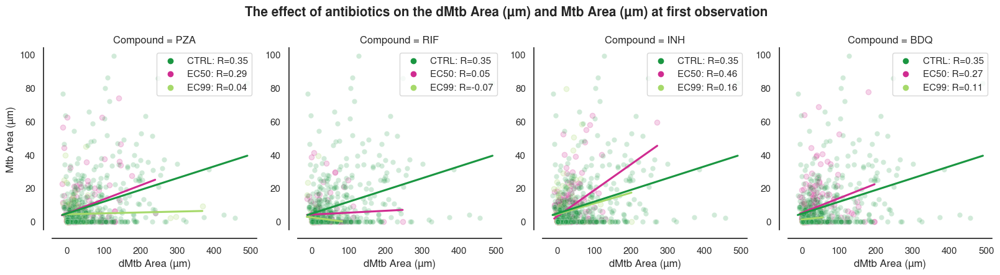

<Figure size 640x480 with 0 Axes>

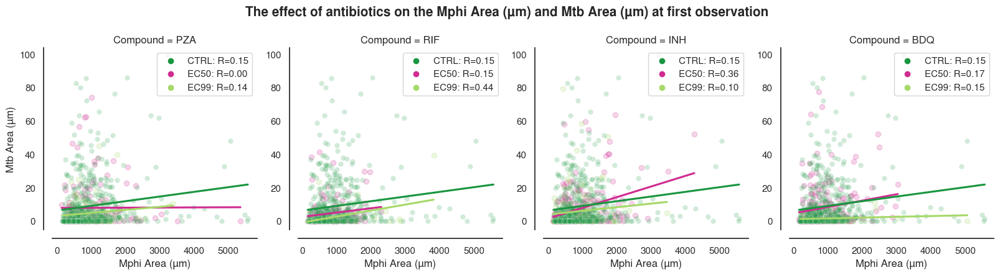

<Figure size 640x480 with 0 Axes>

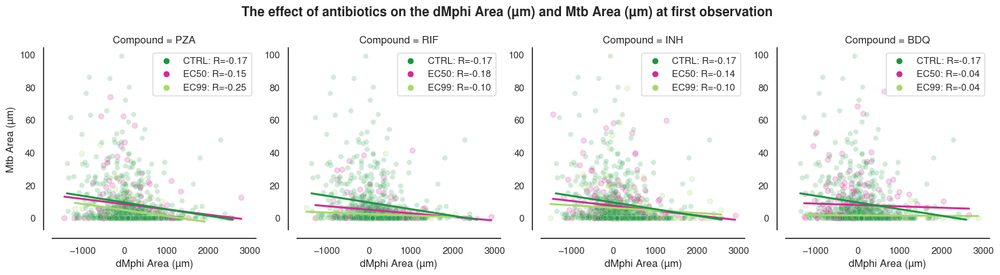

<Figure size 640x480 with 0 Axes>

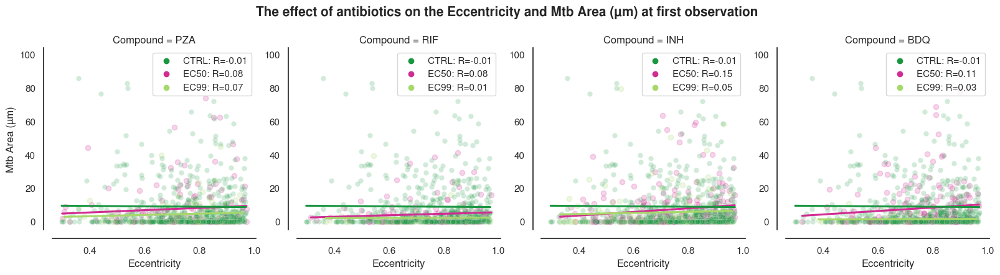

<Figure size 640x480 with 0 Axes>

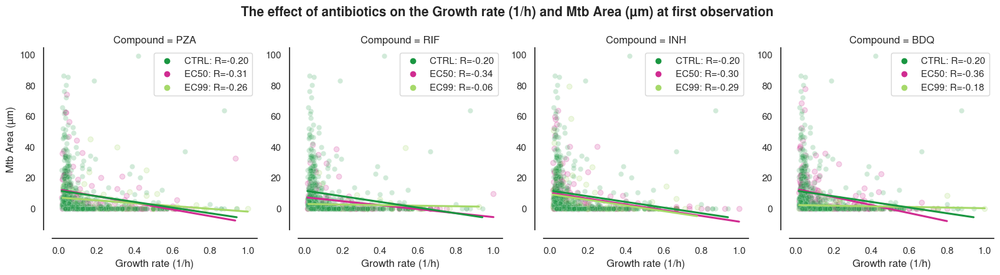

<Figure size 640x480 with 0 Axes>

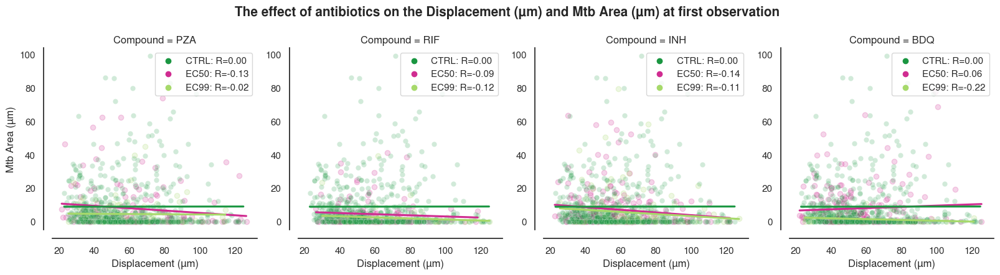

<Figure size 640x480 with 0 Axes>

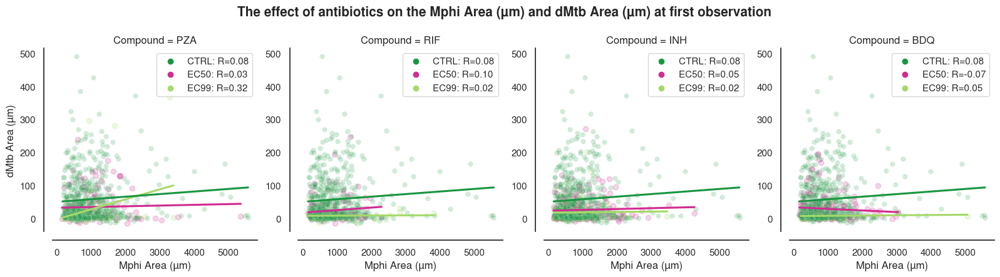

<Figure size 640x480 with 0 Axes>

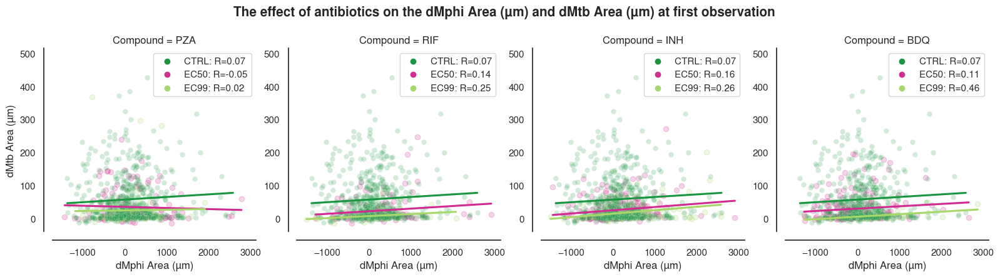

<Figure size 640x480 with 0 Axes>

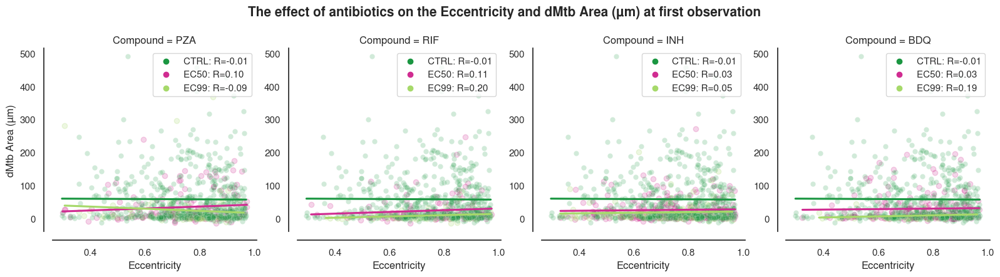

<Figure size 640x480 with 0 Axes>

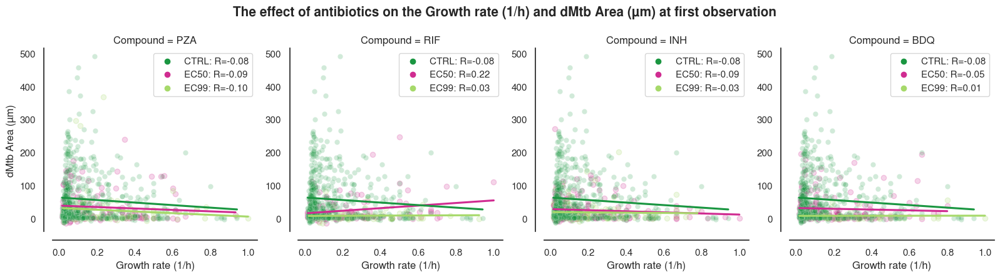

<Figure size 640x480 with 0 Axes>

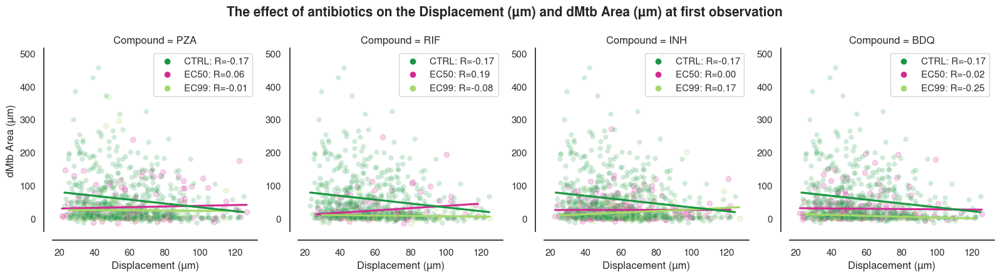

<Figure size 640x480 with 0 Axes>

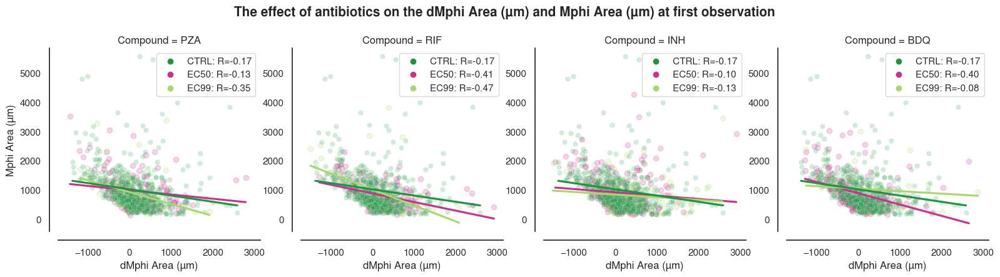

<Figure size 640x480 with 0 Axes>

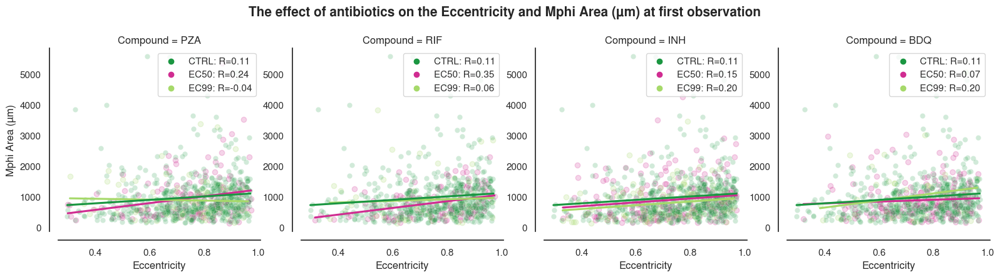

<Figure size 640x480 with 0 Axes>

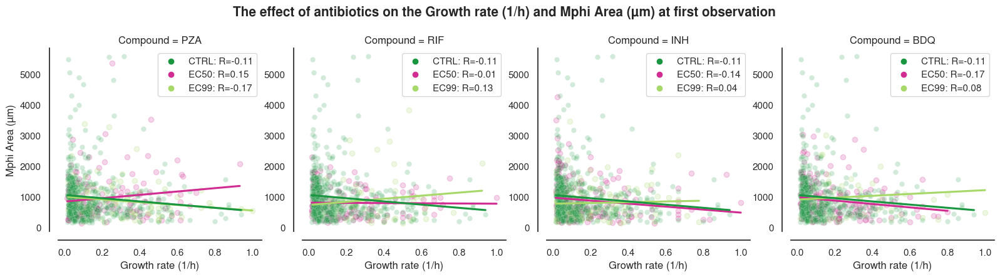

<Figure size 640x480 with 0 Axes>

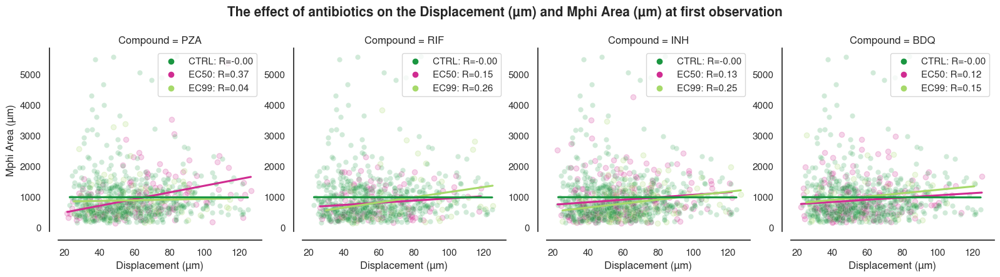

<Figure size 640x480 with 0 Axes>

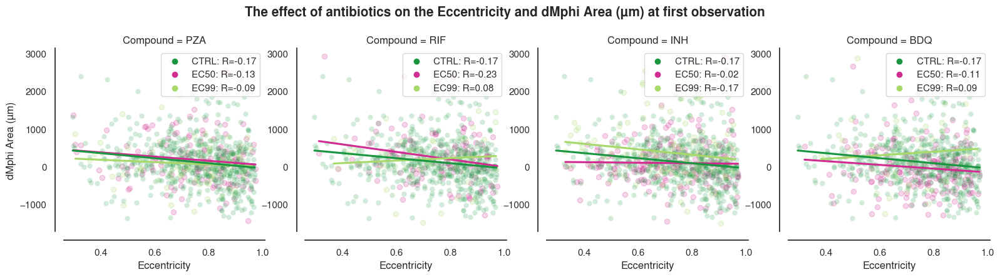

<Figure size 640x480 with 0 Axes>

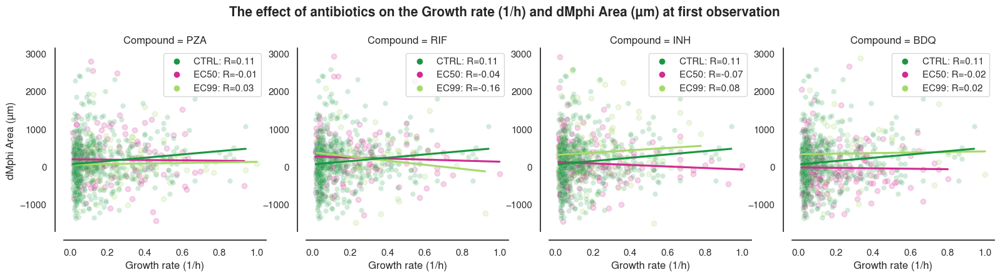

<Figure size 640x480 with 0 Axes>

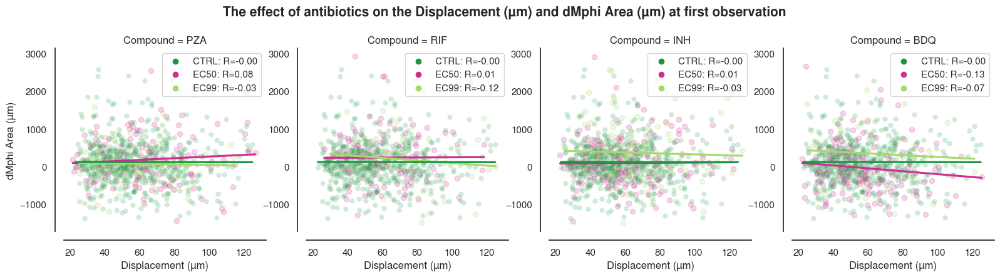

<Figure size 640x480 with 0 Axes>

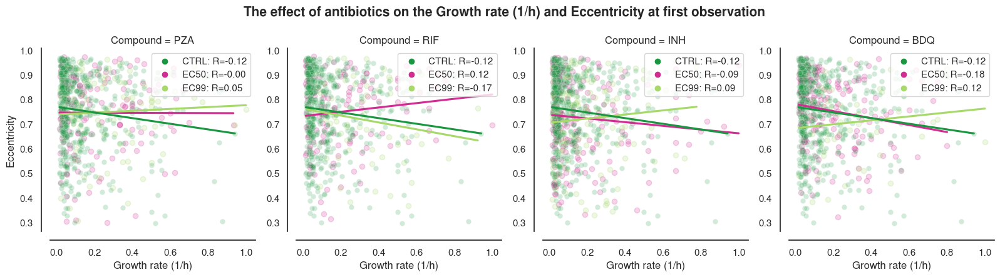

<Figure size 640x480 with 0 Axes>

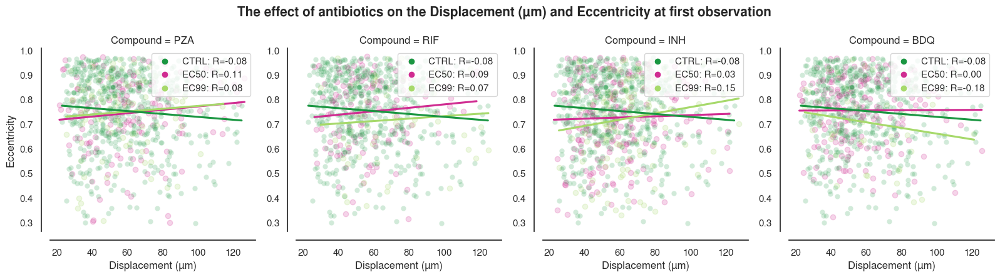

<Figure size 640x480 with 0 Axes>

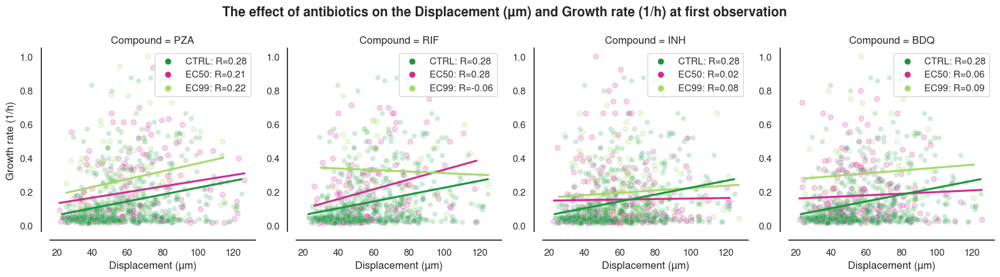

<Figure size 640x480 with 0 Axes>

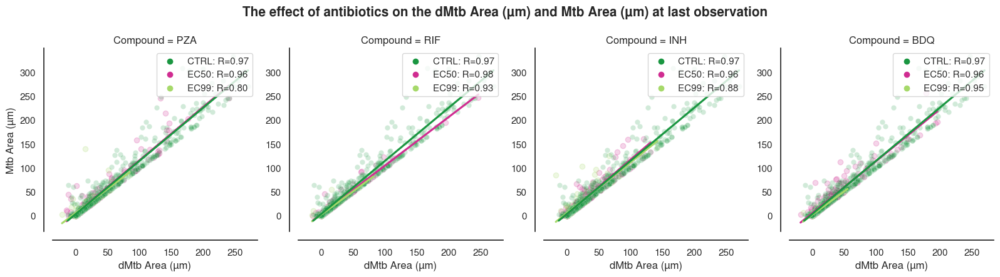

<Figure size 640x480 with 0 Axes>

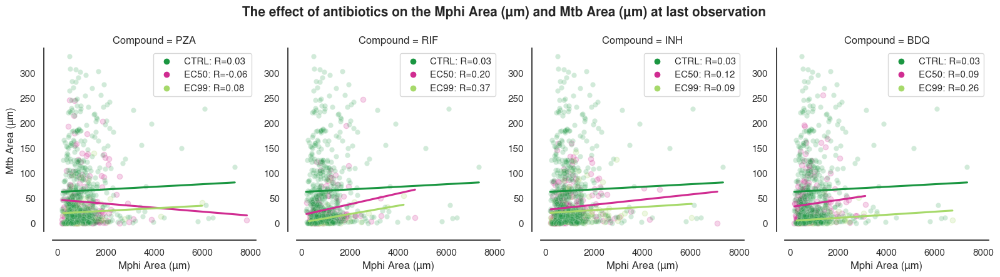

<Figure size 640x480 with 0 Axes>

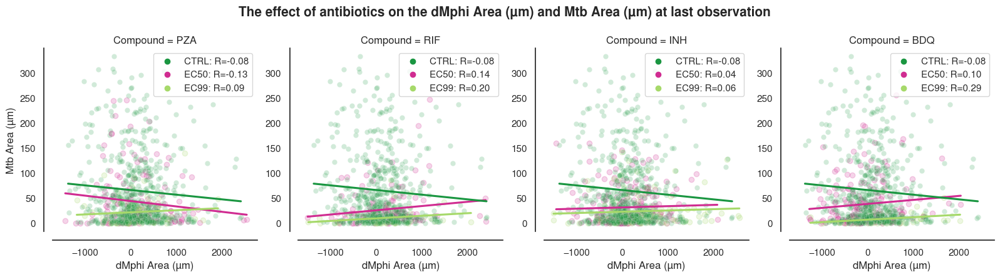

<Figure size 640x480 with 0 Axes>

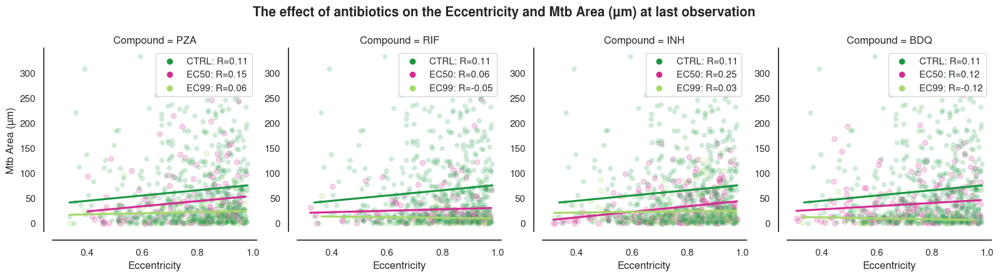

<Figure size 640x480 with 0 Axes>

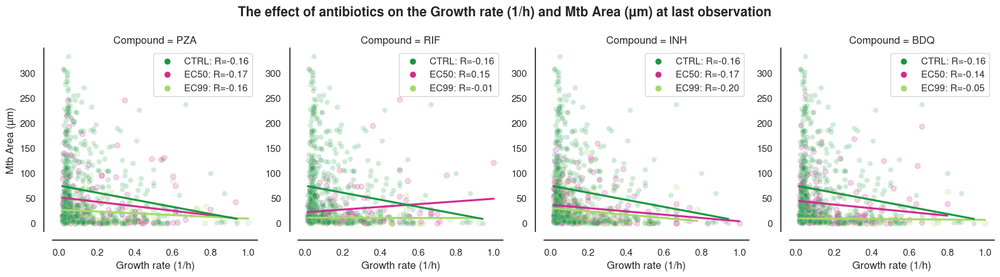

<Figure size 640x480 with 0 Axes>

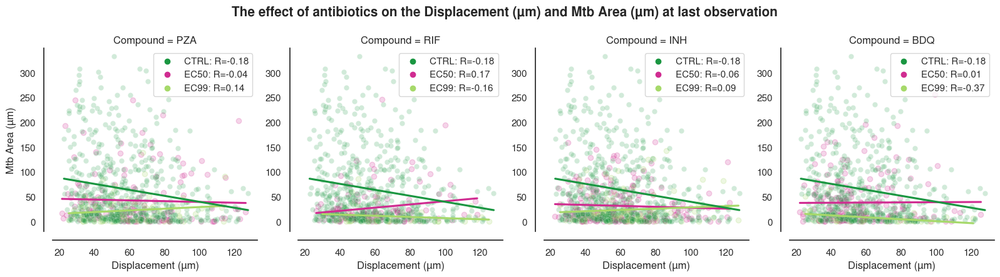

<Figure size 640x480 with 0 Axes>

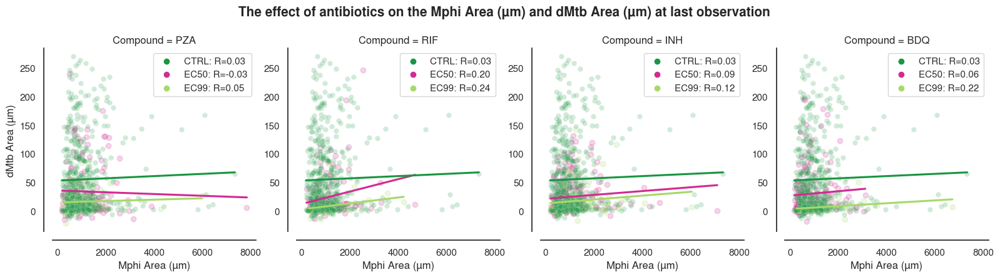

<Figure size 640x480 with 0 Axes>

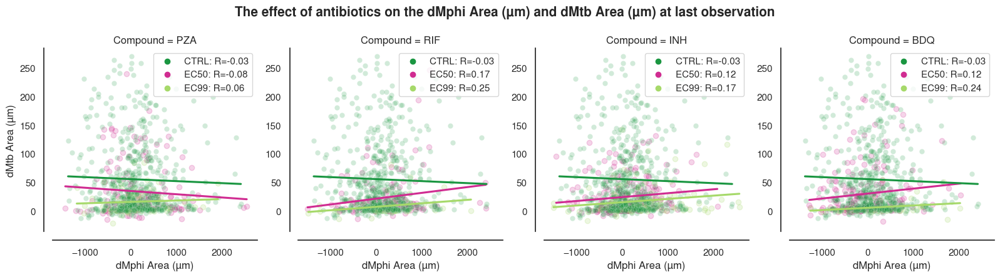

<Figure size 640x480 with 0 Axes>

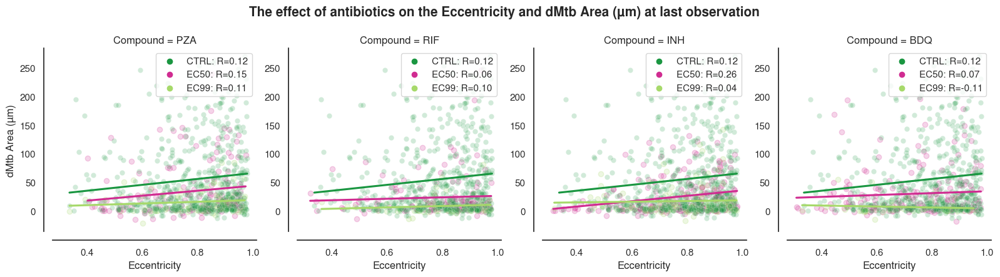

<Figure size 640x480 with 0 Axes>

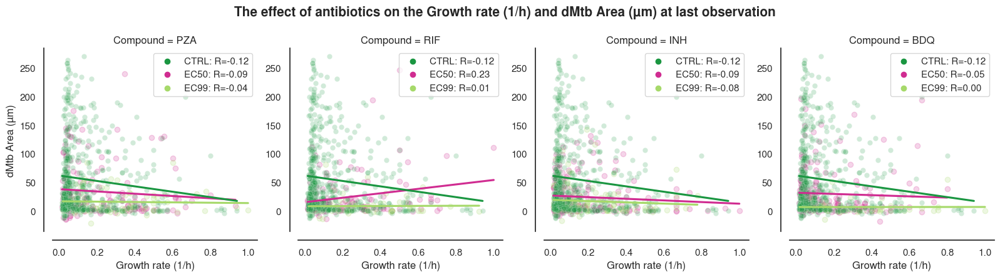

<Figure size 640x480 with 0 Axes>

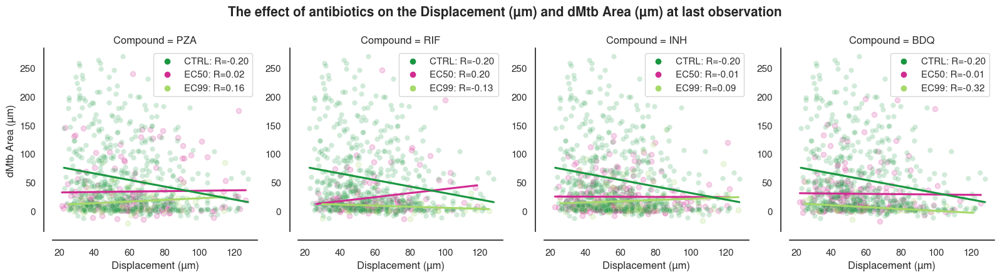

<Figure size 640x480 with 0 Axes>

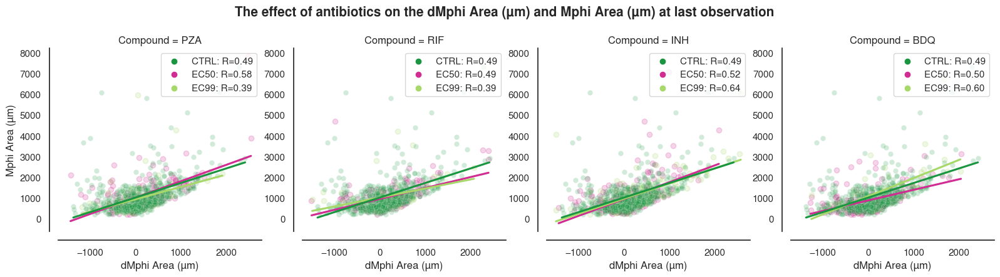

<Figure size 640x480 with 0 Axes>

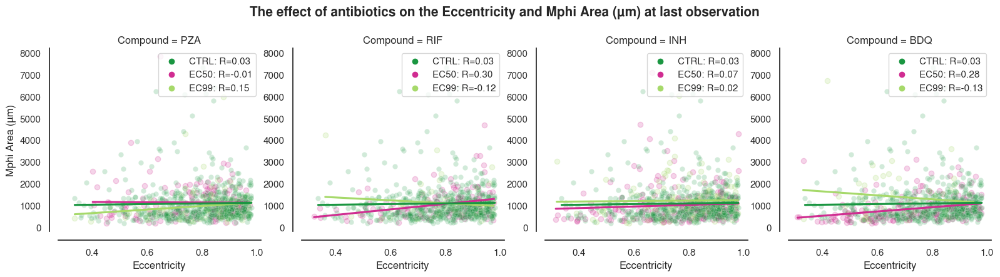

<Figure size 640x480 with 0 Axes>

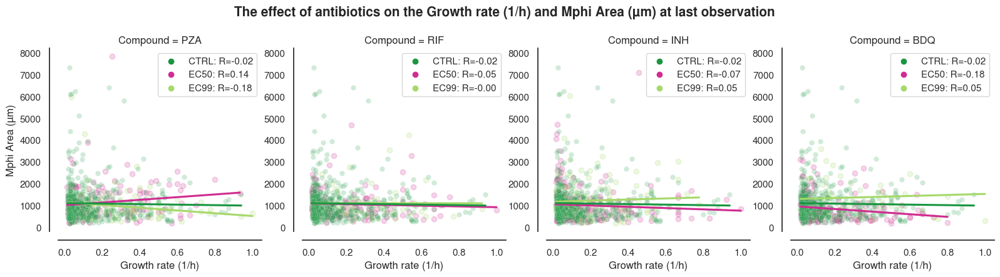

<Figure size 640x480 with 0 Axes>

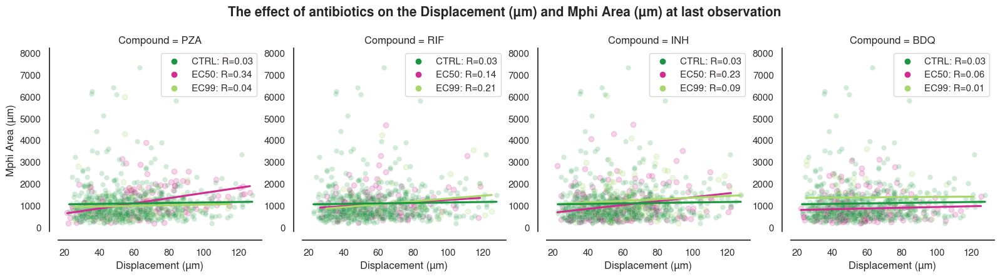

<Figure size 640x480 with 0 Axes>

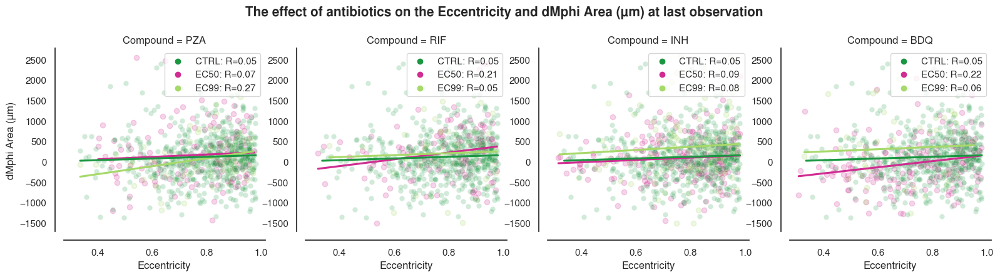

<Figure size 640x480 with 0 Axes>

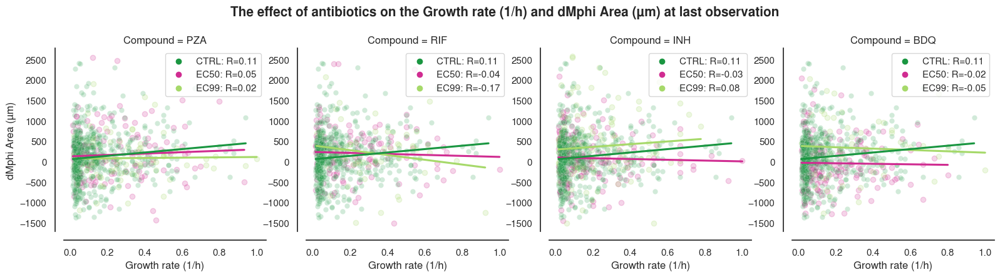

<Figure size 640x480 with 0 Axes>

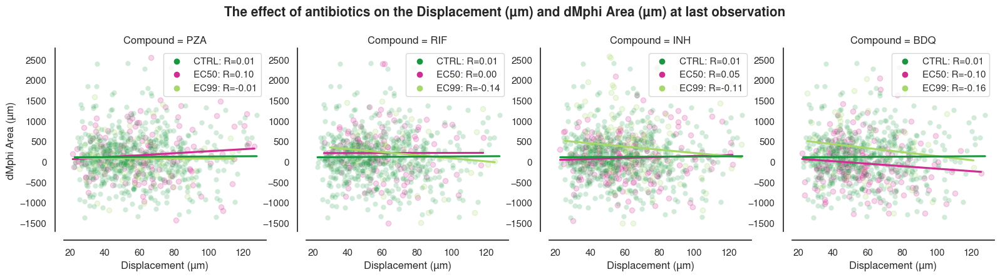

<Figure size 640x480 with 0 Axes>

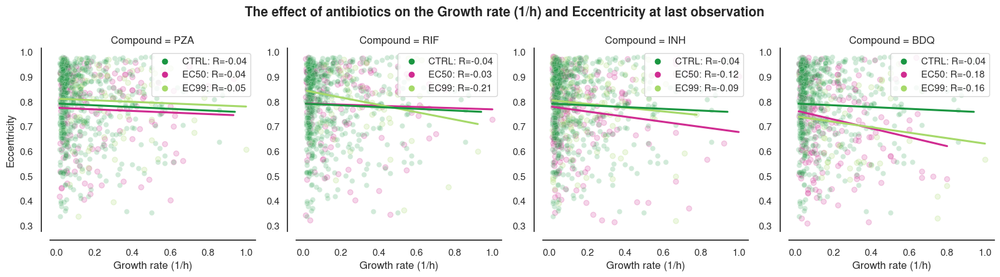

<Figure size 640x480 with 0 Axes>

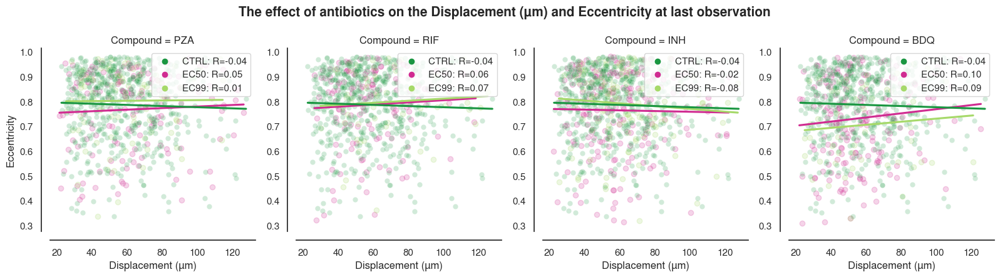

<Figure size 640x480 with 0 Axes>

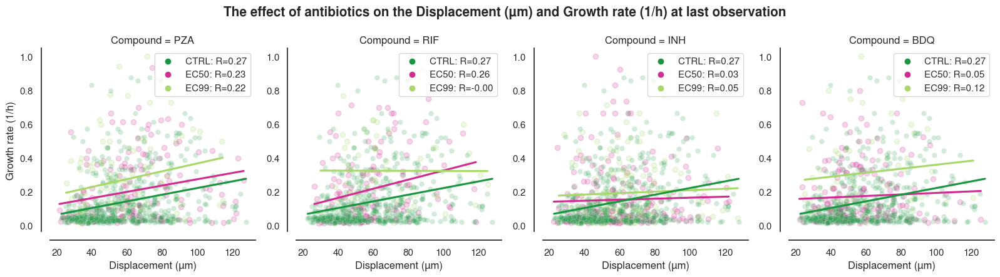

<Figure size 640x480 with 0 Axes>

In [612]:
for when in whens:

    # Subset your data and remove duplicates based on Unique_ID
    subset_df = df[(df['r2'] > 0.7) & (df['r2'] < 1) & (df['dt'] > 0) & (df['Strain/Compound'] != 'RD1')].drop_duplicates(subset=['ID'], keep=when)
    
    # Convert all relevant columns to numeric, coercing errors to NaN
    for col in variables:
        subset_df[col] = pd.to_numeric(subset_df[col], errors='coerce')
    
    # Drop rows with NaNs in the relevant columns
    subset_df = subset_df.dropna(subset=variables)
    
    # Calculate the IQR for each variable and filter the data
    for col in variables:
        Q1 = subset_df[col].quantile(0.01)
        Q3 = subset_df[col].quantile(0.99)
        IQR = Q3 - Q1
        subset_df = subset_df[(subset_df[col] >= Q1) & (subset_df[col] <= Q3)]
    
    iqr_filtered_df = subset_df

    # Separate control data
    control_data = iqr_filtered_df[iqr_filtered_df['Compound'] == 'CTRL']
    iqr_filtered_df = iqr_filtered_df[iqr_filtered_df['Compound'] != 'CTRL']  # Exclude control data from the main data
    
    # Loop through all combinations of y_var and x_var
    plotted_pairs = set()
    for y_var in variables:
        for x_var in variables:
            if x_var != y_var and (y_var, x_var) not in plotted_pairs and (x_var, y_var) not in plotted_pairs:
                if 'Growth rate (1/h)' in [x_var, y_var]:
                    x_var, y_var = ('Growth rate (1/h)', y_var) if x_var == 'Growth rate (1/h)' else (x_var, 'Growth rate (1/h)')
                
                plotted_pairs.add((x_var, y_var))
                
                # Create the FacetGrid without the control data
                g = sns.FacetGrid(iqr_filtered_df, 
                                  col="Compound", 
                                  hue="Concentration", 
                                  palette=[expanded_piyg[-1], expanded_piyg[0], expanded_piyg[1]], 
                                  hue_order=hue_order, 
                                  aspect=1, height=4, col_wrap=4)
    
                # Map the scatterplot for each compound with a line of best fit
                g.map_dataframe(sns.regplot, x=x_var, y=y_var, ci=None, scatter_kws={'alpha':0.2})
    
                # Add the control data to each subplot and include line of best fit and R score for control
                for ax in g.axes.flat:
                    sns.scatterplot(x=x_var, y=y_var, data=control_data, color=expanded_piyg[0], ax=ax, label='CTRL', alpha=0.2)
                    sns.regplot(x=x_var, y=y_var, data=control_data, ax=ax, scatter=False, color=expanded_piyg[0], ci=None)
    
                x_ctrl = control_data[x_var]
                y_ctrl = control_data[y_var]
                corr_ctrl, _ = pearsonr(x_ctrl, y_ctrl)
    
                # Calculate and annotate correlation coefficients on each subplot
                for ax in g.axes.flat:
                    compound = ax.get_title().replace('Compound = ', '')
                    annotations = []
                    handles, labels = [], []
                    # Add the handle and label for the control data first
                    handles.append(ax.scatter([], [], label='CTRL', color=expanded_piyg[0]))
                    labels.append(f'CTRL: R={corr_ctrl:.2f}')
                    for concentration in hue_order:
                        positions = iqr_filtered_df[(iqr_filtered_df['Compound'] == compound) & (iqr_filtered_df['Concentration'] == concentration)]
                        if not positions.empty:
                            x = positions[x_var]
                            y = positions[y_var]
                            corr, _ = pearsonr(x, y)
                            corr_text = f'{concentration}: R={corr:.2f}'
                            annotations.append(corr_text)
                            # Add the handle and label for the legend
                            color_index = hue_order.index(concentration)
                            handle = ax.scatter([], [], label=corr_text, color=[expanded_piyg[-1], expanded_piyg[2], expanded_piyg[1]][color_index])
                            handles.append(handle)
                            labels.append(corr_text)
    
                    # Create a custom legend for each subplot including the control
                    ax.legend(handles=handles, labels=labels, frameon=True, loc='upper right')
    
                # Add axis labels and title
                g.set_axis_labels(x_var, y_var)
                g.fig.subplots_adjust(top=0.9, wspace=0.2)  # Adjust wspace to add lateral padding
                
                for ax in g.axes.flat:
                    sns.despine(ax=ax, offset = 10)                
                
                g.fig.suptitle(f'The effect of antibiotics on the {x_var} and {y_var} at {when} observation', fontsize=15, fontweight='bold', y=1.07)
    
                # Format the filename to replace special characters
                x_var_filename = x_var.replace(' ', '_').replace('(', '').replace(')', '').replace('µ', 'u')
                y_var_filename = y_var.replace(' ', '_').replace('(', '').replace(')', '').replace('µ', 'u')
                if '1/h' in y_var_filename:
                    y_var_filename = y_var_filename.replace('1/h','1-h')
                if '1/h' in x_var_filename:
                    x_var_filename = x_var_filename.replace('1/h','1-h')
                    
                plt.savefig(os.path.join(output_dir, f'ATB_effect_IQR_{x_var_filename}_vs_{y_var_filename}_t{when}.png'), bbox_inches='tight', dpi=314)
                plt.show()
                plt.clf()

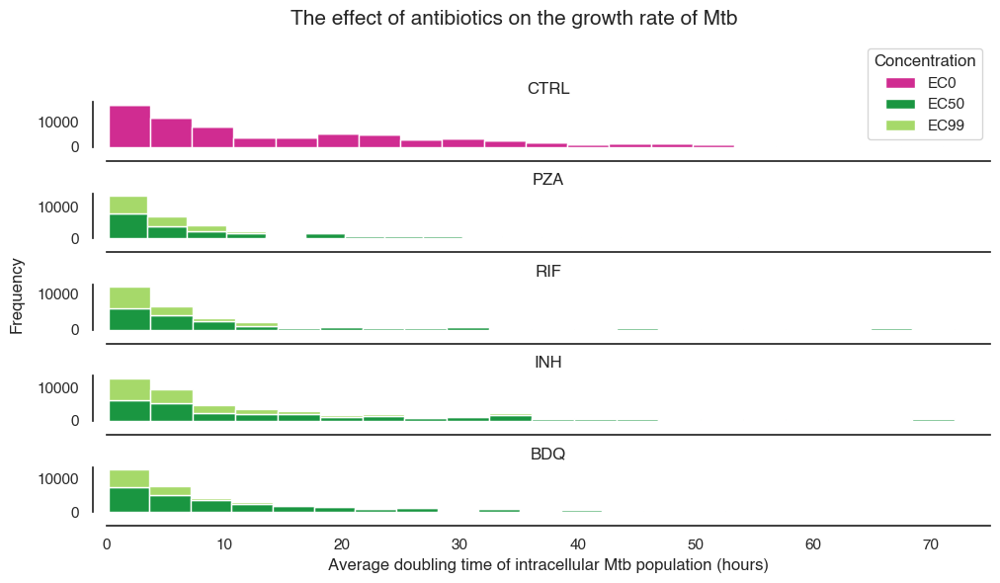

In [80]:
import matplotlib.pyplot as plt
import seaborn as sns
import os

# Your existing DataFrame after filtering
subset_df = df[(df['r2'] > 0.5) & (df['dt'] > 0) & (df['Strain/Compound'] != 'RD1')]

# Define the palette
palette = [expanded_piyg[-1], expanded_piyg[0], expanded_piyg[1]]  # Make sure these colors are defined

# Unique compounds and concentrations
compounds = subset_df['Compound'].unique()
concentrations = subset_df['Concentration'].unique()

# Set up the plot
fig, axes = plt.subplots(len(compounds), 1, figsize=(10, 6), sharex=True)  # Use fig, axes for subplot management
if len(compounds) == 1:  # Handle case where there's only one compound
    axes = [axes]

for i, (ax, compound) in enumerate(zip(axes, compounds)):
    data = [subset_df[(subset_df['Compound'] == compound) & (subset_df['Concentration'] == conc)]['dt'].dropna() for conc in concentrations]
    ax.hist(data, bins=20, stacked=True, label=concentrations, color=palette)
    ax.set_title(compound)
    if i == 0:
        ax.legend(title='Concentration')
    if i < len(compounds) - 1:
        ax.set_xticklabels([])  # Hide x ticks for all but the last subplot
    else:
        ax.set_xticks(np.arange(0, 80, 10))  # Set specific x-ticks for the last plot if necessary
        ax.set_xticklabels(np.arange(0, 80, 10))  # Ensure labels are visible

fig.text(-0.01, 0.5, 'Frequency', va='center', rotation='vertical', fontsize=12)  # Add a common y-axis label
plt.xlabel("Average doubling time of intracellular Mtb population (hours)")
plt.suptitle('The effect of antibiotics on the growth rate of Mtb', fontsize=15, fontweight='bold')
sns.despine(offset=10)
fig.tight_layout(rect=[0, 0, 1, 0.95])  # Adjust layout to make room for suptitle
plt.xlim(0, 75)  # Set the limits for the x-axis if necessary
plt.savefig(os.path.join(output_dir, 'ATB_effect_hist_dt_gt0.png'), bbox_inches='tight', dpi=314)
plt.show()

In [8]:
# df['dMtb'] = df['delta Mtb max fold-change normalised max area']
df['Mtb'] = df['Mtb Area'] #df['Intracellular thresholded Mtb content smooth']

In [23]:
unique_ID = '85.4.5'
sc_df = df.loc[unique_ID]
sc_df

,Time (hours),Mtb Area,dMtb,Strain,Compound,Concentration,Unique ID,Acquisition ID,Cell ID,Mphi Area,...,Strain/Compound,dMtb/dt,%dMtb/dt,%dMtb,Mean Mtb Intensity,Thresholded Mean Mtb Intensity,Infection Status,Initial Infection Status,Final Infection Status,Rolling Avg dMtb/dt
281595,0,2675.0,5384.0,WT,CTRL,EC0,85.4.5,"(4, 5)",85,46764.0,...,CTRL,0.0,0.000000,201.271028,443.901398,127.701759,True,True,True,0.104293
281596,1,2376.0,5384.0,WT,CTRL,EC0,85.4.5,"(4, 5)",85,62884.0,...,CTRL,-299.0,-11.177570,201.271028,402.362885,75.280693,True,True,True,-20.000379
281597,2,2276.0,5384.0,WT,CTRL,EC0,85.4.5,"(4, 5)",85,67435.0,...,CTRL,-100.0,-4.208754,201.271028,390.603058,62.043819,True,True,True,-26.695353
281598,3,2608.0,5384.0,WT,CTRL,EC0,85.4.5,"(4, 5)",85,48134.0,...,CTRL,332.0,14.586995,201.271028,428.111389,112.511589,True,True,True,-4.615656
281599,4,2398.0,5384.0,WT,CTRL,EC0,85.4.5,"(4, 5)",85,60039.0,...,CTRL,-210.0,-8.052147,201.271028,403.103180,79.544876,True,True,True,-18.585858
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
281665,70,9059.0,5384.0,WT,CTRL,EC0,85.4.5,"(4, 5)",85,14227.0,...,CTRL,155.0,1.740791,201.271028,2083.896240,1993.407959,True,True,True,68.266667
281666,71,8928.0,5384.0,WT,CTRL,EC0,85.4.5,"(4, 5)",85,13664.0,...,CTRL,-131.0,-1.446076,201.271028,2144.229248,2056.757812,True,True,True,49.000000
281667,72,8303.0,5384.0,WT,CTRL,EC0,85.4.5,"(4, 5)",85,12339.0,...,CTRL,-625.0,-7.000448,201.271028,2249.445312,2164.719971,True,True,True,4.333333
281668,73,6219.0,5384.0,WT,CTRL,EC0,85.4.5,"(4, 5)",85,9494.0,...,CTRL,-2084.0,-25.099362,201.271028,2205.718750,2113.622314,True,True,True,-149.933333


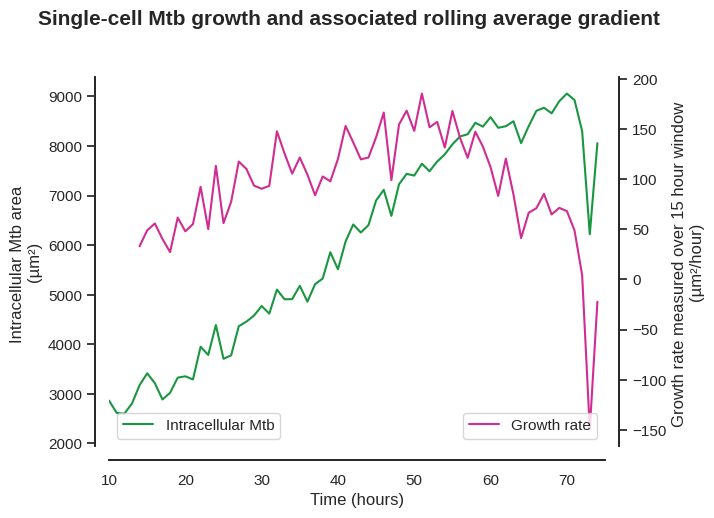

In [27]:

# Calculate the rolling average of 'dMtb/dt' over a specified window (e.g., 15)
window_size = 15
sc_df['Rolling Avg dMtb/dt'] = sc_df['dMtb/dt'].rolling(window=window_size).mean()

# Create the first plot
ax1 = sns.lineplot(x='Time (hours)', y='Mtb Area', data=sc_df, color=expanded_piyg[0], label='Intracellular Mtb')
plt.legend(loc='lower left')
ax1.set_ylabel('Intracellular Mtb area \n(µm\u00b2)')

# Create a second y-axis
ax2 = ax1.twinx()

# Plot the rolling average on the second y-axis
sns.lineplot(x='Time (hours)', y='Rolling Avg dMtb/dt', data=sc_df, ax=ax2, color=expanded_piyg[-1], label='Growth rate')  # Adjust color as needed

# Set the y-axis label for the second y-axis
ax2.set_ylabel(f'Growth rate measured over {window_size} hour window \n(µm\u00b2/hour)')
plt.legend(loc='lower right')

# Adjust plot appearance
sns.despine(offset=10, top=True, right=False)
plt.xlim(10, 75)  # Adjust as per your data

# Set the x-axis label and title for the plot
ax1.set_xlabel('Time (hours)')
plt.gcf().suptitle('Single-cell Mtb growth and associated rolling average gradient', 
                   fontsize=15, fontweight='bold', y=1.02)

plt.show()

### Is this max gradient correlated to antibiotic condition?

In [67]:
unique_ids = df['Unique ID'].unique()
len(unique_ids)

3988

In [73]:
unique_ids = df['Unique ID'].unique()
rolling_means = pd.Series(index=df.index)  # Initialize a Series to store the rolling means
max_rolling_means = {}
window_size = 15  # Define your window size

for cell_id in tqdm(unique_ids, total = len(unique_ids)):
    # Filter the DataFrame for the current cell ID
    cell_data = df[df['Unique ID'] == cell_id]

    # Calculate the rolling mean for this cell
    rolling_mean = cell_data['dMtb/dt'].rolling(window=window_size).mean()

    # Store the results in the rolling_means Series
    rolling_means[cell_data.index] = rolling_mean

    # Store the maximum rolling mean for this cell ID
    max_rolling_means[cell_id] = rolling_mean.max()

# Assign the rolling means back to the DataFrame
df[f'dMtb/dt,T={window_size}'] = rolling_means

# Create a new column for the maximum rolling mean per unique ID
df['Max Rolling Mean'] = df['Unique ID'].map(max_rolling_means)

  0%|          | 0/3988 [00:00<?, ?it/s]

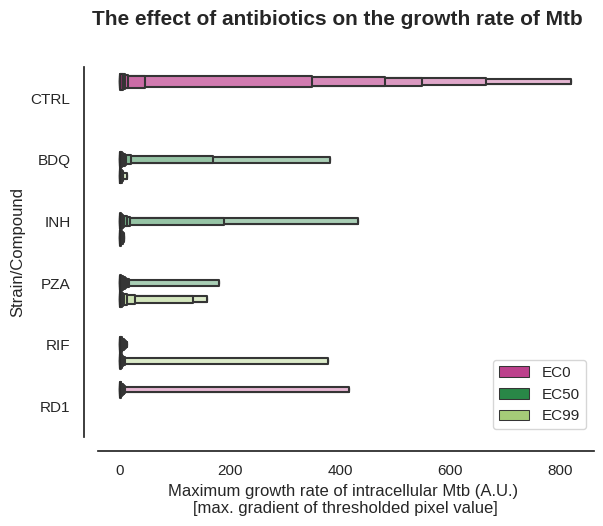

In [79]:
df
g = sns.boxenplot(x="Max. dMtb/dt", y="Strain/Compound",
            hue="Concentration", 
            palette=[expanded_piyg[-1], expanded_piyg[0], expanded_piyg[1]],
            data=df, 
            scale = 'linear'
              )  
sns.despine(offset = 10)
plt.xlabel("Maximum growth rate of intracellular Mtb (A.U.) \n[max. gradient of thresholded pixel value]")
plt.gcf().suptitle('The effect of antibiotics on the growth rate of Mtb', 
                   fontsize=15, fontweight='bold', 
                  y = 1.0)
sns.despine(offset=10)
plt.legend(loc = 'lower right')
# plt.savefig(os.path.join(output_dir, 'ATB_effect_max_growth_rate.png'), bbox_inches = 'tight', dpi = 314)

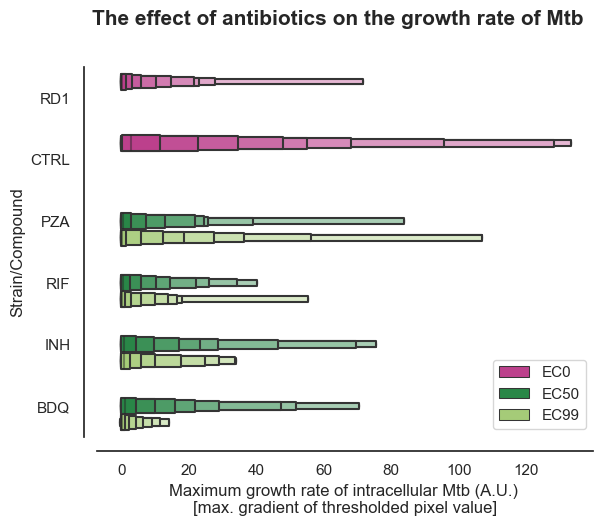

In [163]:
g = sns.boxenplot(x="Max. dMtb gradient", y="Strain/Compound",
            hue="Concentration", 
            palette=[expanded_piyg[-1], expanded_piyg[0], expanded_piyg[1]],
            data=df, 
            scale = 'linear'
              )  
sns.despine(offset = 10)
plt.xlabel("Maximum growth rate of intracellular Mtb (A.U.) \n[max. gradient of thresholded pixel value]")
plt.gcf().suptitle('The effect of antibiotics on the growth rate of Mtb', 
                   fontsize=15, fontweight='bold', 
                  y = 1.0)
sns.despine(offset=10)
plt.legend(loc = 'lower right')
plt.savefig(os.path.join(output_dir, 'ATB_effect_max_growth_rate.png'), bbox_inches = 'tight', dpi = 314)

In [92]:
help(sns.boxenplot)

Help on function boxenplot in module seaborn.categorical:

boxenplot(data=None, *, x=None, y=None, hue=None, order=None, hue_order=None, orient=None, color=None, palette=None, saturation=0.75, width=0.8, dodge=True, k_depth='tukey', linewidth=None, scale='exponential', outlier_prop=0.007, trust_alpha=0.05, showfliers=True, ax=None, box_kws=None, flier_kws=None, line_kws=None)
    Draw an enhanced box plot for larger datasets.
    
    This style of plot was originally named a "letter value" plot because it
    shows a large number of quantiles that are defined as "letter values".  It
    is similar to a box plot in plotting a nonparametric representation of a
    distribution in which all features correspond to actual observations. By
    plotting more quantiles, it provides more information about the shape of
    the distribution, particularly in the tails. For a more extensive
    explanation, you can read the paper that introduced the plot:
    https://vita.had.co.nz/papers/letter-v

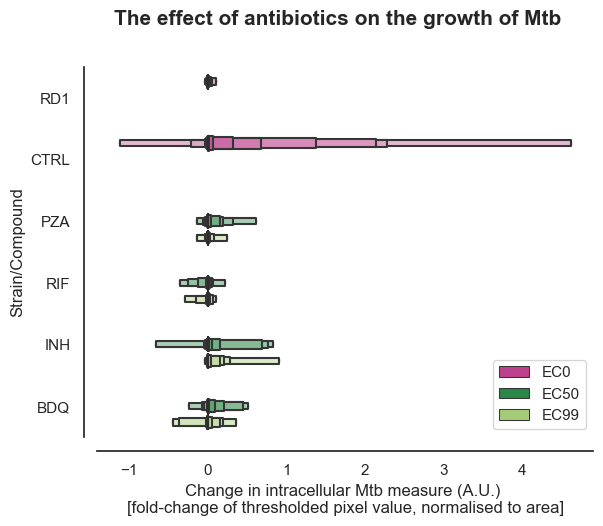

In [164]:
sns.boxenplot(x="dMtb", y="Strain/Compound",
            hue="Concentration", 
            palette=[expanded_piyg[-1], expanded_piyg[0], expanded_piyg[1]],
            data=df, 
            scale='linear'
              )  
sns.despine(offset = 10)
# plt.xlim(0,5)
plt.xlabel("Change in intracellular Mtb measure (A.U.) \n[fold-change of thresholded pixel value, normalised to area]")
plt.gcf().suptitle('The effect of antibiotics on the growth of Mtb', 
                   fontsize=15, fontweight='bold', 
                  y = 1.0)
sns.despine(offset=10)
plt.legend(loc = 'lower right')
plt.savefig(os.path.join(output_dir, 'dMtb_boxenplot.png'), bbox_inches = 'tight', dpi = 314)

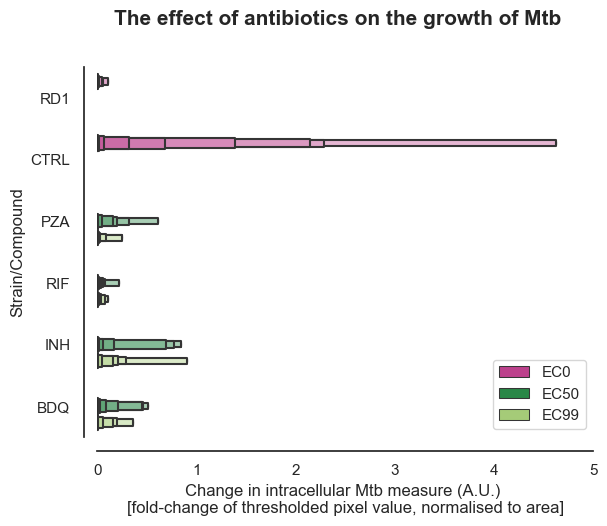

In [165]:
sns.boxenplot(x="dMtb", y="Strain/Compound",
            hue="Concentration", 
            palette=[expanded_piyg[-1], expanded_piyg[0], expanded_piyg[1]],
            data=df, 
            scale='linear'
              )  
sns.despine(offset = 10)
plt.xlim(0,5)
plt.xlabel("Change in intracellular Mtb measure (A.U.) \n[fold-change of thresholded pixel value, normalised to area]")
plt.gcf().suptitle('The effect of antibiotics on the growth of Mtb', 
                   fontsize=15, fontweight='bold', 
                  y = 1.0)
sns.despine(offset=10)
plt.legend(loc = 'lower right')
plt.savefig(os.path.join(output_dir, '+dMtb_boxenplot.png'), bbox_inches = 'tight', dpi = 314)

In [ ]:
for acq_ID in df['Acquisition ID'].unique():
    subset_df = [df['Acquisition ID'] == acq_ID]
    mean_max_dMtb_gradient = np.mean 

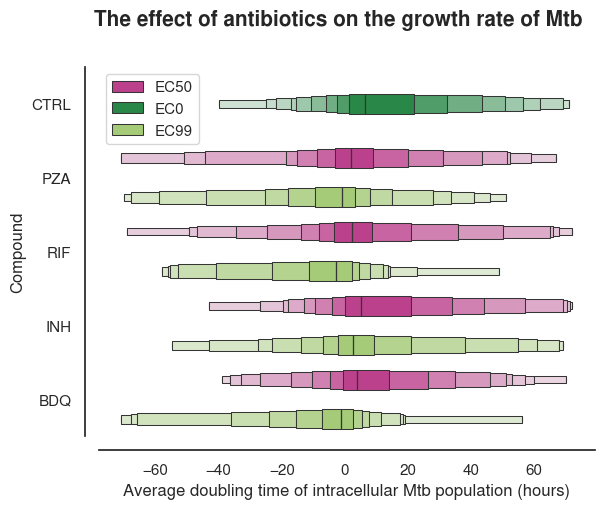

In [9]:
subset_df = df[(df['r2']>0.5) & (df['Strain/Compound'] != 'RD1')]

g = sns.boxenplot(x="dt", y="Compound",
            hue="Concentration", 
            palette=[expanded_piyg[-1], expanded_piyg[0], expanded_piyg[1]],
            data=subset_df,
            hue_order=hue_order,
            scale = 'linear'
              )  
sns.despine(offset = 10)
plt.xlabel("Average doubling time of intracellular Mtb population (hours)")
plt.gcf().suptitle('The effect of antibiotics on the growth rate of Mtb', 
                   fontsize=15, fontweight='bold', 
                  y = 1.0)
sns.despine(offset=10)
plt.legend(loc = 'upper left')
plt.savefig(os.path.join(output_dir, 'ATB_effect_dt.png'), bbox_inches = 'tight', dpi = 314)

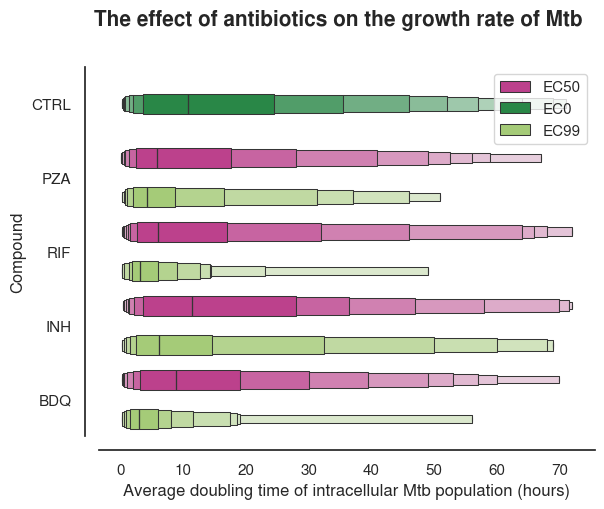

In [10]:
subset_df = df[(df['r2']>0.5) & (df['dt']>0) & (df['Strain/Compound'] != 'RD1')]

g = sns.boxenplot(x="dt", y="Compound",
            hue="Concentration", 
            palette=[expanded_piyg[-1], expanded_piyg[0], expanded_piyg[1]],
            data=subset_df, 
            hue_order=hue_order,
            scale = 'linear'
              )  
sns.despine(offset = 10)
plt.xlabel("Average doubling time of intracellular Mtb population (hours)")
plt.gcf().suptitle('The effect of antibiotics on the growth rate of Mtb', 
                   fontsize=15, fontweight='bold', 
                  y = 1.0)
sns.despine(offset=10)
plt.legend(loc = 'upper right')
plt.savefig(os.path.join(output_dir, 'ATB_effect_dt_gt0.png'), bbox_inches = 'tight', dpi = 314)